In [1]:
import pybedtools as pbt
import pysam
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as ss
from sklearn.linear_model import LinearRegression
import csv
from keras.models import load_model
from pkg_resources import resource_filename
from spliceai.utils import one_hot_encode
from maxentpy import maxent
from collections import Counter

Using TensorFlow backend.


In [2]:
import altair as alt
alt.data_transformers.enable('json')

DataTransformerRegistry.enable('json')

In [3]:
import os.path as op

In [4]:
import seaborn as sns

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
import splanl.junction_scorer as jn
import splanl.merge_bcs as mbcs
import splanl.coords as cds
import splanl.plots as sp
import splanl.score_motifs as sm
import splanl.inspect_variants as iv
import splanl.post_processing as pp
import splanl.custom_splai_scores as css
import splanl.create_vcf as vcf

In [7]:
chr11 = '/nfs/kitzman3/lab_common/refs/human/ucsc_hg19/bychrom/chr11.fa'
chr11_seq = pp.get_refseq( chr11 )[ 0 ]

In [8]:
fa_file = '/nfs/kitzman2/jacob/proj/jensplice/20220415_wt1_mpsa_trial3/jkp1053_1054_1055.fa'
refseq = pp.get_refseq( fa_file )[ 0 ]

In [9]:
isos_in = '/nfs/kitzman2/smithcat/proj/wt1_2022/ex9_data/'

In [10]:
isos_df = pd.read_table( isos_in + 'wt1_ex9_isoforms_2022-0607.txt' )

In [11]:
isos_df = isos_df.set_index( 'isonum' )

In [12]:
bdout = isos_in

In [13]:
satbls = ! ls /nfs/turbo/umms-kitzmanj/oldvol2/jacob/proj/jensplice/20220426_wt1_subasm_filter_stringent/sapipe/sa/*.haps.final.txt

In [14]:
satbl_fn = { sa.split( '/')[ -1 ].split( '.' )[ 0 ]: pd.read_table( sa ).set_index( 'readgroupid' ) for sa in satbls }

In [15]:
for lib in satbl_fn.keys():
    
    satbl_fn[ lib ] = satbl_fn[ lib ][ [ col for col in satbl_fn[ lib ] if not col.startswith( 'nbp_' ) ] ].copy()

In [165]:
bybc_tbl_l = ! ls /nfs/kitzman2/smithcat/proj/wt1_2022/ex9_data/wt1_ex9_*_by_bc_effects_allvars-2022-0607.txt

In [166]:
bybc_tbl_fn = { tbl.split( '/' )[ -1 ].split( '_' )[ 2 ]: pd.read_table( tbl )
                for tbl in bybc_tbl_l }

In [173]:
for lib in bybc_tbl_fn:
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ].n_variants_passing == 1 ) ].copy()

In [462]:
byvartbl_allisos = pd.read_table( '/nfs/kitzman2/smithcat/proj/wt1_2022/ex9_data/wt1_ex9_by_var_effects_allisos_snvs-2022-0607.txt' )

In [19]:
byvartbl_long = pd.read_table( bdout + 'wt1_ex9_by_var_effects_snvs-2022-0607.txt' )

In [20]:
#extra variants in 5' end of intronic region - just get rid of them right away bc they're confusing
byvartbl_long = byvartbl_long.loc[ byvartbl_long.pos >= 1227 ].copy()

In [21]:
byvartbl_long[ 'sample' ].unique()

array(['BB_test_Cos1053_JKLab0340_MM1B', 'BB_test_Cos1053_JKLab0340_MM2B',
       'BB_test_Cos1053_oligodT_MM1B', 'BB_test_Cos1053_oligodT_MM2B',
       'BB_RT_1_340_243_Cos1053', 'BB_RT_1_340_243_Hek1053',
       'BB_RT_1_340_335_Cos1053', 'BB_RT_1_340_335_Hek1053',
       'BB_RT_1b_340_243_Hek1053', 'BB_RT_1b_340_335_Hek1053',
       'BB_RT_1b_ODT_243_Hek1053', 'BB_RT_1b_ODT_335_Hek1053',
       'BB_RT_1_ODT_243_Cos1053', 'BB_RT_1_ODT_243_Hek1053',
       'BB_RT_1_ODT_335_Cos1053', 'BB_RT_1_ODT_335_Hek1053',
       'BB_RT_2_340_243_Cos1054', 'BB_RT_2_340_243_Hek1054',
       'BB_RT_2_340_335_Cos1054', 'BB_RT_2_340_335_Hek1054',
       'BB_RT_2_ODT_243_Cos1054', 'BB_RT_2_ODT_243_Hek1054',
       'BB_RT_2_ODT_335_Cos1054', 'BB_RT_2_ODT_335_Hek1054',
       'BB_RT_3_340_243_Cos1055', 'BB_RT_3_340_243_Hek1055',
       'BB_RT_3_340_335_Cos1055', 'BB_RT_3_340_335_Hek1055',
       'BB_RT_3_ODT_243_Cos1055', 'BB_RT_3_ODT_243_Hek1055',
       'BB_RT_3_ODT_335_cos1055', 'BB_RT_3_ODT_335_Hek105

BB_test_Cos1053_JKLab0340_MM1B


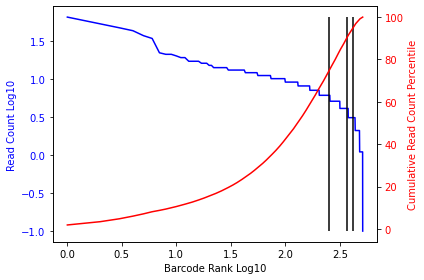

The read count cut off at the 75 th percentile is 6
The read count cut off at the 90 th percentile is 4
The read count cut off at the 95 th percentile is 3
BB_test_Cos1053_JKLab0340_MM2B


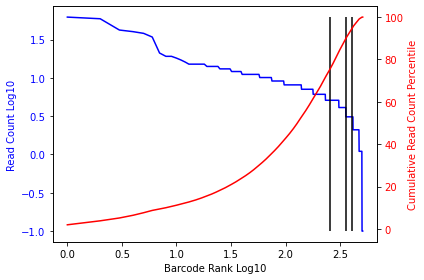

The read count cut off at the 75 th percentile is 5
The read count cut off at the 90 th percentile is 3
The read count cut off at the 95 th percentile is 3
BB_test_Cos1053_oligodT_MM1B


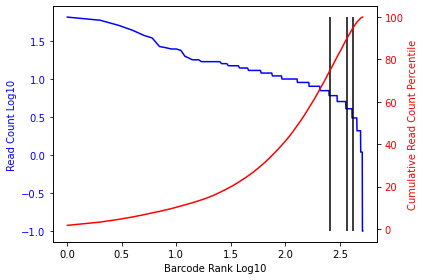

The read count cut off at the 75 th percentile is 6
The read count cut off at the 90 th percentile is 4
The read count cut off at the 95 th percentile is 3
BB_test_Cos1053_oligodT_MM2B


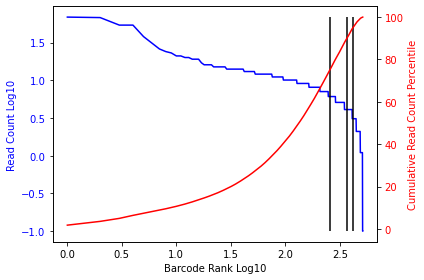

The read count cut off at the 75 th percentile is 6
The read count cut off at the 90 th percentile is 4
The read count cut off at the 95 th percentile is 3
BB_RT_1_340_243_Cos1053


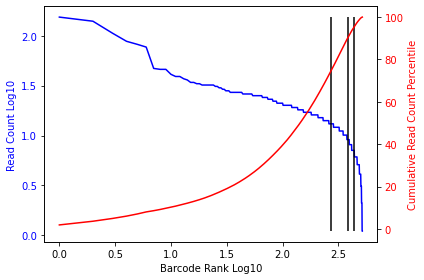

The read count cut off at the 75 th percentile is 13
The read count cut off at the 90 th percentile is 9
The read count cut off at the 95 th percentile is 7
BB_RT_1_340_243_Hek1053


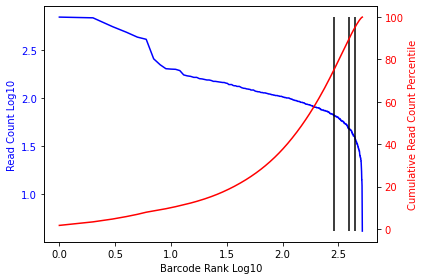

The read count cut off at the 75 th percentile is 66
The read count cut off at the 90 th percentile is 48
The read count cut off at the 95 th percentile is 39
BB_RT_1_340_335_Cos1053


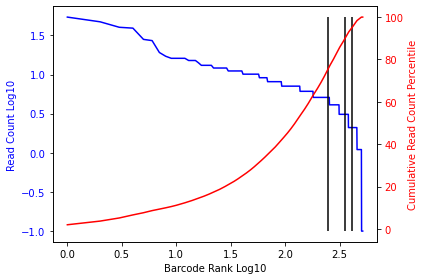

The read count cut off at the 75 th percentile is 5
The read count cut off at the 90 th percentile is 3
The read count cut off at the 95 th percentile is 2
BB_RT_1_340_335_Hek1053


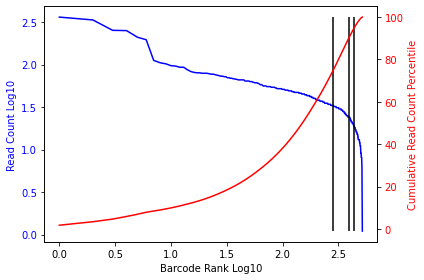

The read count cut off at the 75 th percentile is 33
The read count cut off at the 90 th percentile is 24
The read count cut off at the 95 th percentile is 19
BB_RT_1b_340_243_Hek1053


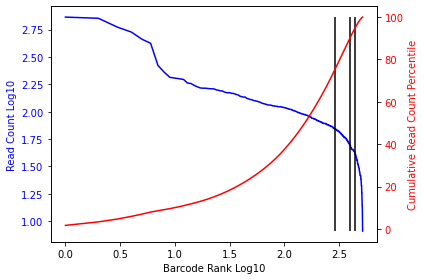

The read count cut off at the 75 th percentile is 70
The read count cut off at the 90 th percentile is 50
The read count cut off at the 95 th percentile is 41
BB_RT_1b_340_335_Hek1053


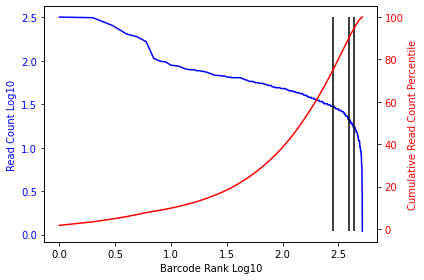

The read count cut off at the 75 th percentile is 30
The read count cut off at the 90 th percentile is 21
The read count cut off at the 95 th percentile is 17
BB_RT_1b_ODT_243_Hek1053


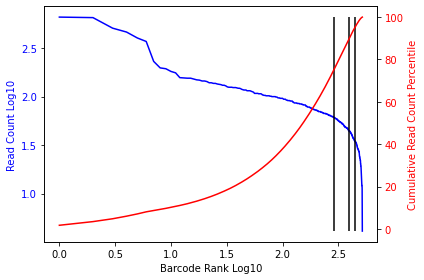

The read count cut off at the 75 th percentile is 61
The read count cut off at the 90 th percentile is 44
The read count cut off at the 95 th percentile is 35
BB_RT_1b_ODT_335_Hek1053


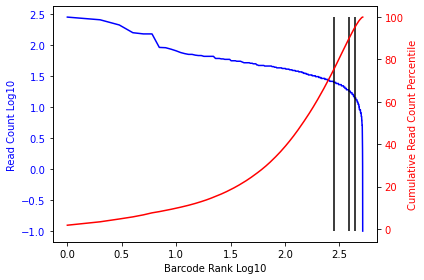

The read count cut off at the 75 th percentile is 25
The read count cut off at the 90 th percentile is 18
The read count cut off at the 95 th percentile is 14
BB_RT_1_ODT_243_Cos1053


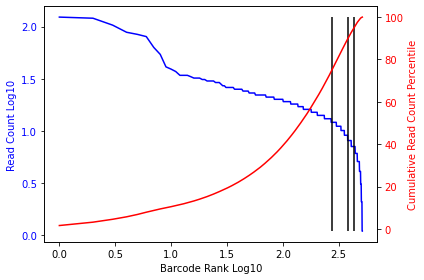

The read count cut off at the 75 th percentile is 12
The read count cut off at the 90 th percentile is 8
The read count cut off at the 95 th percentile is 7
BB_RT_1_ODT_243_Hek1053


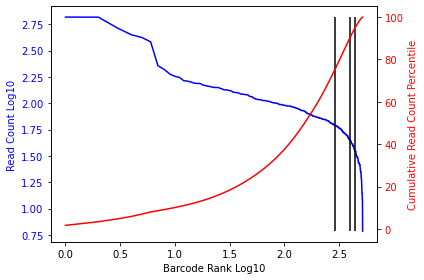

The read count cut off at the 75 th percentile is 62
The read count cut off at the 90 th percentile is 45
The read count cut off at the 95 th percentile is 35
BB_RT_1_ODT_335_Cos1053


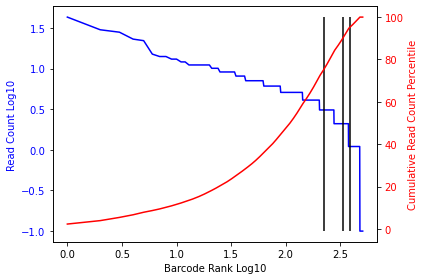

The read count cut off at the 75 th percentile is 3
The read count cut off at the 90 th percentile is 2
The read count cut off at the 95 th percentile is 1
BB_RT_1_ODT_335_Hek1053


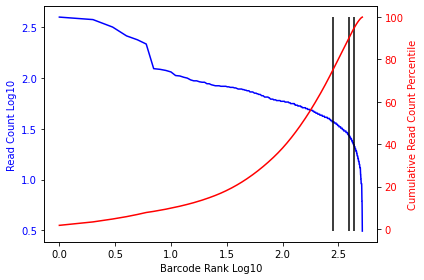

The read count cut off at the 75 th percentile is 37
The read count cut off at the 90 th percentile is 27
The read count cut off at the 95 th percentile is 21
BB_RT_2_340_243_Cos1054


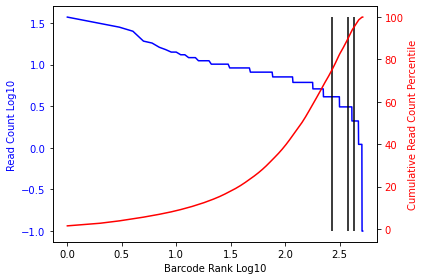

The read count cut off at the 75 th percentile is 4
The read count cut off at the 90 th percentile is 3
The read count cut off at the 95 th percentile is 2
BB_RT_2_340_243_Hek1054


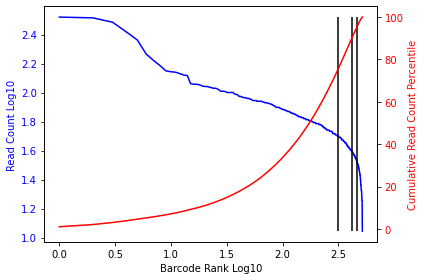

The read count cut off at the 75 th percentile is 50
The read count cut off at the 90 th percentile is 39
The read count cut off at the 95 th percentile is 34
BB_RT_2_340_335_Cos1054


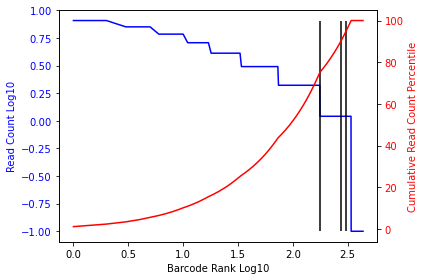

The read count cut off at the 75 th percentile is 2
The read count cut off at the 90 th percentile is 1
The read count cut off at the 95 th percentile is 1
BB_RT_2_340_335_Hek1054


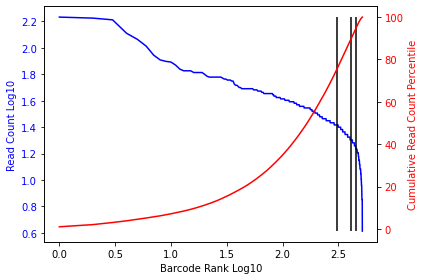

The read count cut off at the 75 th percentile is 26
The read count cut off at the 90 th percentile is 20
The read count cut off at the 95 th percentile is 17
BB_RT_2_ODT_243_Cos1054


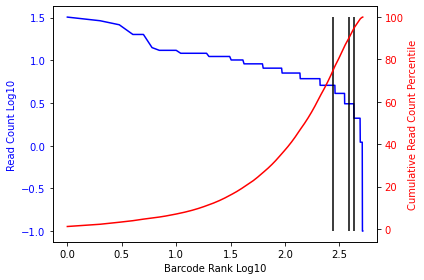

The read count cut off at the 75 th percentile is 5
The read count cut off at the 90 th percentile is 3
The read count cut off at the 95 th percentile is 2
BB_RT_2_ODT_243_Hek1054


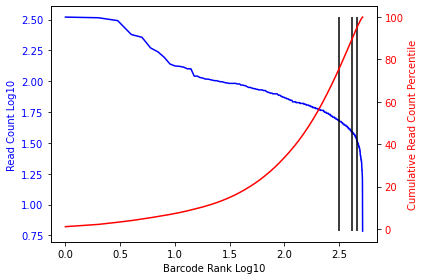

The read count cut off at the 75 th percentile is 48
The read count cut off at the 90 th percentile is 39
The read count cut off at the 95 th percentile is 33
BB_RT_2_ODT_335_Cos1054


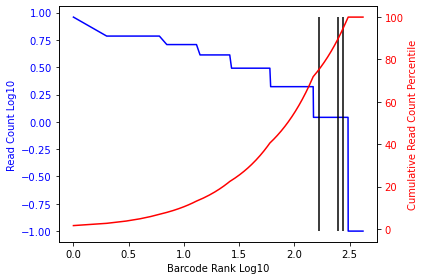

The read count cut off at the 75 th percentile is 1
The read count cut off at the 90 th percentile is 1
The read count cut off at the 95 th percentile is 1
BB_RT_2_ODT_335_Hek1054


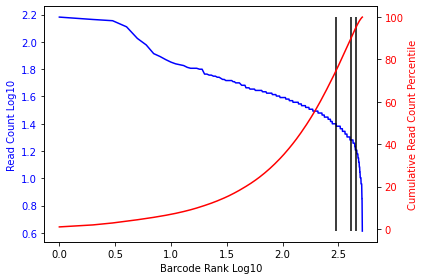

The read count cut off at the 75 th percentile is 24
The read count cut off at the 90 th percentile is 19
The read count cut off at the 95 th percentile is 16
BB_RT_3_340_243_Cos1055


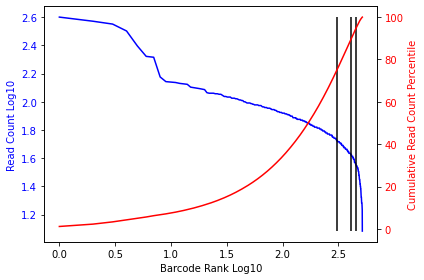

The read count cut off at the 75 th percentile is 53
The read count cut off at the 90 th percentile is 42
The read count cut off at the 95 th percentile is 35
BB_RT_3_340_243_Hek1055


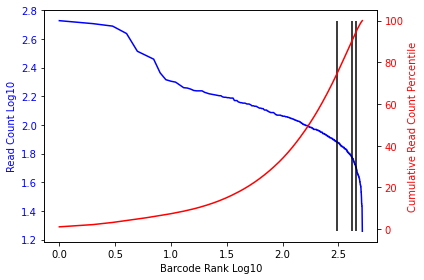

The read count cut off at the 75 th percentile is 76
The read count cut off at the 90 th percentile is 60
The read count cut off at the 95 th percentile is 49
BB_RT_3_340_335_Cos1055


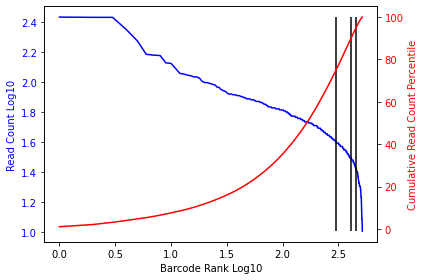

The read count cut off at the 75 th percentile is 40
The read count cut off at the 90 th percentile is 31
The read count cut off at the 95 th percentile is 26
BB_RT_3_340_335_Hek1055


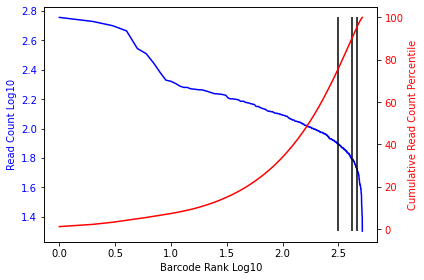

The read count cut off at the 75 th percentile is 79
The read count cut off at the 90 th percentile is 62
The read count cut off at the 95 th percentile is 54
BB_RT_3_ODT_243_Cos1055


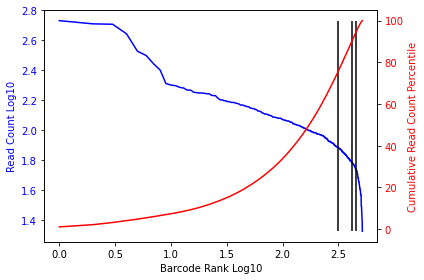

The read count cut off at the 75 th percentile is 77
The read count cut off at the 90 th percentile is 61
The read count cut off at the 95 th percentile is 54
BB_RT_3_ODT_243_Hek1055


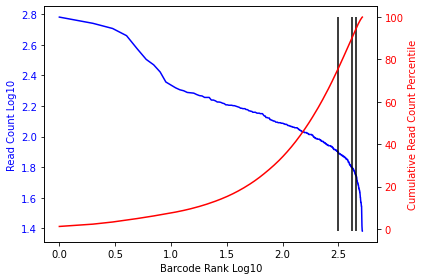

The read count cut off at the 75 th percentile is 80
The read count cut off at the 90 th percentile is 63
The read count cut off at the 95 th percentile is 54
BB_RT_3_ODT_335_cos1055


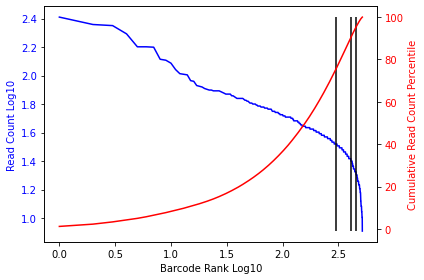

The read count cut off at the 75 th percentile is 33
The read count cut off at the 90 th percentile is 26
The read count cut off at the 95 th percentile is 21
BB_RT_3_ODT_335_Hek1055


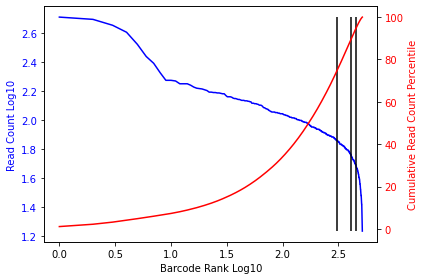

The read count cut off at the 75 th percentile is 72
The read count cut off at the 90 th percentile is 56
The read count cut off at the 95 th percentile is 47


In [22]:
bc_cutoffs_d = { 'sample': [],
                 '75_x': [],
                 '90_x': [],
                 '95_x': [],
                 '75_y': [],
                 '90_y': [],
                 '95_y': [], }

for samp in byvartbl_long[ 'sample' ].unique():
    
    print(samp)
    
    bc_cutoffs_d[ 'sample' ].append( samp )
    
    x_cuts,y_cuts = sp.waterfall_plot( byvartbl_long.loc[ byvartbl_long[ 'sample' ] == samp ],
                                       'n_bc_passfilt',
                                       [ 75, 90, 95 ] )
    
    for cut in x_cuts:

        bc_cutoffs_d[ str( cut ) + '_x' ].append( 10**( x_cuts[ cut ] ) )
        bc_cutoffs_d[ str( cut ) + '_y' ].append( y_cuts[ cut ] )

In [23]:
bc_cutoffs = pd.DataFrame( bc_cutoffs_d )

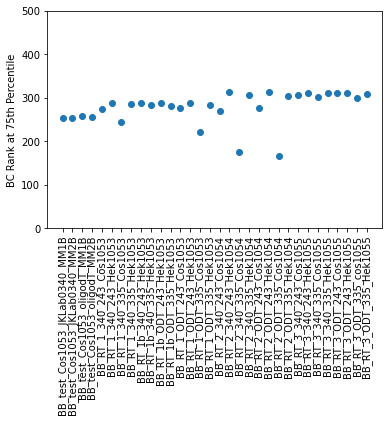

In [24]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '75_x' ] )

plt.xticks( rotation = 90 )

plt.ylabel( 'BC Rank at 75th Percentile' )

plt.ylim( 0, 500 )

plt.show()

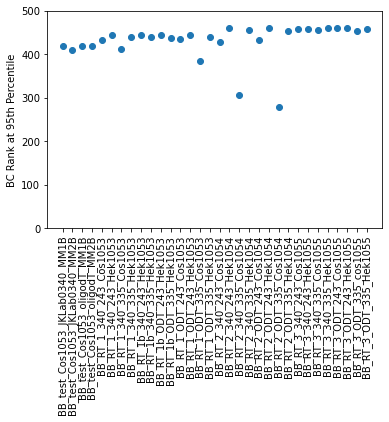

In [25]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '95_x' ] )

plt.xticks( rotation = 90 )

plt.ylabel( 'BC Rank at 95th Percentile' )

plt.ylim( 0, 500 )

plt.show()

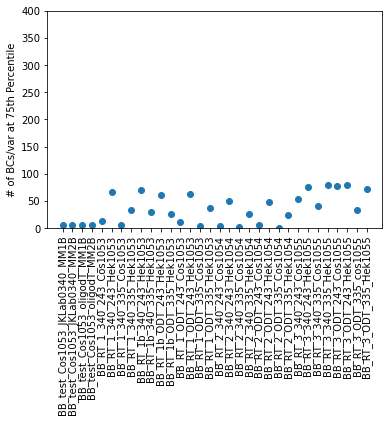

In [26]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '75_y' ] )

plt.xticks( rotation = 90 )

plt.ylabel( '# of BCs/var at 75th Percentile')

plt.ylim( ( 0, 400 ) )

plt.show()

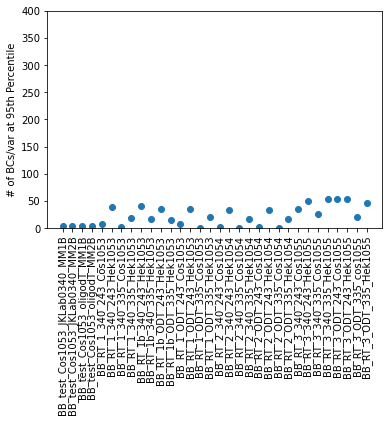

In [27]:
plt.scatter( bc_cutoffs[ 'sample' ],
             bc_cutoffs[ '95_y' ] )

plt.xticks( rotation = 90 )

plt.ylabel( '# of BCs/var at 95th Percentile')

plt.ylim( ( 0, 400 ) )

plt.show()

In [28]:
samp_by_rep_fn = {}

for samp in byvartbl_long['sample'].unique().tolist():
    
    if '_test_' in samp:
        rep = 'test'
    else:
        rep = samp.split( '_' )[ 2 ]
        
    if rep in samp_by_rep_fn:
        samp_by_rep_fn[ rep ].append( samp )
    else:
        samp_by_rep_fn[ rep ] = [ samp ]

In [29]:
byvartbl_long[ 'rep' ] = [ 'test' if '_test_' in samp else samp.split( '_' )[ 2 ]
                           for samp in byvartbl_long[ 'sample' ] ]

In [30]:
sample_stats = pp.across_sample_stats( [ byvartbl_long.loc[ ( byvartbl_long.pos >= 1227 ) & ( byvartbl_long.rep == rep ) ] for rep in samp_by_rep_fn ],
                                        samp_by_rep_fn,
                                        [ 'wmean_OTHER', 'wmean_SKIP', 'wmean_KTS+', 'wmean_KTS-' ]
                                       ) 

In [31]:
colors = { '1':'green', '1b':'blue', '2':'red', '3':'orange', 'test':'purple' }

per_var_seen


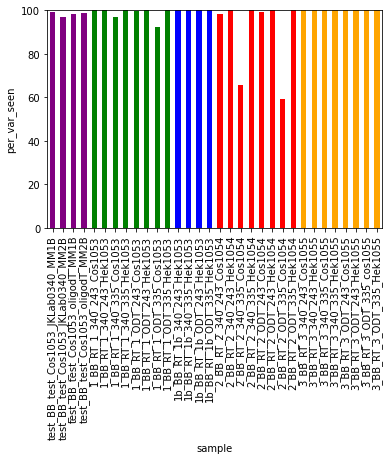

per_reads_passfilt


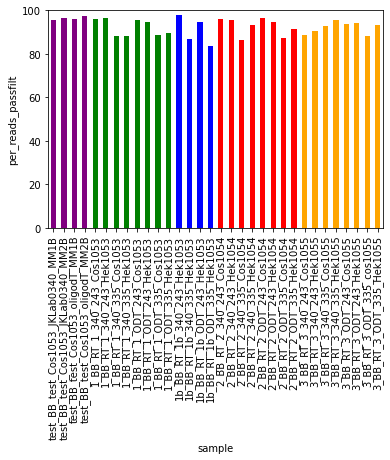

per_bc_passfilt


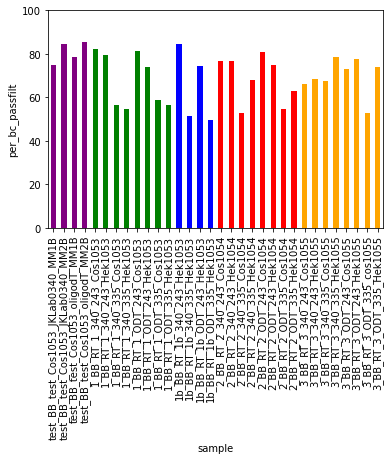

per_usable


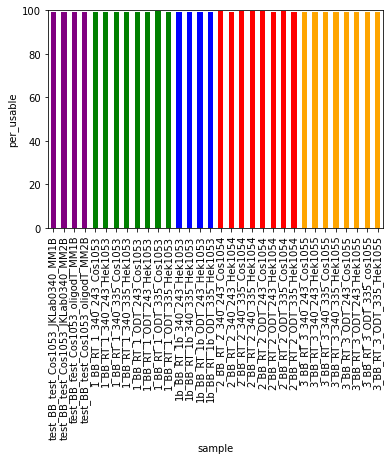

per_unmapped


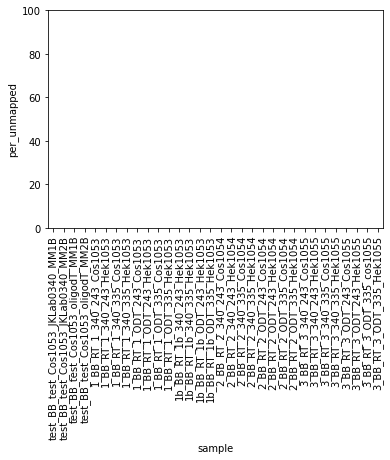

per_badstart


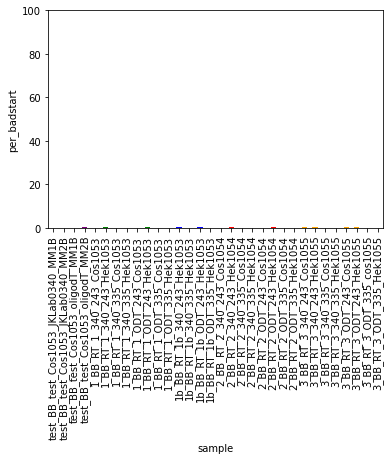

per_badend


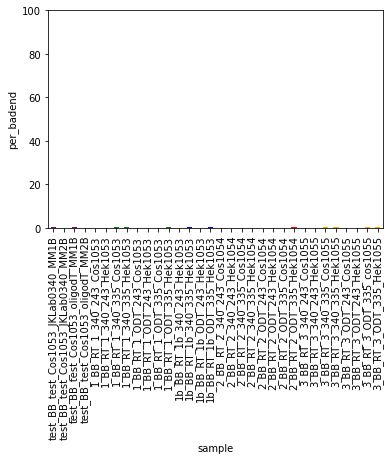

per_softclip


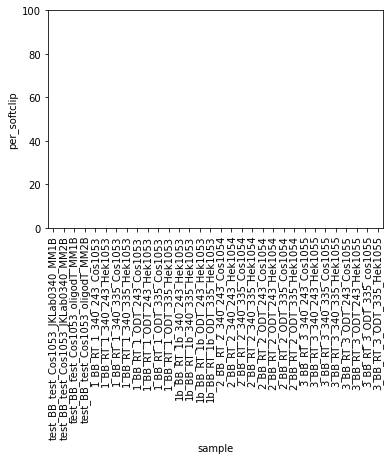

per_otheriso


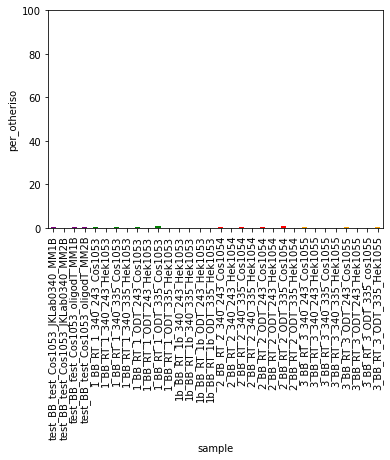

All missing for per_sdv - skipping...
All missing for per_sdv_ex - skipping...
All missing for per_sdv_in - skipping...
All missing for per_acc_used - skipping...
All missing for per_don_used - skipping...


In [32]:
for col in [ col for col in sample_stats if col.startswith( 'per_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   y_lim = ( 0, 100 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

per_unmapped


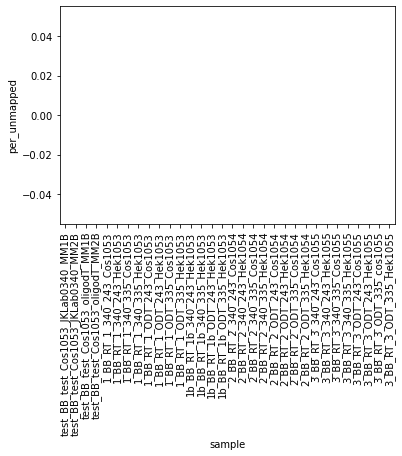

per_badstart


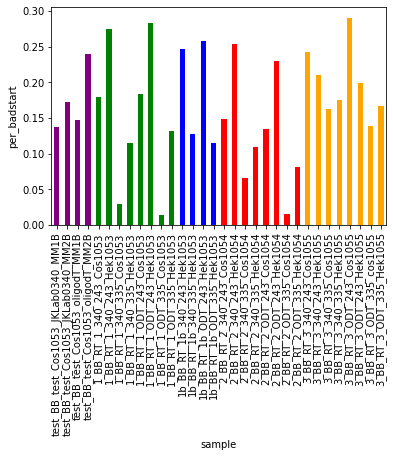

per_badend


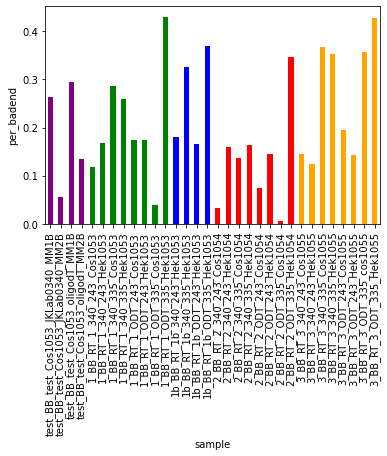

per_softclip


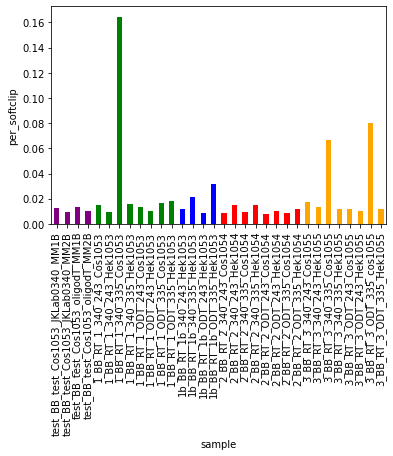

per_otheriso


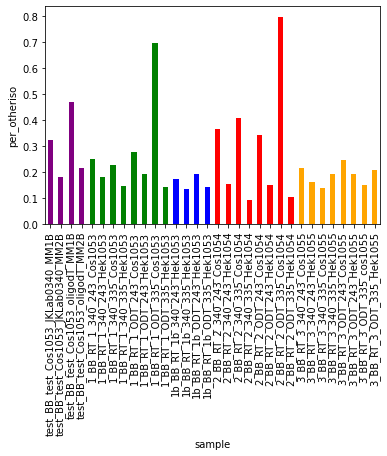

All missing for per_sdv - skipping...
All missing for per_sdv_ex - skipping...
All missing for per_sdv_in - skipping...
All missing for per_acc_used - skipping...
All missing for per_don_used - skipping...


In [33]:
for col in [ col for col in sample_stats if col.startswith( 'per_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    elif sample_stats[ col ].max() > 50:
        
        continue
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   #y_lim = ( 0, 100 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

psbl_var


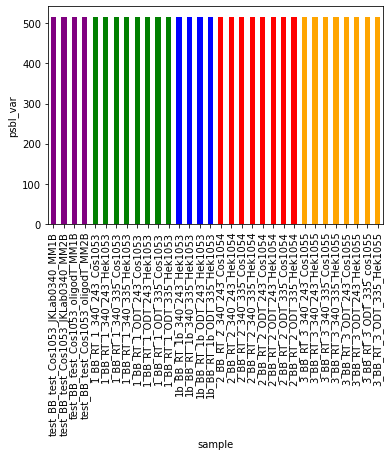

n_var


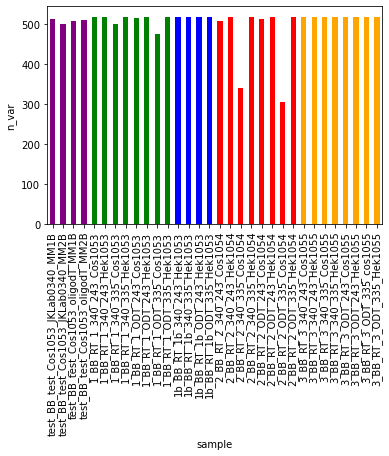

All missing for n_var_ex - skipping...
All missing for n_var_in - skipping...
n_reads


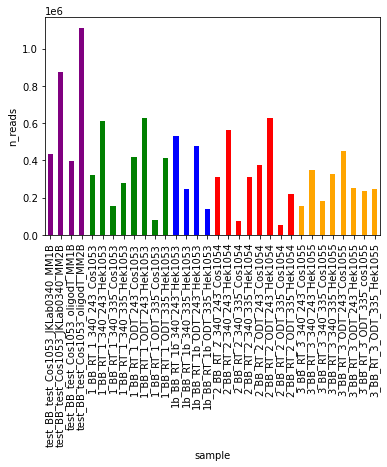

n_reads_passfilt


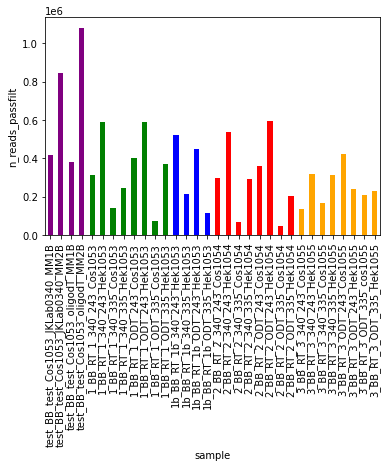

n_usable_reads


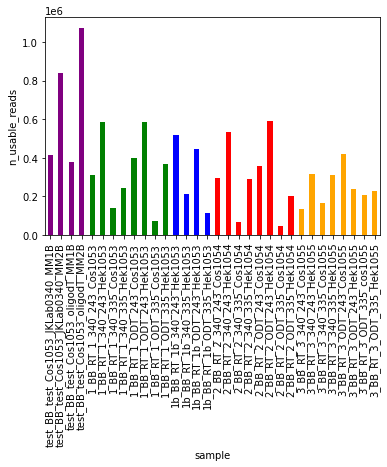

n_bc


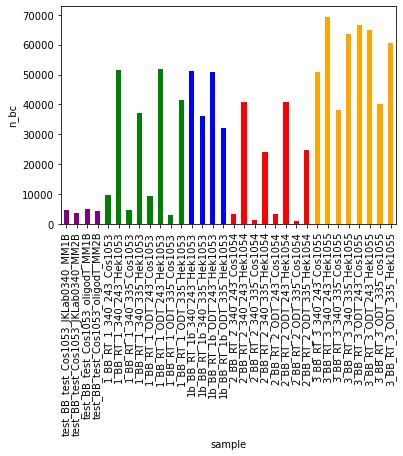

n_bc_passfilt


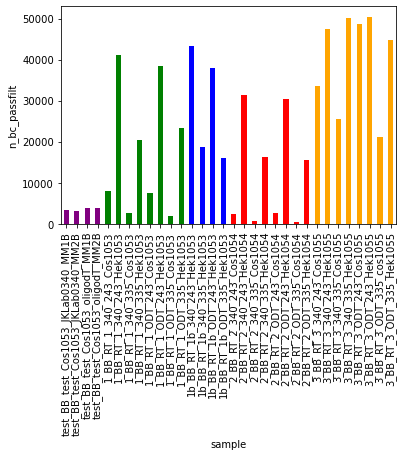

n_unmapped


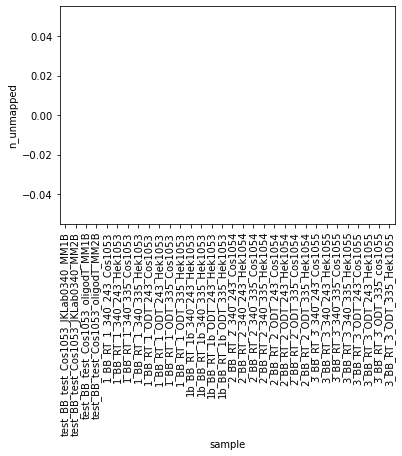

n_badstart


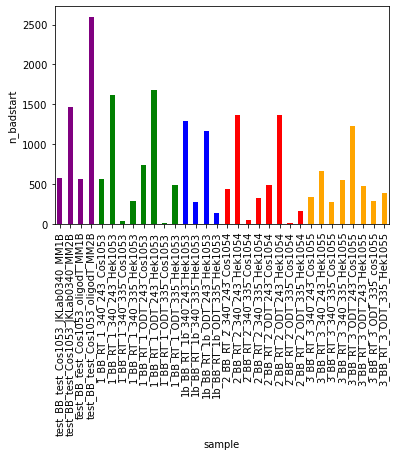

n_badend


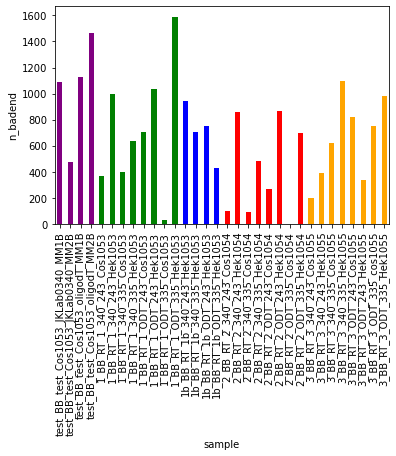

n_softclip


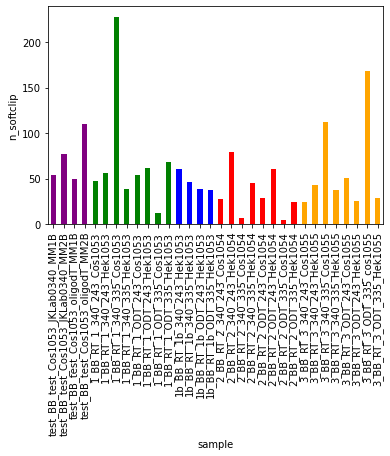

n_otheriso


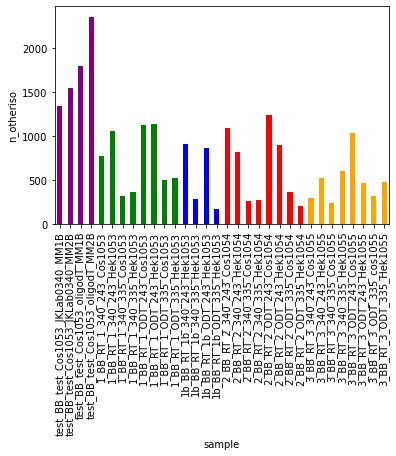

All missing for n_sdv - skipping...
All missing for n_sdv_ex - skipping...
All missing for n_sdv_in - skipping...
All missing for psbl_alt_acc - skipping...
All missing for psbl_alt_don - skipping...
All missing for n_alt_acc - skipping...
All missing for n_alt_don - skipping...
med_wmean_OTHER


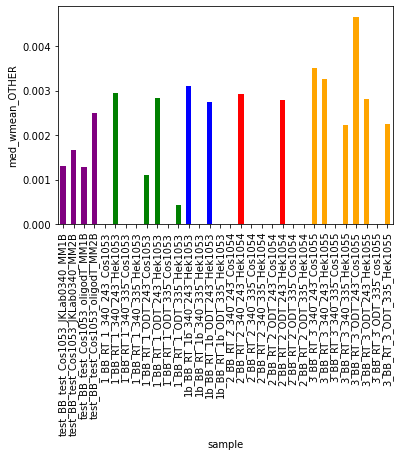

med_wmean_SKIP


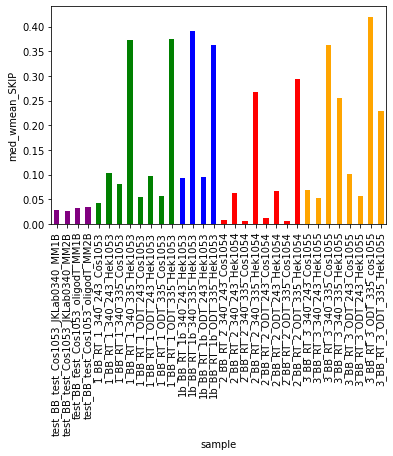

med_wmean_KTS+


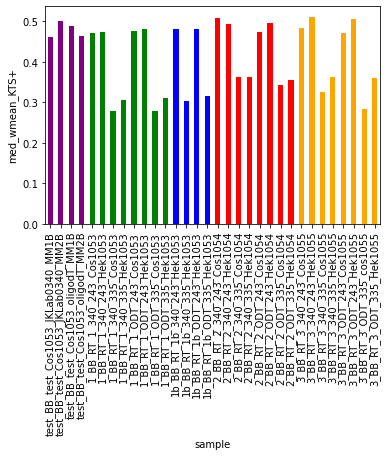

med_wmean_KTS-


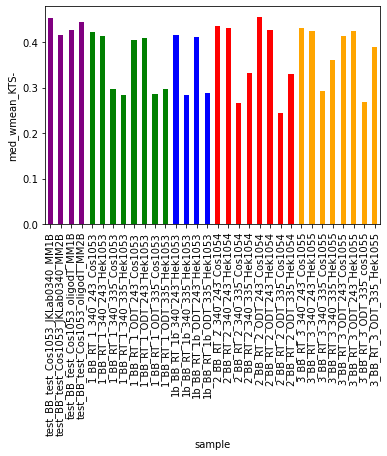

In [34]:
for col in [ col for col in sample_stats if not col.startswith( 'per_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    elif 'sample' in col:
        continue
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   #y_lim = ( 0, 100 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

med_wmean_OTHER


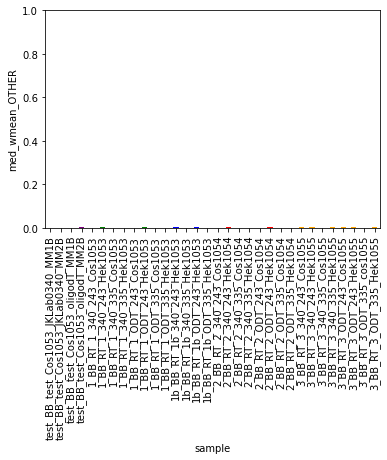

med_wmean_SKIP


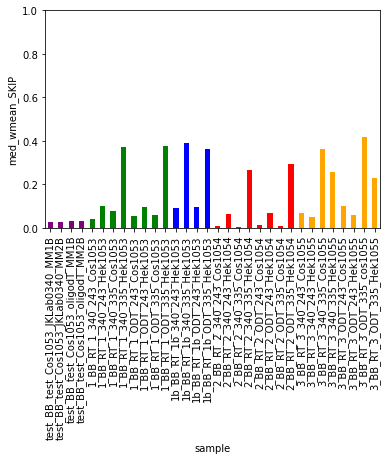

med_wmean_KTS+


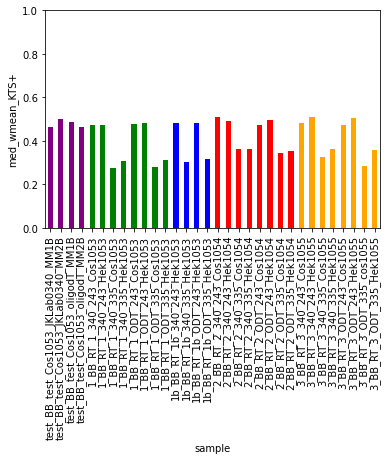

med_wmean_KTS-


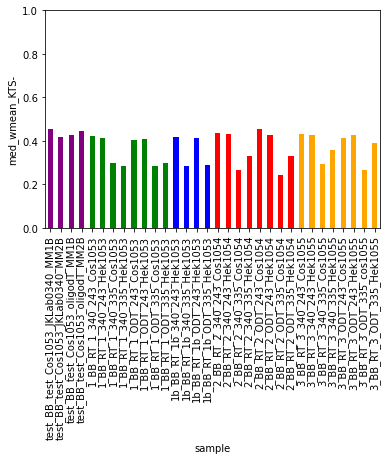

In [35]:
for col in [ col for col in sample_stats if col.startswith( 'med_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   y_lim = ( 0, 1 ),
                                    color_col = 'sample_group',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

In [36]:
sample_stats[ 'sample_group_primer' ] = sample_stats[ 'sample' ].apply( lambda x: x.split( '_' )[ -2 ] if 'test' not in x else 'test' )

In [37]:
colors = { '243':'green', '335':'red', 'test':'purple' }

med_wmean_OTHER


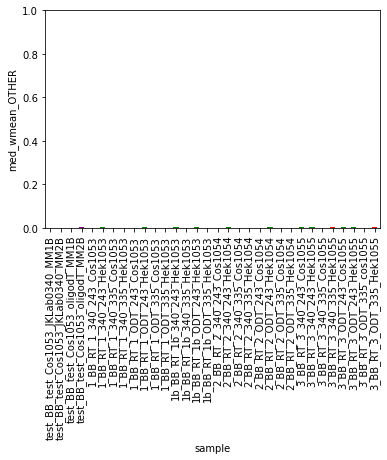

med_wmean_SKIP


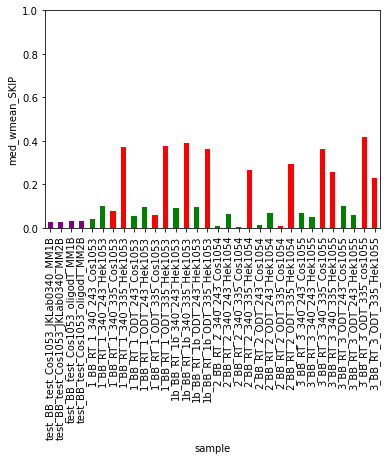

med_wmean_KTS+


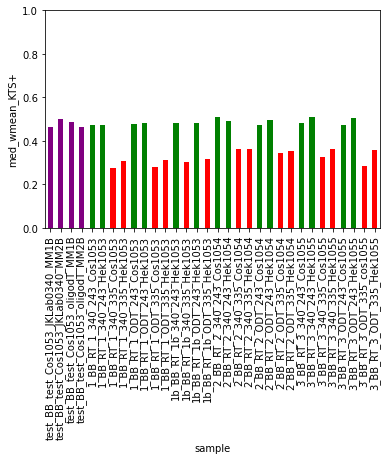

med_wmean_KTS-


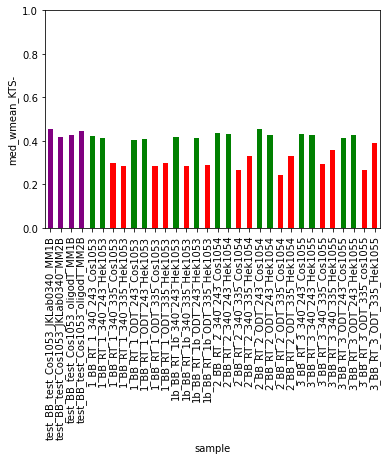

In [38]:
#same as above but colored by primer
for col in [ col for col in sample_stats if col.startswith( 'med_' ) ]:
    
    if sample_stats[ col ].notnull().sum() == 0:
        
        print( 'All missing for %s - skipping...' % col )
        
    else:
        
        print( col )
        
        sp.barplot_across_samples( sample_stats,
                                   col,
                                   y_label = col,
                                   y_lim = ( 0, 1 ),
                                    color_col = 'sample_group_primer',
                                    color_dict = colors,
                                    #title = 'Percent of INTRONIC variants that are splice disrupting by sample' 
                                 )

In [72]:
sat_dfs = []

for samp in byvartbl_long[ 'sample' ].unique():
    
    sat_samp = pp.saturate_variants( byvartbl_long.loc[ byvartbl_long[ 'sample' ] == samp ],
                                     chr11_seq,
                                     'hg19_pos',
                                      'exon_num',
                                      rev_strand = True )[ 9 ]
    
    sat_samp[ 'sample' ] = samp
    
    sat_dfs.append( sat_samp )

byvartbl_sat = pd.concat( sat_dfs )

In [73]:
#plots get messed up without the vector position included
byvartbl_sat[ 'pos' ] = byvartbl_sat.hg19_pos - 32412079 - 2*( byvartbl_sat.hg19_pos - byvartbl_sat.hg19_pos.min() )

In [74]:
byvartbl_sat[ 'hgvs_pos' ] = cds.pos_to_hgvspos( byvartbl_sat.pos,
                                                 ( 1058, 1554 ),
                                                [ (1267, 1359) ],
                                                [ ( 1355, 1447 ), ]
                                                )

In [75]:
github_colors = '3182bd6baed69ecae1c6dbefe6550dfd8d3cfdae6bfdd0a231a35474c476a1d99bc7e9c0756bb19e9ac8bcbddcdadaeb636363969696bdbdbdd9d9d9'

In [76]:
light_colors = [ '#' + github_colors[i:i+6] for i in range( 0, len( github_colors ), 6 ) ]

BB_test_Cos1053_JKLab0340_MM1B


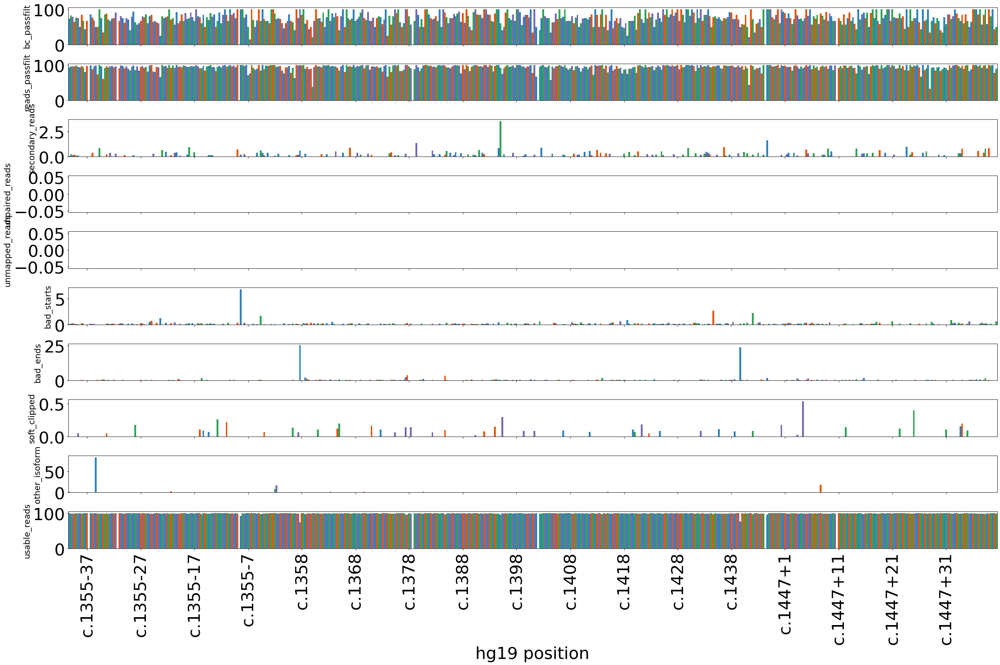

BB_test_Cos1053_JKLab0340_MM2B


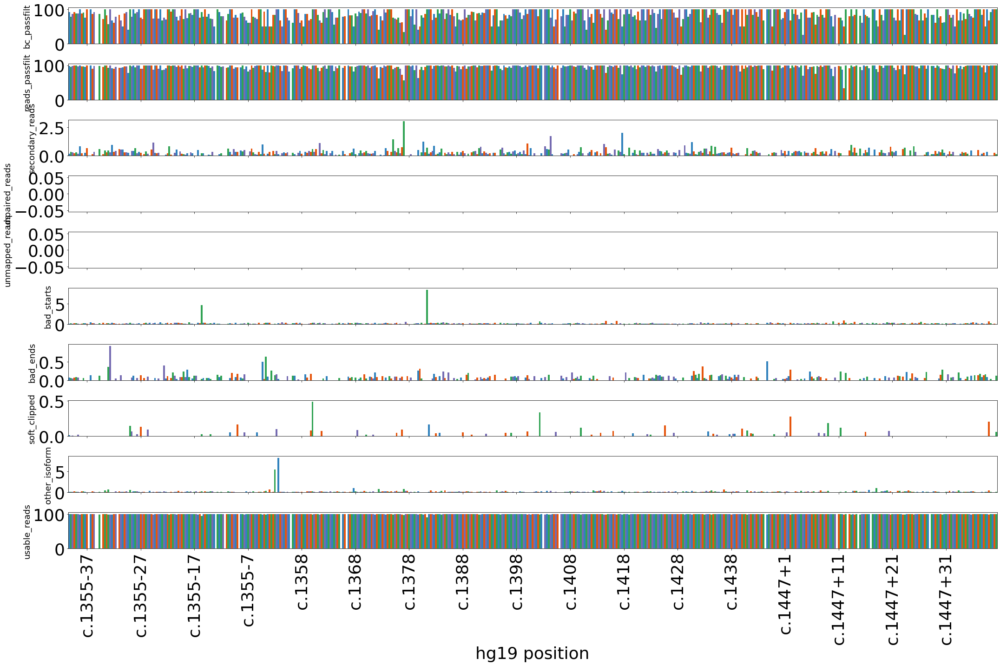

BB_test_Cos1053_oligodT_MM1B


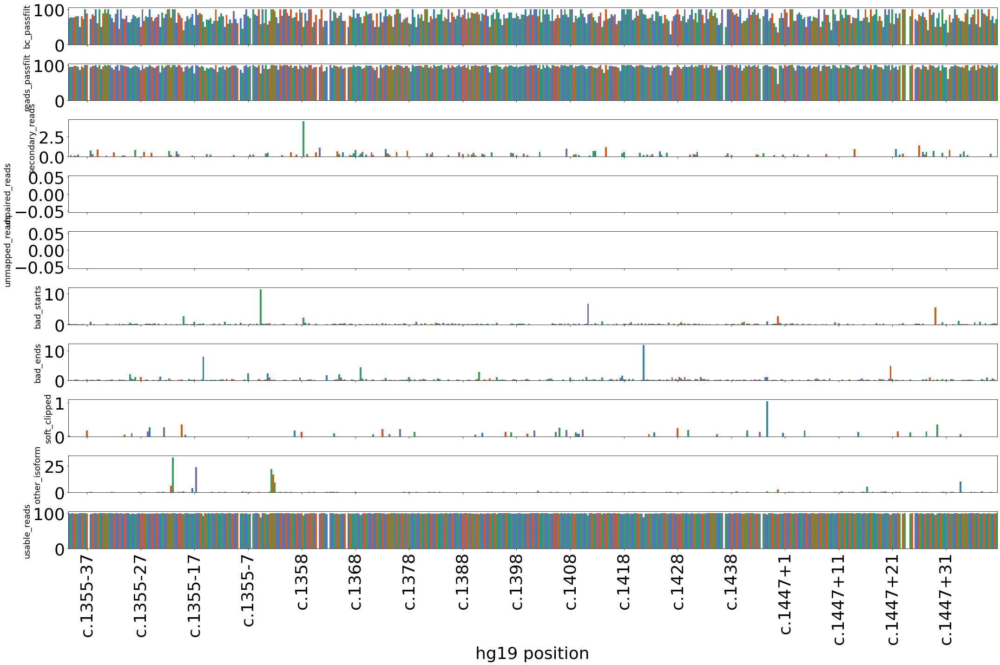

BB_test_Cos1053_oligodT_MM2B


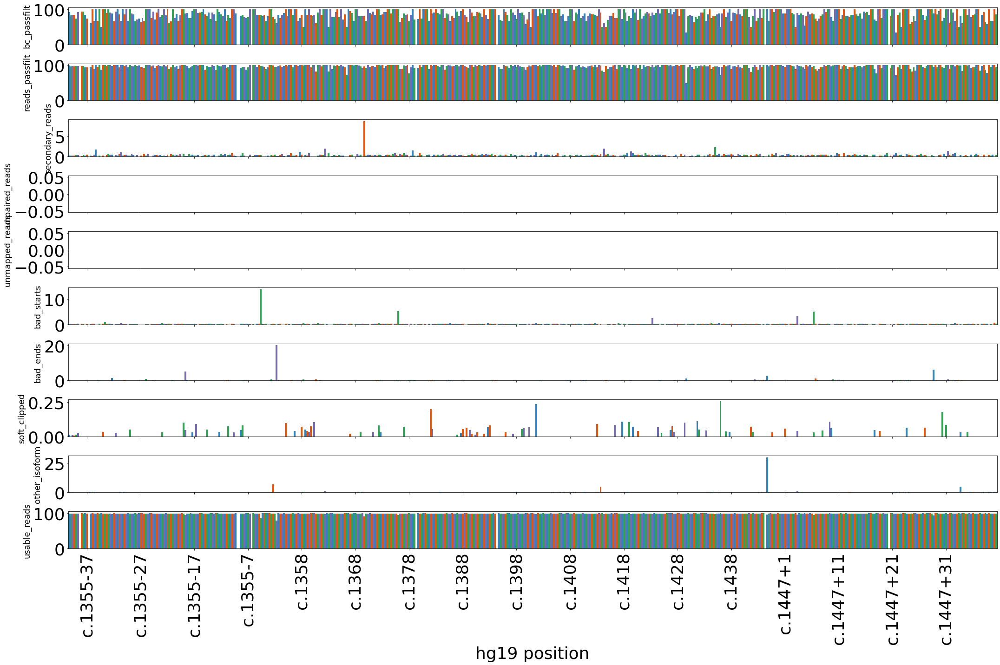

BB_RT_1_340_243_Cos1053


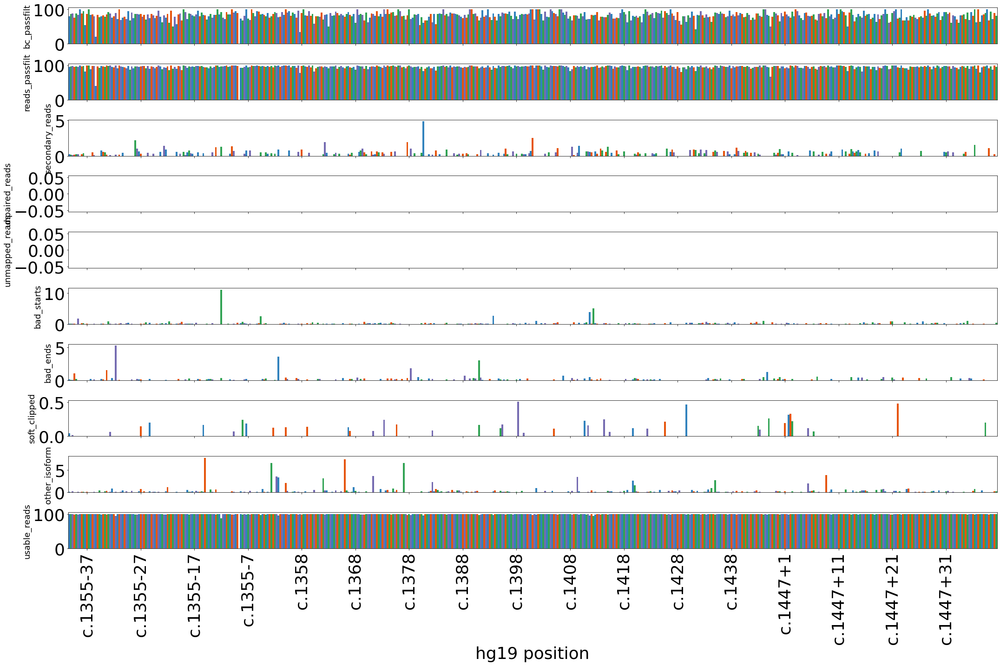

BB_RT_1_340_243_Hek1053


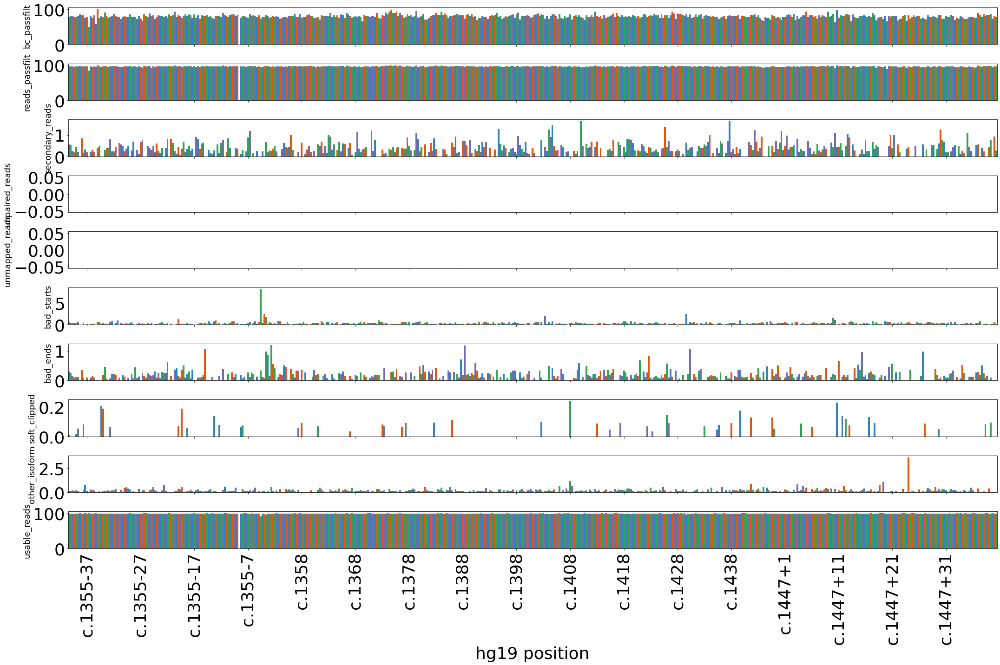

BB_RT_1_340_335_Cos1053


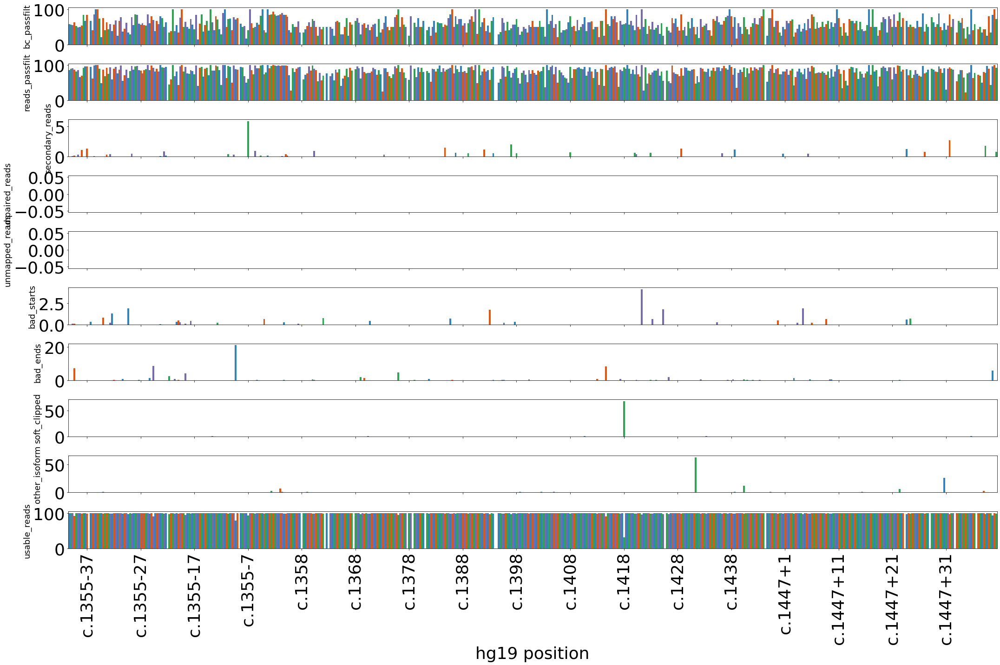

BB_RT_1_340_335_Hek1053


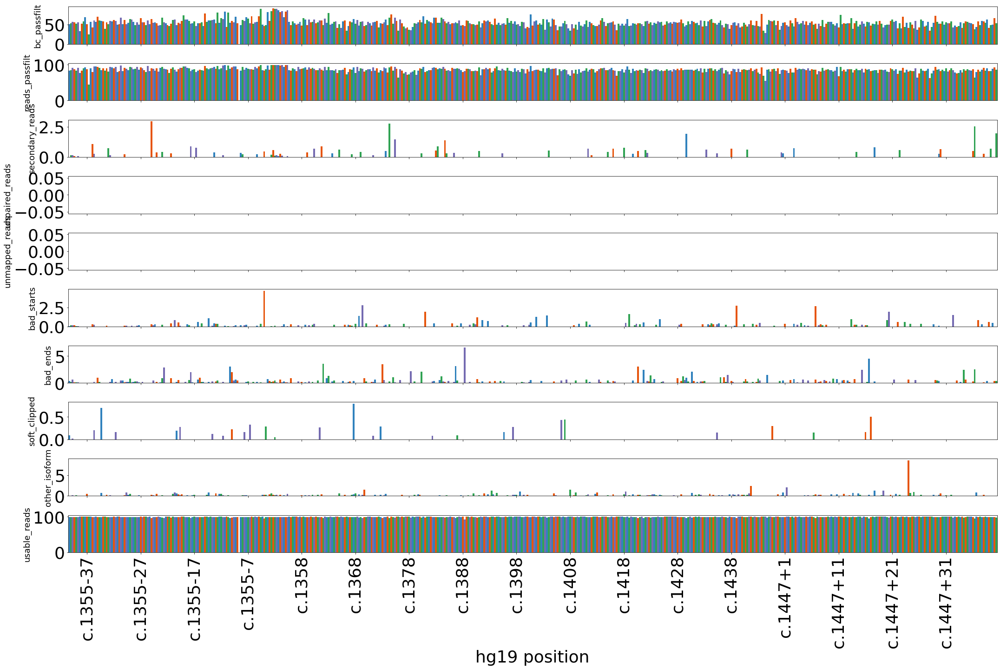

BB_RT_1b_340_243_Hek1053


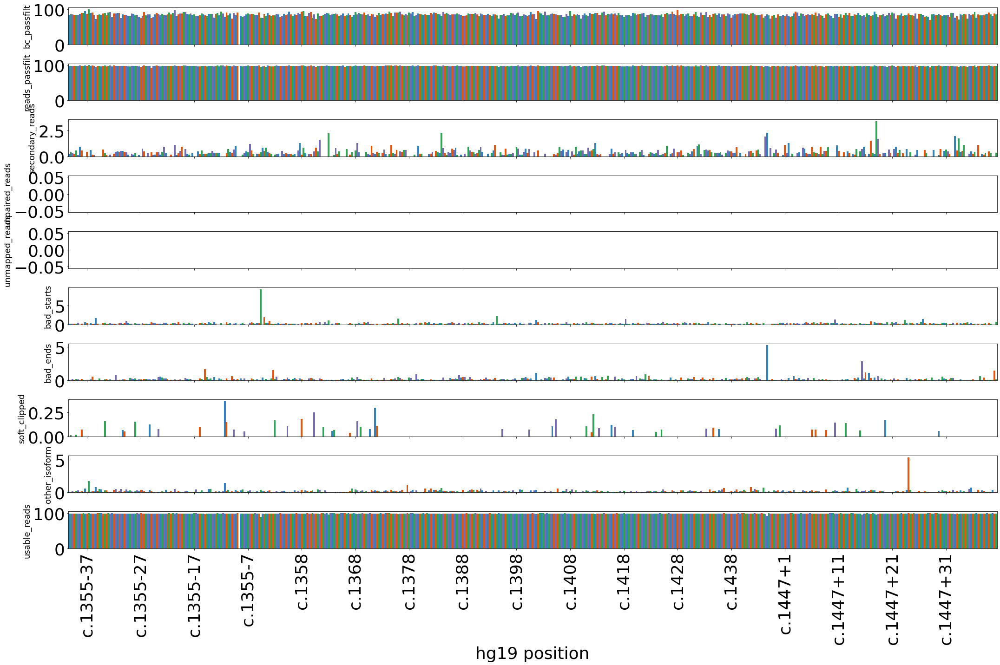

BB_RT_1b_340_335_Hek1053


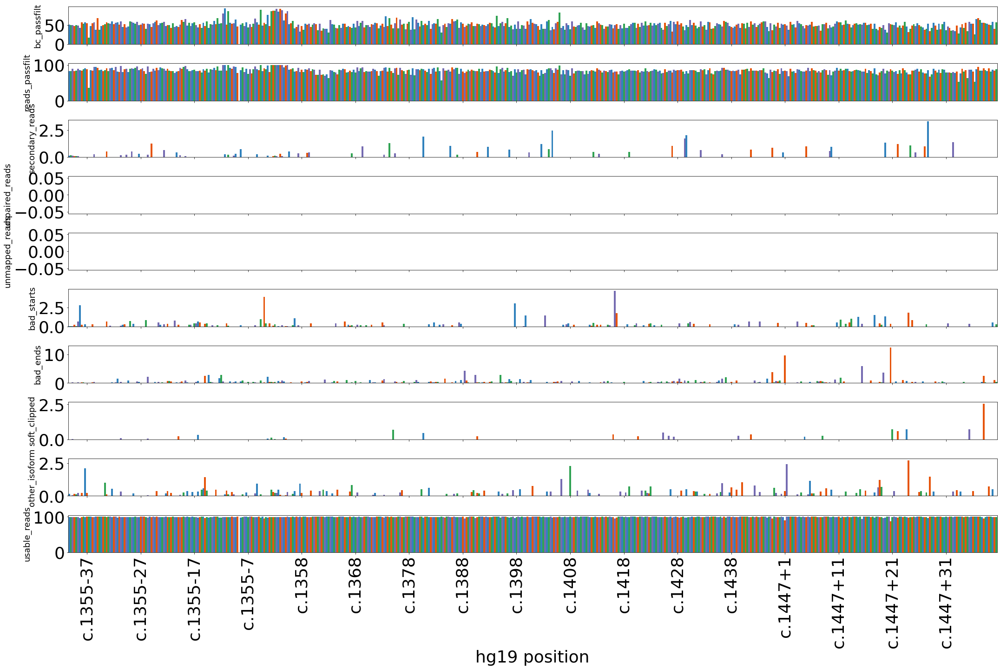

BB_RT_1b_ODT_243_Hek1053


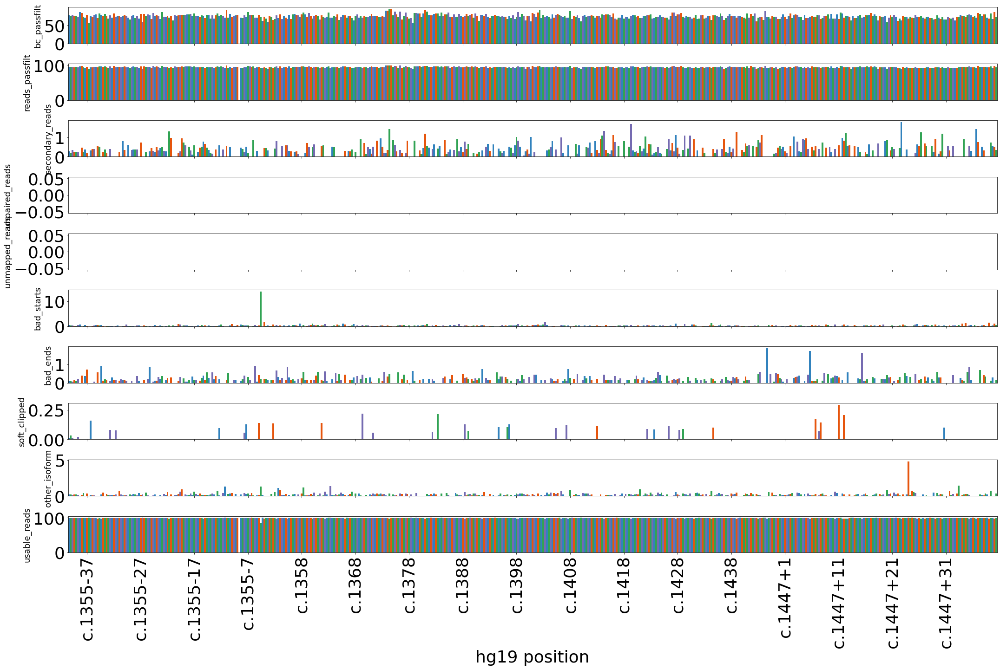

BB_RT_1b_ODT_335_Hek1053


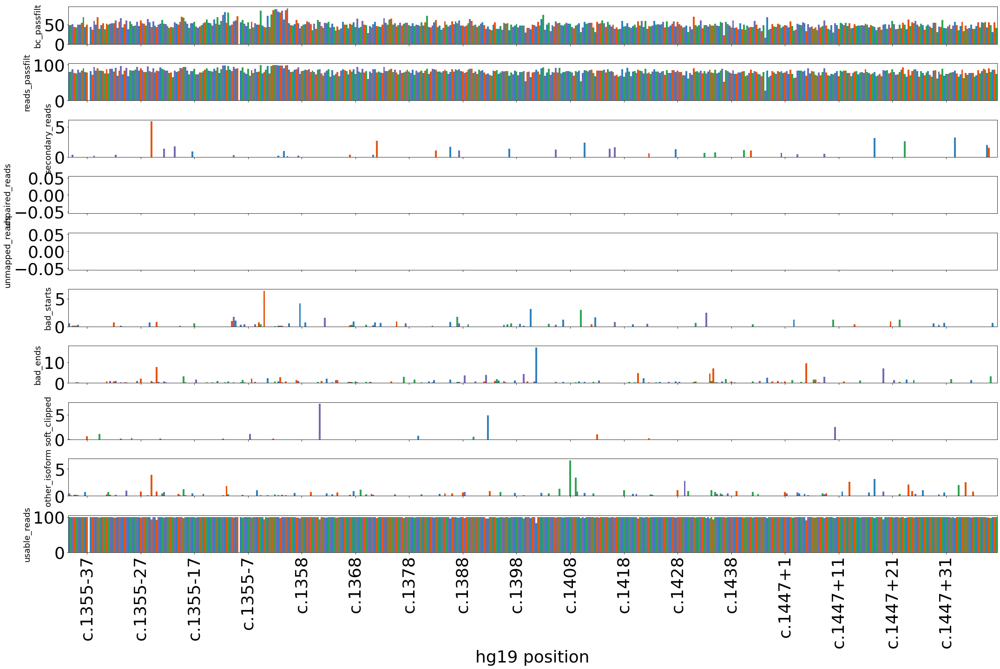

BB_RT_1_ODT_243_Cos1053


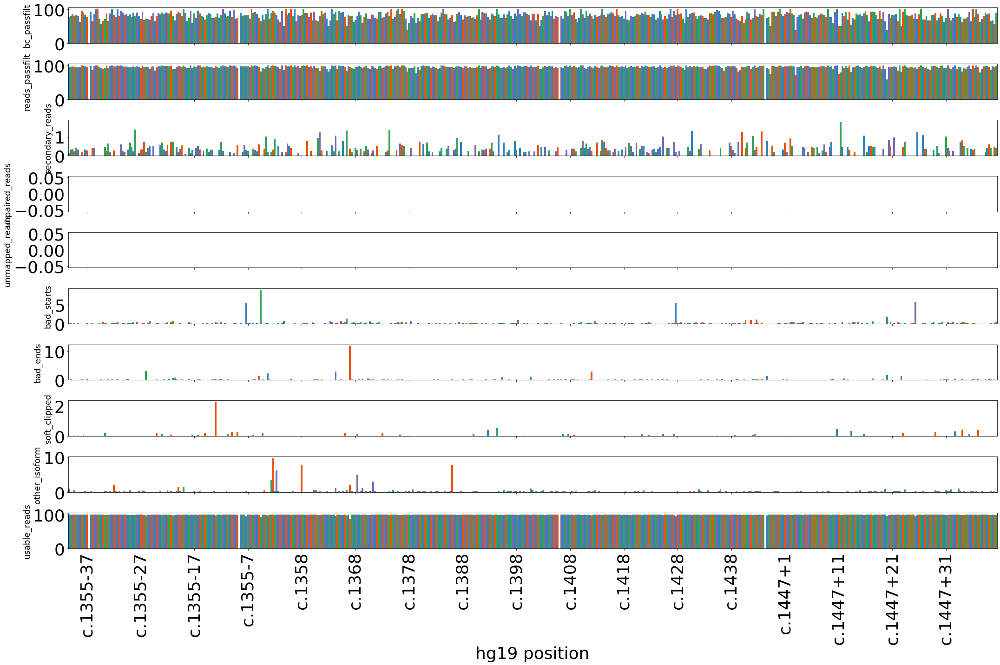

BB_RT_1_ODT_243_Hek1053


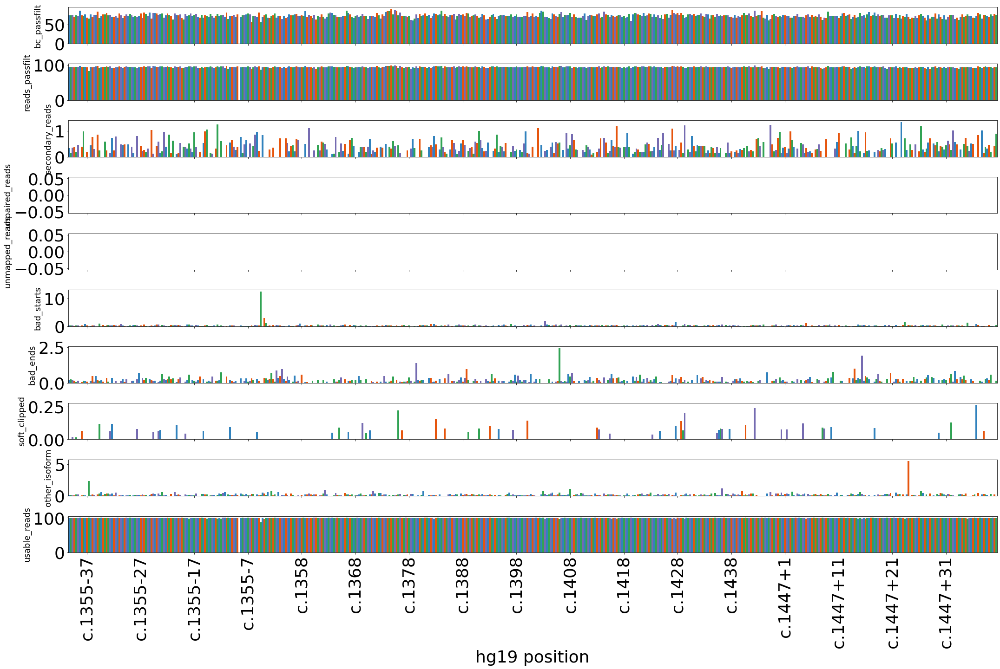

BB_RT_1_ODT_335_Cos1053


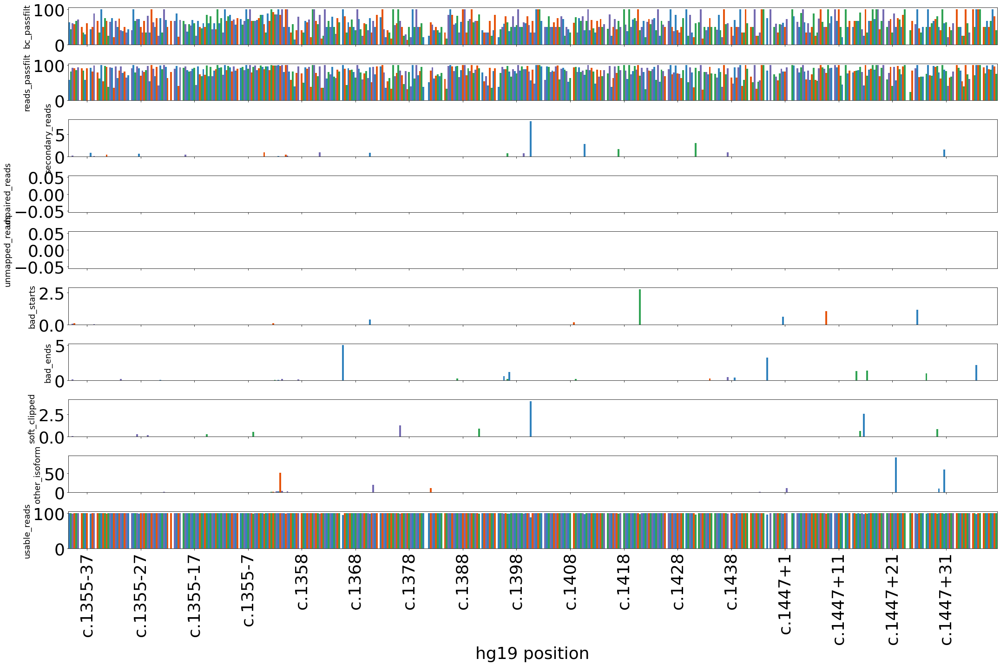

BB_RT_1_ODT_335_Hek1053


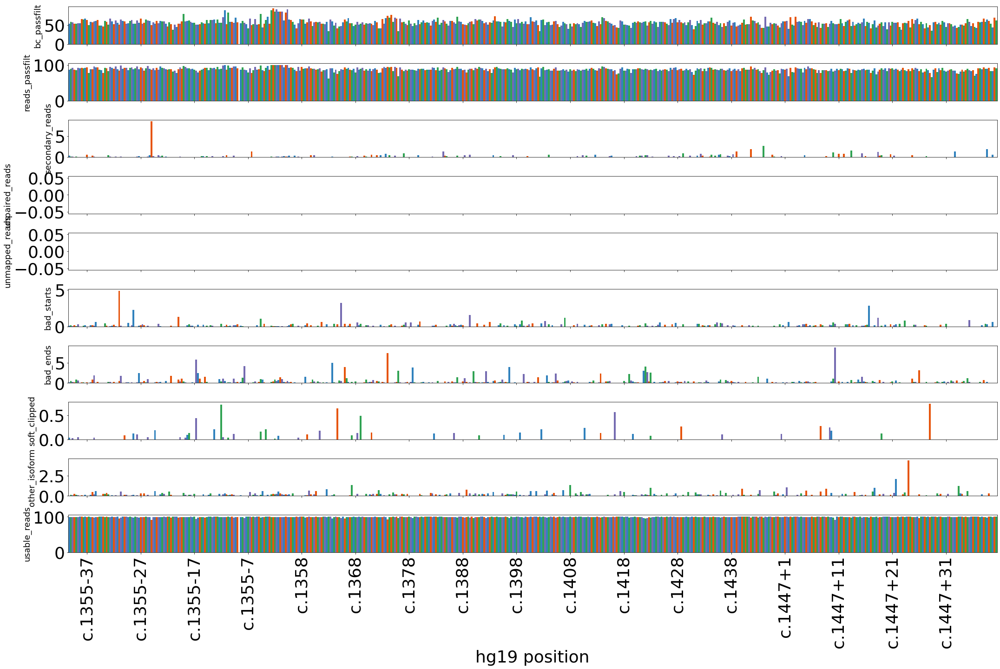

BB_RT_2_340_243_Cos1054


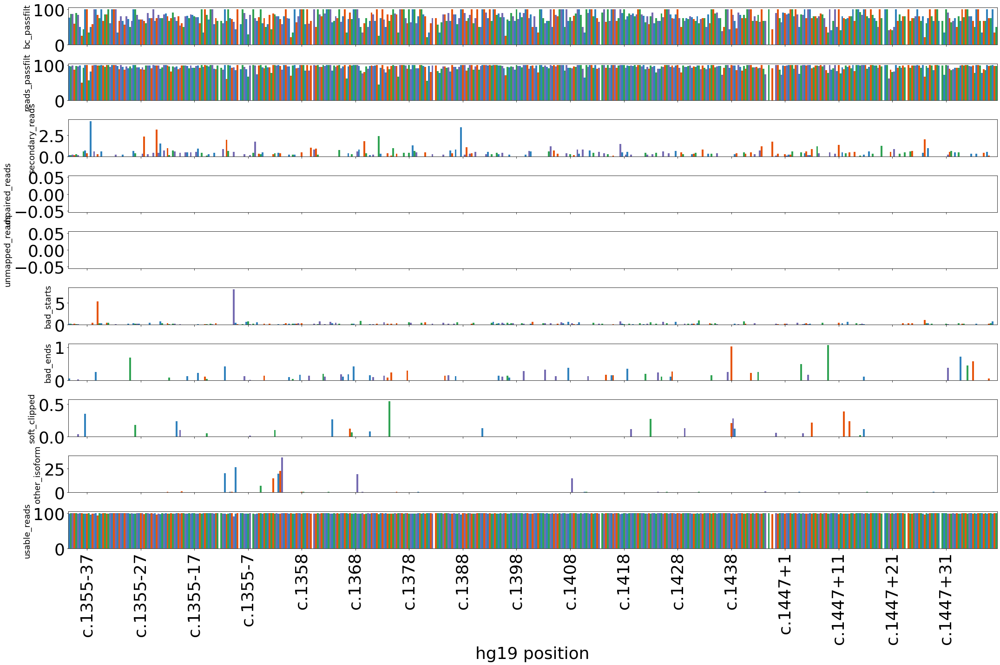

BB_RT_2_340_243_Hek1054


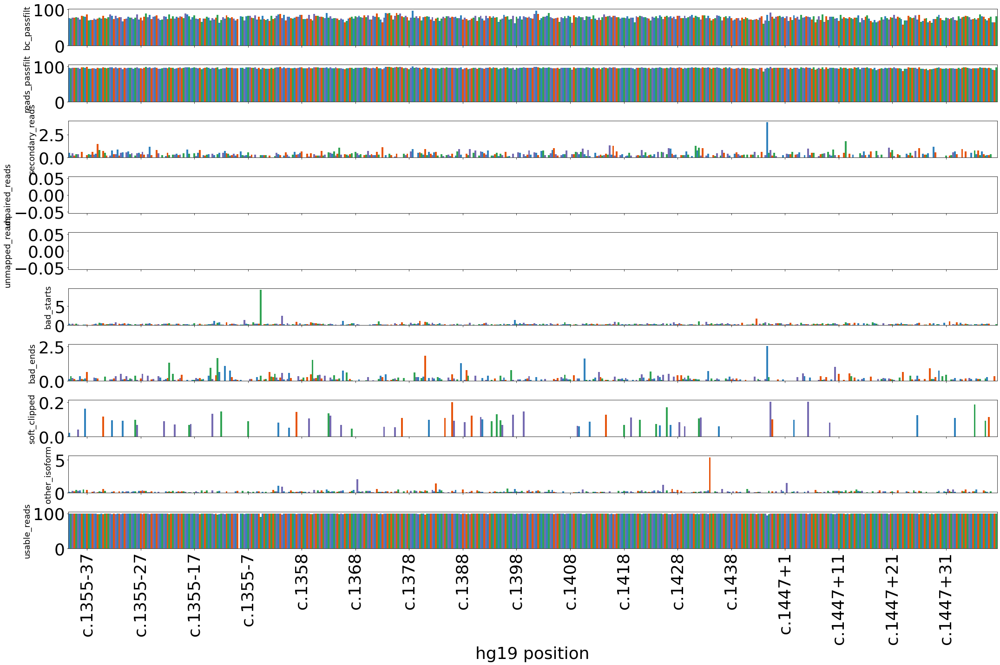

BB_RT_2_340_335_Cos1054


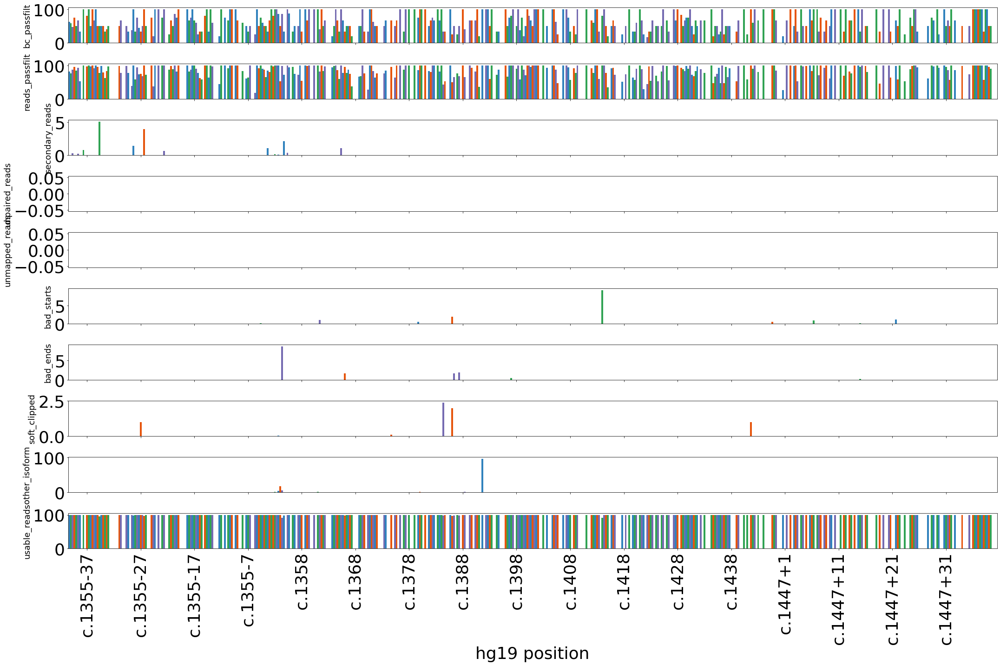

BB_RT_2_340_335_Hek1054


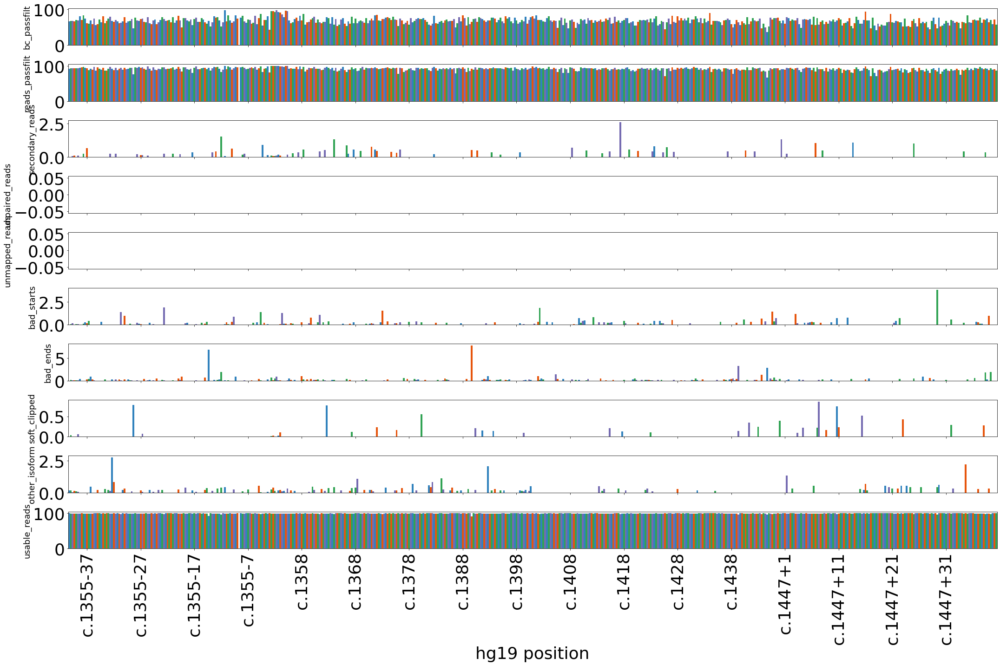

BB_RT_2_ODT_243_Cos1054


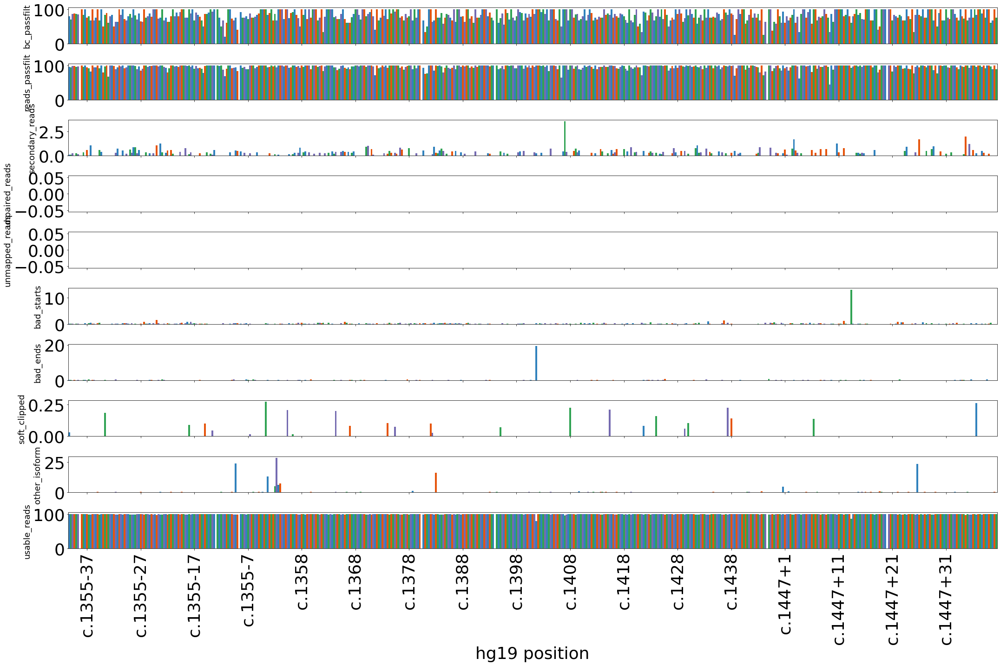

BB_RT_2_ODT_243_Hek1054


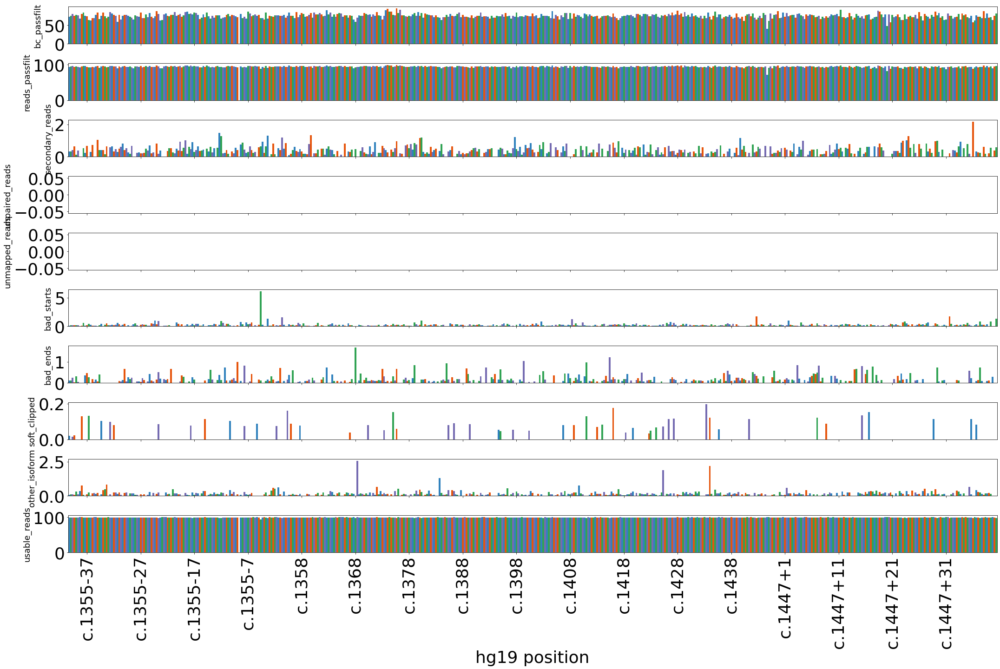

BB_RT_2_ODT_335_Cos1054


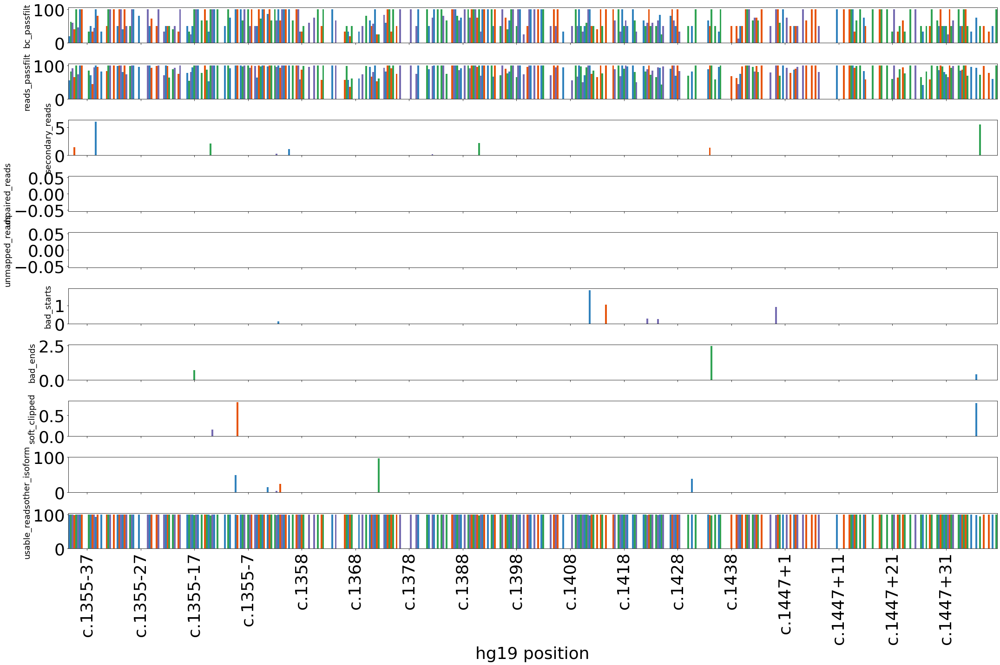

BB_RT_2_ODT_335_Hek1054


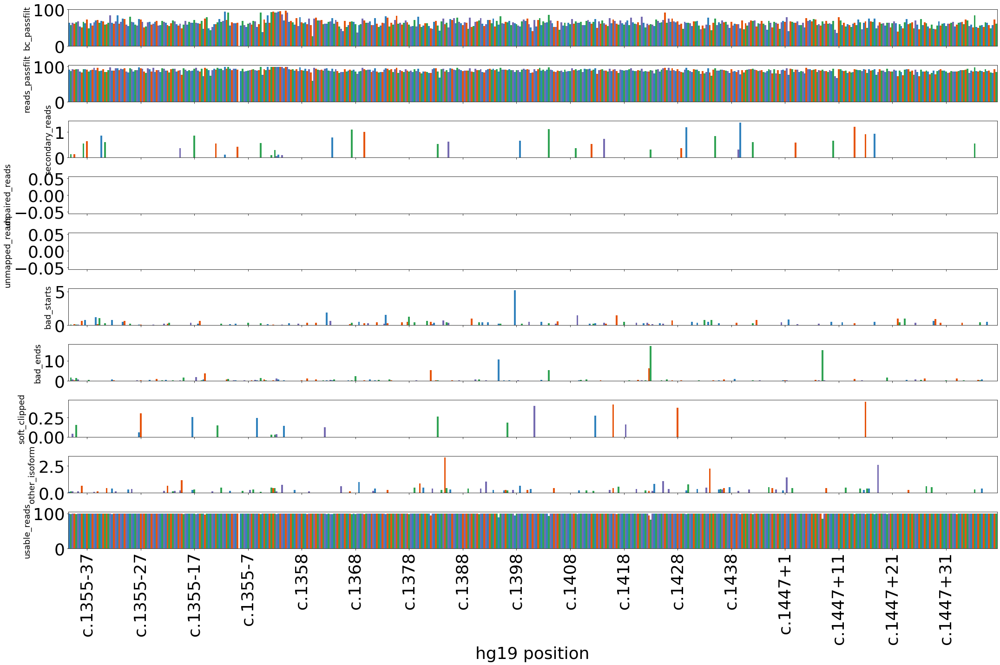

BB_RT_3_340_243_Cos1055


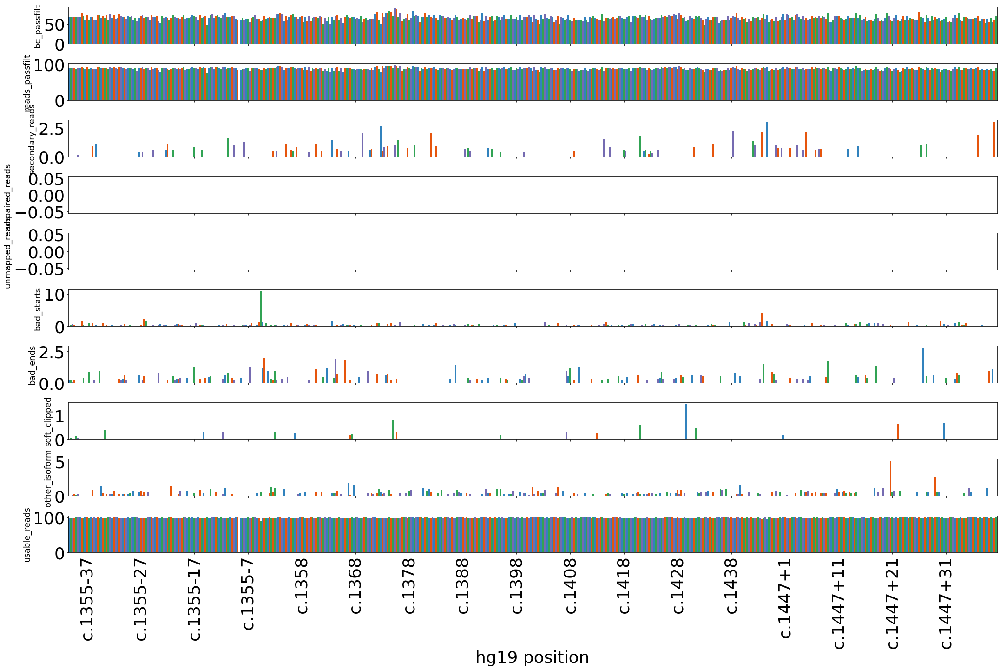

BB_RT_3_340_243_Hek1055


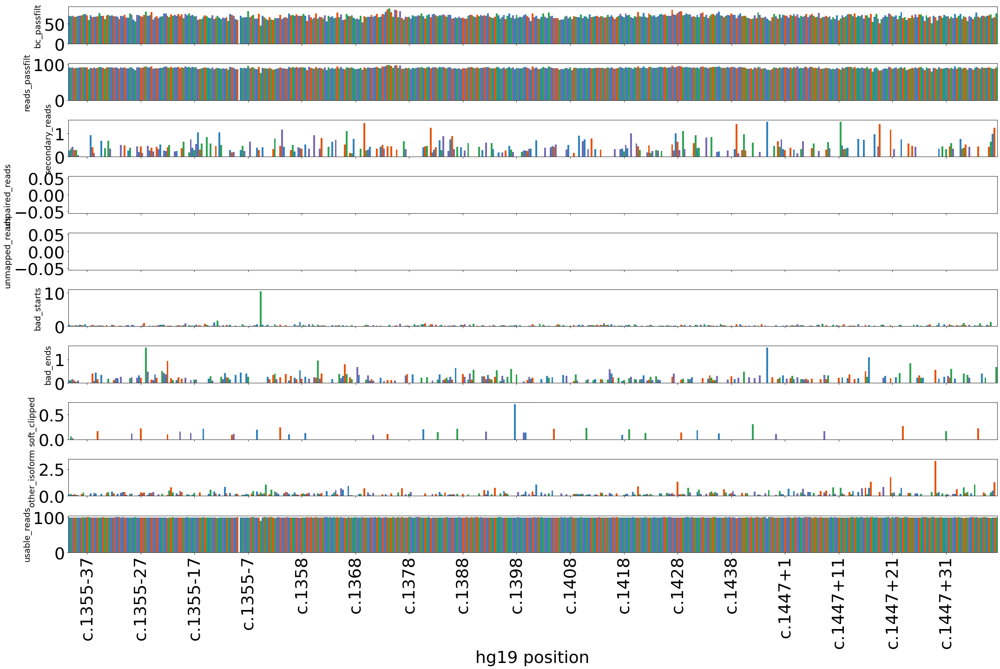

BB_RT_3_340_335_Cos1055


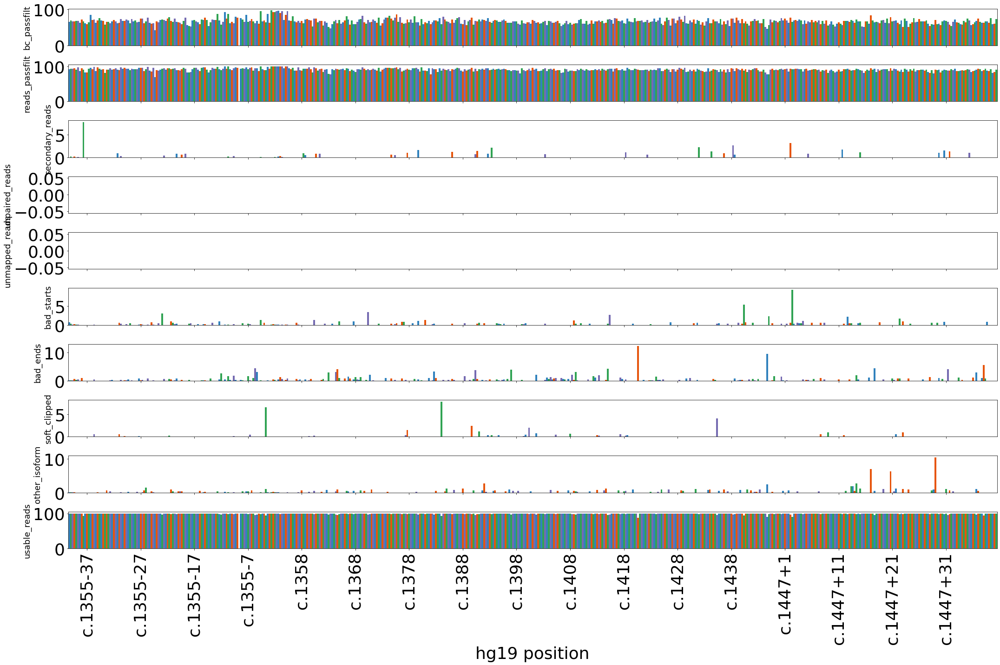

BB_RT_3_340_335_Hek1055


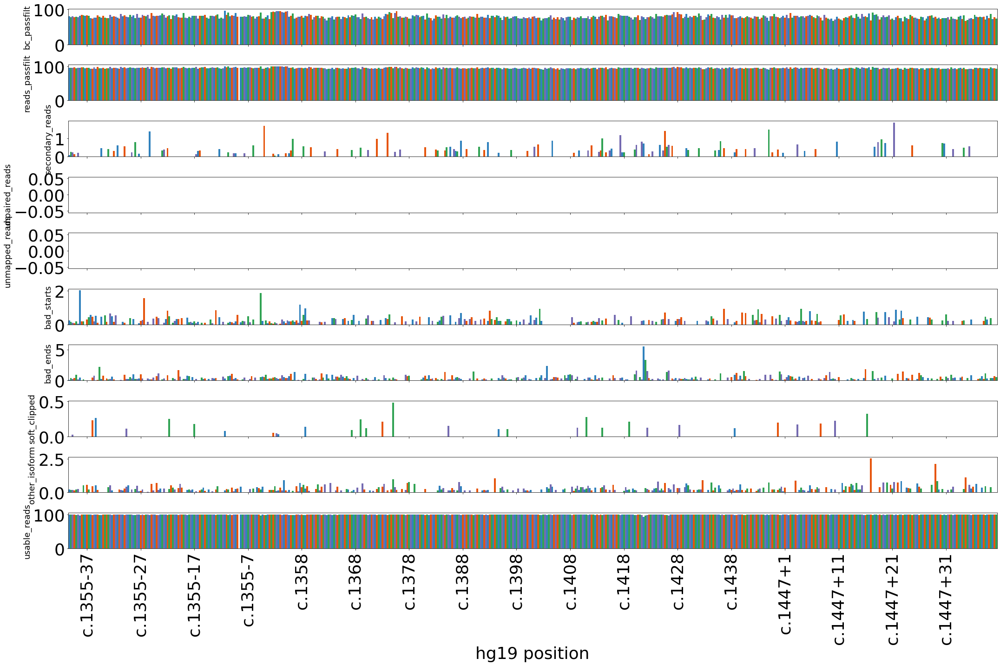

BB_RT_3_ODT_243_Cos1055


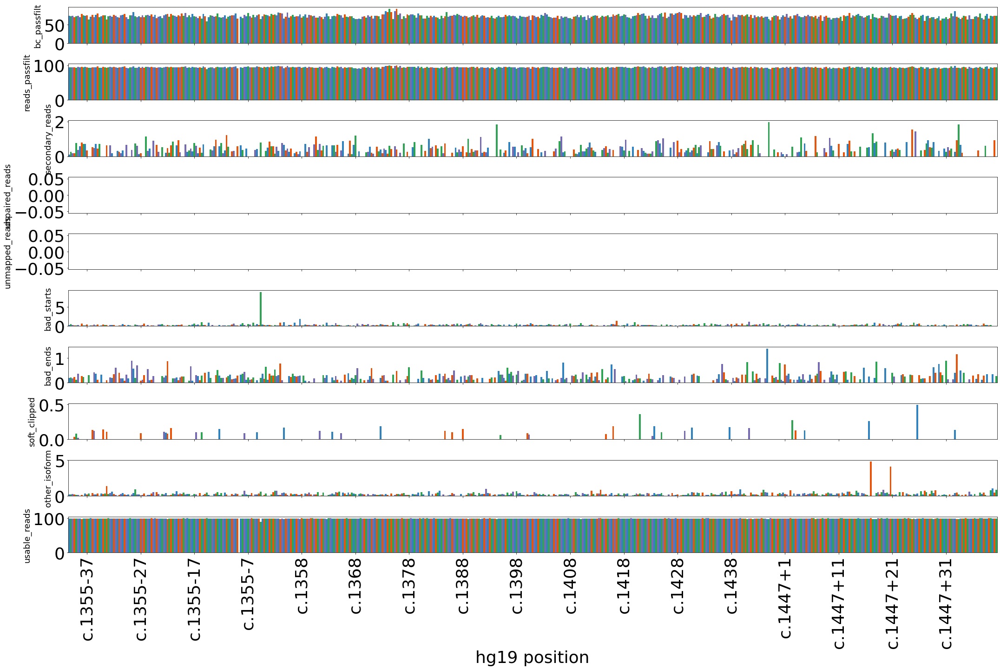

BB_RT_3_ODT_243_Hek1055


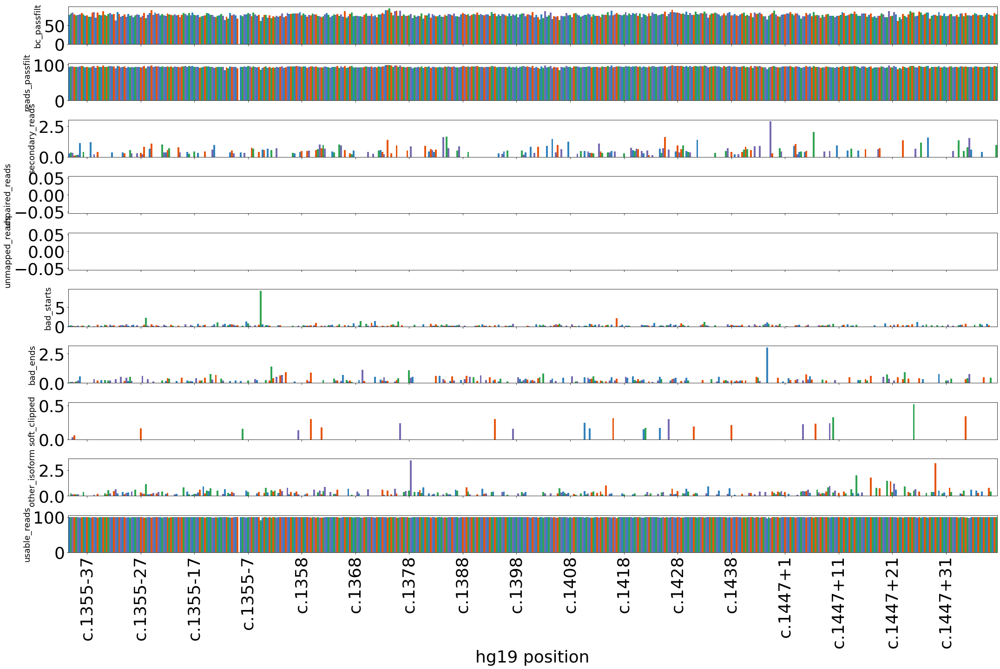

BB_RT_3_ODT_335_cos1055


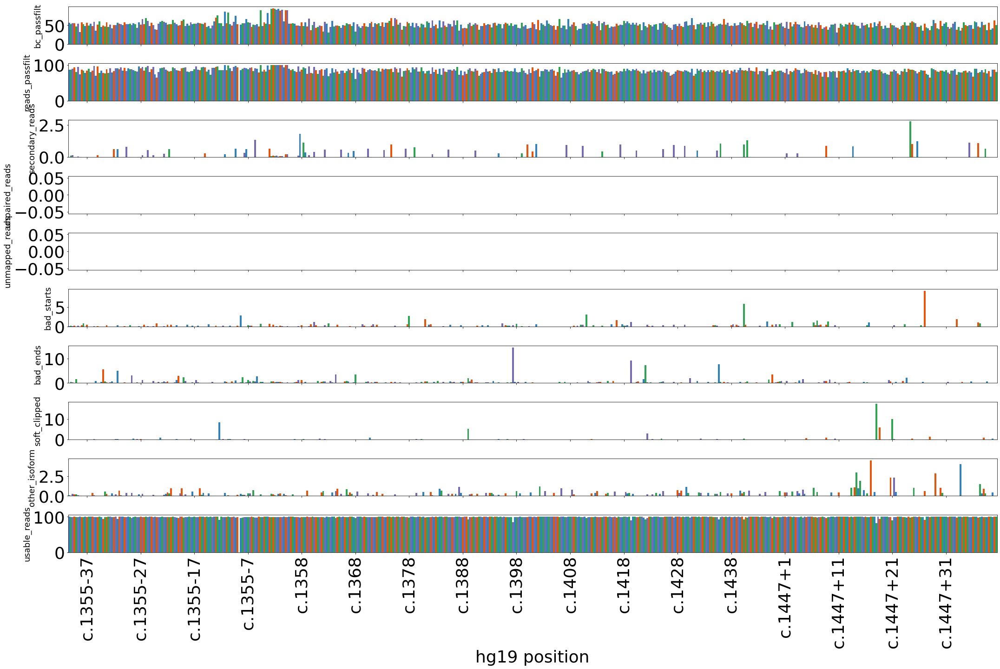

BB_RT_3_ODT_335_Hek1055


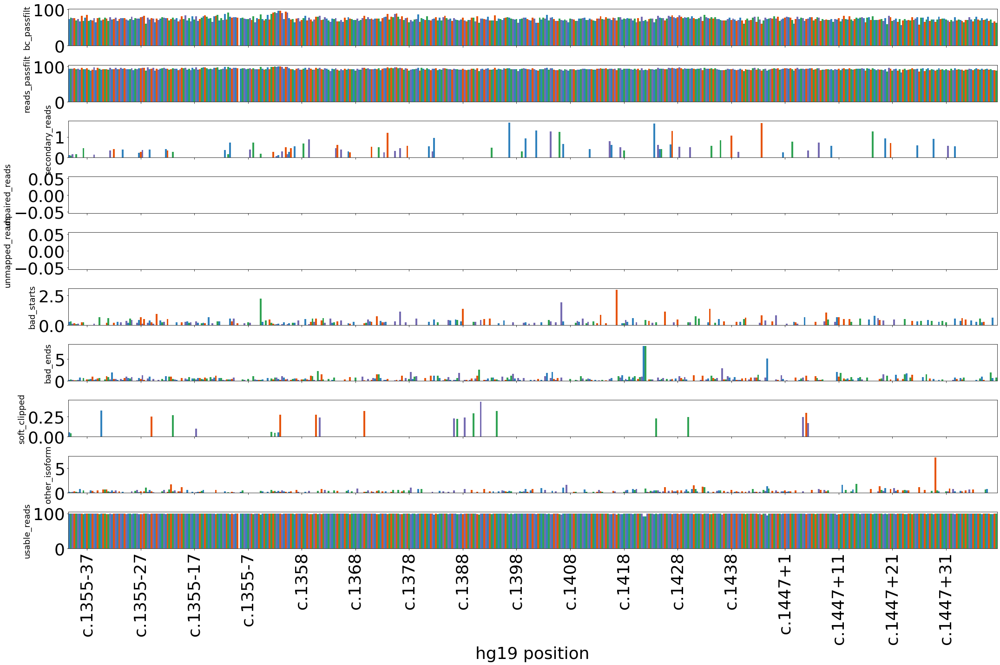

In [78]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.sat_subplots_wrapper( byvartbl_sat.loc[ byvartbl_sat[ 'sample' ] == samp ].rename( columns = { 'alt': 'a',
                                                                                                      'ref': 'r',
                                                                                                      'alt_c': 'alt',
                                                                                                       'ref_c': 'ref' } ),
                         [ col for col in byvartbl_sat if col.startswith( 'per_' ) ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          share_y = False,
                          legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          #y_ax_lim = [ ( 0, 3 ) ] + ylim,
                          y_ax_title = [ col[ 4: ] for col in byvartbl_sat if col.startswith( 'per_' ) ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [81]:
qc_counts_d = {}

for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
        
    qc_counts_d[ col ] = Counter( byvartbl_long.loc[ ( byvartbl_long[ col ] >= 5 ) ].pos.tolist() )

In [82]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( qc_counts_d[ col ].most_common( 10 ) )

per_secondary_reads
[(1242, 2), (1232, 2), (1282, 1), (1260, 1), (1313, 1), (1396, 1), (1229, 1)]
per_unpaired_reads
[]
per_unmapped_reads
[]
per_bad_starts
[(1262, 13), (1352, 2), (1259, 1), (1293, 1), (1323, 1), (1388, 1), (1288, 1), (1365, 1), (1255, 1), (1324, 1)]
per_bad_ends
[(1334, 5), (1357, 3), (1314, 2), (1335, 2), (1270, 1), (1352, 1), (1252, 1), (1248, 1), (1265, 1), (1388, 1)]
per_soft_clipped
[(1330, 1), (1273, 1), (1263, 1), (1296, 1), (1255, 1), (1301, 1), (1377, 1), (1378, 1), (1380, 1)]
per_other_isoform
[(1265, 11), (1266, 10), (1264, 4), (1383, 3), (1258, 3), (1246, 2), (1343, 2), (1381, 2), (1390, 2), (1320, 2)]


In [83]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( byvartbl_long.groupby( 'sample' )[ col ].max() )

per_secondary_reads
sample
BB_RT_1_340_243_Cos1053           4.878049
BB_RT_1_340_243_Hek1053           1.642710
BB_RT_1_340_335_Cos1053           5.882353
BB_RT_1_340_335_Hek1053           2.949853
BB_RT_1_ODT_243_Cos1053           1.843318
BB_RT_1_ODT_243_Hek1053           1.342282
BB_RT_1_ODT_335_Cos1053           8.000000
BB_RT_1_ODT_335_Hek1053           8.553971
BB_RT_1b_340_243_Hek1053          3.384615
BB_RT_1b_340_335_Hek1053          3.305785
BB_RT_1b_ODT_243_Hek1053          1.801802
BB_RT_1b_ODT_335_Hek1053          5.882353
BB_RT_2_340_243_Cos1054           4.166667
BB_RT_2_340_243_Hek1054           3.821656
BB_RT_2_340_335_Cos1054           5.128205
BB_RT_2_340_335_Hek1054           2.605863
BB_RT_2_ODT_243_Cos1054           3.508772
BB_RT_2_ODT_243_Hek1054           2.192982
BB_RT_2_ODT_335_Cos1054           6.060606
BB_RT_2_ODT_335_Hek1054           1.369863
BB_RT_3_340_243_Cos1055           3.030303
BB_RT_3_340_243_Hek1055           1.520913
BB_RT_3_340_335_Cos1055    

Secondary Reads QC

In [84]:
byvartbl_long.loc[ byvartbl_long.pos == 1242 ].groupby( 'sample' ).per_secondary_reads.max()

sample
BB_RT_1_340_243_Cos1053           0.301205
BB_RT_1_340_243_Hek1053           0.473093
BB_RT_1_340_335_Cos1053           0.000000
BB_RT_1_340_335_Hek1053           2.949853
BB_RT_1_ODT_243_Cos1053           0.519481
BB_RT_1_ODT_243_Hek1053           1.029160
BB_RT_1_ODT_335_Cos1053           0.000000
BB_RT_1_ODT_335_Hek1053           8.553971
BB_RT_1b_340_243_Hek1053          0.408998
BB_RT_1b_340_335_Hek1053          1.234568
BB_RT_1b_ODT_243_Hek1053          0.439560
BB_RT_1b_ODT_335_Hek1053          5.882353
BB_RT_2_340_243_Cos1054           0.418410
BB_RT_2_340_243_Hek1054           1.167640
BB_RT_2_340_335_Cos1054           0.000000
BB_RT_2_340_335_Hek1054           0.000000
BB_RT_2_ODT_243_Cos1054           0.255428
BB_RT_2_ODT_243_Hek1054           0.697837
BB_RT_2_ODT_335_Cos1054           0.000000
BB_RT_2_ODT_335_Hek1054           0.000000
BB_RT_3_340_243_Cos1055           0.586510
BB_RT_3_340_243_Hek1055           0.393185
BB_RT_3_340_335_Cos1055           0.000000
BB_R

In [130]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1242 ) & ( byvartbl_long.per_secondary_reads >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_secondary_reads', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_secondary_reads,sum_reads_passfilt,n_bc
6278,1242,C,G,jkp815:1242:G:C,BB_RT_1b_ODT_335_Hek1053,5.882353,102,37
8537,1242,C,G,jkp815:1242:G:C,BB_RT_1_ODT_335_Hek1053,8.553971,491,53


In [92]:
bcs_1242CG = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_RT_1_ODT_335_Hek1053' ) & ( bybc_tbl_fn[ 'JKP1053'].variant_list == 'jkp815:1242:G:C' )  ].copy()

In [95]:
bcs_1242CG.loc[ bcs_1242CG.secondary_reads > 0 ][ [ 'barcode', 'secondary_reads' ] ]

,barcode,secondary_reads
1449952,GCGGACGGGGGGAAGTTTGGTGG,42


In [96]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_RT_1_ODT_335_Hek1053/BB_RT_1_ODT_335_Hek1053Aligned.out.wbcs.bam | grep 'BC:Z:GCGGACGGGGGGAAGTTTGGTGG'

A01443:202:HVGH2DSX3:1:1118:3134:26271_1:N:0:CACTGCTTTC+AAGGCATAAA_BC=GCGGACGGGGGGAAGTTTGGTGG_UMI=ATGTATCC	99	jkp1053_1054_1055	650	255	47M2782N36M	=	664	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:83	jM:B:c,1	jI:B:i,697,3478	MC:Z:33M2782N55M	BC:Z:GCGGACGGGGGGAAGTTTGGTGG	BX:Z:ATGTATCC
A01443:202:HVGH2DSX3:1:1118:3134:26271_1:N:0:CACTGCTTTC+AAGGCATAAA_BC=GCGGACGGGGGGAAGTTTGGTGG_UMI=ATGTATCC	147	jkp1053_1054_1055	664	255	33M2782N55M	=	650	-2884	TGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,697,3478	MC:Z:47M2782N36M	BC:Z:GCGGACGGGGGGAAGTTTGGTGG	BX:Z:ATGTATCC
A01443:202:HVGH2DSX3:1:1118:9778:5149_1:N:0:CACTGCTTTC+AAGGCATAAA_BC=GCGGA

In [98]:
seq1242 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAG'

In [100]:
seq1242.find( refseq[ 649:696 ].upper() )

0

In [104]:
seq1242[ 47 : ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAG'

In [107]:
seq1242[ 47 : ].find( refseq[ 1267: 1307 ].upper() )

-1

In [102]:
seq1242[ : 47 ]

'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCA'

In [108]:
byvartbl_long.loc[ byvartbl_long.pos == 1232 ].groupby( 'sample' ).per_secondary_reads.max()

sample
BB_RT_1_340_243_Cos1053           0.000000
BB_RT_1_340_243_Hek1053           0.462428
BB_RT_1_340_335_Cos1053           0.000000
BB_RT_1_340_335_Hek1053           0.000000
BB_RT_1_ODT_243_Cos1053           0.000000
BB_RT_1_ODT_243_Hek1053           0.852878
BB_RT_1_ODT_335_Cos1053           0.000000
BB_RT_1_ODT_335_Hek1053           0.000000
BB_RT_1b_340_243_Hek1053          0.000000
BB_RT_1b_340_335_Hek1053          0.000000
BB_RT_1b_ODT_243_Hek1053          0.573066
BB_RT_1b_ODT_335_Hek1053          0.000000
BB_RT_2_340_243_Cos1054           0.242866
BB_RT_2_340_243_Hek1054           1.479047
BB_RT_2_340_335_Cos1054           5.128205
BB_RT_2_340_335_Hek1054           0.000000
BB_RT_2_ODT_243_Cos1054           0.571429
BB_RT_2_ODT_243_Hek1054           1.037344
BB_RT_2_ODT_335_Cos1054           6.060606
BB_RT_2_ODT_335_Hek1054           0.000000
BB_RT_3_340_243_Cos1055           1.058201
BB_RT_3_340_243_Hek1055           0.000000
BB_RT_3_340_335_Cos1055           0.000000
BB_R

In [129]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1232 ) & ( byvartbl_long.per_secondary_reads >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_secondary_reads', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_secondary_reads,sum_reads_passfilt,n_bc
10150,1232,A,C,jkp815:1232:T:G,BB_RT_2_340_335_Cos1054,5.128205,78,2
12273,1232,A,T,jkp815:1232:T:A,BB_RT_2_ODT_335_Cos1054,6.060606,33,1


In [110]:
byvartbl_long.loc[ ( byvartbl_long.per_secondary_reads >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_secondary_reads' ] ]

,pos,ref,alt,sample,per_secondary_reads


Bad start reads QC

In [158]:
print( qc_counts_d[ 'per_bad_starts' ].most_common( 10 ) )

[(1262, 13), (1352, 2), (1259, 1), (1293, 1), (1323, 1), (1388, 1), (1288, 1), (1365, 1), (1255, 1), (1324, 1)]


In [49]:
byvartbl_long.loc[ byvartbl_long.pos == 1262 ].groupby( 'sample' ).per_bad_starts.max()

sample
BB_RT_1_340_243_Cos1053            3.119682
BB_RT_1_340_243_Hek1053            6.588992
BB_RT_1_340_335_Cos1053            0.241481
BB_RT_1_340_335_Hek1053            0.603774
BB_RT_1_ODT_243_Cos1053            7.202547
BB_RT_1_ODT_243_Hek1053            9.023600
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            1.177285
BB_RT_1b_340_243_Hek1053           7.256894
BB_RT_1b_340_335_Hek1053           1.234845
BB_RT_1b_ODT_243_Hek1053          10.103330
BB_RT_1b_ODT_335_Hek1053           0.673117
BB_RT_2_340_243_Cos1054            0.168161
BB_RT_2_340_243_Hek1054            7.834603
BB_RT_2_340_335_Cos1054            0.075386
BB_RT_2_340_335_Hek1054            1.021737
BB_RT_2_ODT_243_Cos1054            3.871231
BB_RT_2_ODT_243_Hek1054            7.223169
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.785273
BB_RT_3_340_243_Cos1055            8.910891
BB_RT_3_340_243_Hek1055            7.754011
BB_RT_3_340_335_Cos1055  

In [137]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1262 ) & ( byvartbl_long.per_bad_starts >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_starts', 'sum_bad_starts', 'sum_reads_passfilt' ] ]

,pos,ref,alt,varlist,sample,per_bad_starts,sum_bad_starts,sum_reads_passfilt
1189,1262,A,C,jkp815:1262:T:G,BB_test_Cos1053_oligodT_MM1B,11.428571,48,420
1726,1262,A,C,jkp815:1262:T:G,BB_test_Cos1053_oligodT_MM2B,13.932584,248,1780
2869,1262,A,C,jkp815:1262:T:G,BB_RT_1_340_243_Hek1053,8.085809,49,606
4584,1262,A,C,jkp815:1262:T:G,BB_RT_1b_340_243_Hek1053,9.236948,46,498
5762,1262,A,C,jkp815:1262:T:G,BB_RT_1b_ODT_243_Hek1053,13.793103,64,464
6892,1262,A,C,jkp815:1262:T:G,BB_RT_1_ODT_243_Cos1053,8.760108,65,742
7484,1262,A,C,jkp815:1262:T:G,BB_RT_1_ODT_243_Hek1053,12.412587,71,572
9712,1262,A,C,jkp815:1262:T:G,BB_RT_2_340_243_Hek1054,9.245742,76,822
11840,1262,A,C,jkp815:1262:T:G,BB_RT_2_ODT_243_Hek1054,6.135630,57,929
13415,1262,A,C,jkp815:1262:T:G,BB_RT_3_340_243_Cos1055,10.855263,33,304


In [138]:
bcs_1262AC = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_test_Cos1053_oligodT_MM2B' ) & ( bybc_tbl_fn[ 'JKP1053'].variant_list == 'jkp815:1262:T:G' )  ].copy()

In [139]:
bcs_1262AC.loc[ bcs_1262AC.bad_starts > 0 ][ [ 'barcode', 'bad_starts' ] ]

,barcode,bad_starts
61230,GTTTGGTCAGAGAGGCATGATGG,1
77007,TTAGGTATTATATACTCAATTGG,247


In [140]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_test_Cos1053_oligodT_MM2B/BB_test_Cos1053_oligodT_MM2BAligned.out.wbcs.bam | grep 'BC:Z:TTAGGTATTATATACTCAATTGG'

A01443:202:HVGH2DSX3:1:1102:2166:23657_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=TTAGGTATTATATACTCAATTGG	99	jkp1053_1054_1055	650	255	10M1D40M566N93M2119N7M	=	1327	2884	AGTGAACTGCCTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTAGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF,FFFF:FFFFFFF	NH:i:1	HI:i:1	AS:i:227	nM:i:2	NM:i:3	MD:Z:10^A36G2A100	jM:B:c,1,1	jI:B:i,701,1266,1360,3478	MC:Z:33M2119N55M	BC:Z:TTAGGTATTATATACTCAATTGG
A01443:202:HVGH2DSX3:1:1102:2166:23657_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=TTAGGTATTATATACTCAATTGG	147	jkp1053_1054_1055	1327	255	33M2119N55M	=	650	-2884	AGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFF,:FFFFFF:F:FFF:F:FFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:227	nM:i:2	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,1360,3478	MC:Z

A01443:202:HVGH2DSX3:1:1654:29957:34178_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=TTAGGTATTATATACTCAATTGG	147	jkp1053_1054_1055	1327	255	33M2119N55M	=	650	-2884	AGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACATTGAGTAGGTGGTGGCTGGTGAAGTC	FF:::F:FFFFF:FFFFF,FFFFFFFFF:FFFF,:FFFFFFF:FF::FF,FFF,FFFFFFF,,F,FF,F,:FF,FFF,FFFFFFFF:F	NH:i:1	HI:i:1	AS:i:225	nM:i:5	NM:i:3	MD:Z:62G1C2A20	jM:B:c,1	jI:B:i,1360,3478	MC:Z:51M566N93M2119N6M	BC:Z:TTAGGTATTATATACTCAATTGG
A01443:202:HVGH2DSX3:1:1656:27091:29246_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=TTAGGTATTATATACTCAATTGG	99	jkp1053_1054_1055	650	255	47M570N93M2119N10M	=	1327	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGAT	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:233	nM:i:1	NM:i:0	MD:Z:150	jM:B:c,1,1	jI:B:i,697,1266,1360,3478	MC

In [145]:
seq1262 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTAGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAAACCTGG'

In [148]:
#maps to US constant
seq1262.find( refseq[ 649:696 ].upper() )

0

In [149]:
#does not map longer than US constant (like the cigar - 51M566N93M2119N6M - suggests )
seq1262.find( refseq[ 649:697 ].upper() )

-1

In [156]:
#4 bp insertion
seq1262[ 47: ].find( refseq[ 1266:1359 ].upper() )

4

In [157]:
#variant creates AG - bad alignment
refseq[ 1260: 1265 ]

'ATTTA'

In [111]:
byvartbl_long.loc[ byvartbl_long.pos == 1352 ].groupby( 'sample' ).per_bad_starts.max()

sample
BB_RT_1_340_243_Cos1053           0.000000
BB_RT_1_340_243_Hek1053           0.866551
BB_RT_1_340_335_Cos1053           0.000000
BB_RT_1_340_335_Hek1053           0.283286
BB_RT_1_ODT_243_Cos1053           0.318471
BB_RT_1_ODT_243_Hek1053           0.168067
BB_RT_1_ODT_335_Cos1053           0.000000
BB_RT_1_ODT_335_Hek1053           0.174825
BB_RT_1b_340_243_Hek1053          0.203046
BB_RT_1b_340_335_Hek1053          0.000000
BB_RT_1b_ODT_243_Hek1053          0.175747
BB_RT_1b_ODT_335_Hek1053          0.000000
BB_RT_2_340_243_Cos1054           0.724638
BB_RT_2_340_243_Hek1054           0.574053
BB_RT_2_340_335_Cos1054           0.000000
BB_RT_2_340_335_Hek1054           0.598802
BB_RT_2_ODT_243_Cos1054           0.000000
BB_RT_2_ODT_243_Hek1054           0.000000
BB_RT_2_ODT_335_Cos1054           0.000000
BB_RT_2_ODT_335_Hek1054           0.000000
BB_RT_3_340_243_Cos1055           1.282051
BB_RT_3_340_243_Hek1055           0.625978
BB_RT_3_340_335_Cos1055           5.426357
BB_R

In [128]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1352 ) & ( byvartbl_long.per_bad_starts >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_starts', 'sum_bad_starts', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_starts,sum_bad_starts,sum_reads_passfilt,n_bc
14850,1352,A,C,jkp815:1352:T:G,BB_RT_3_340_335_Cos1055,5.426357,7,129,50
17188,1352,A,C,jkp815:1352:T:G,BB_RT_3_ODT_335_cos1055,5.797101,12,207,52


In [114]:
bcs_1352AC = bybc_tbl_fn[ 'JKP1055' ].loc[ ( bybc_tbl_fn[ 'JKP1055' ][ 'sample' ] == 'BB_RT_3_ODT_335_cos1055' ) & ( bybc_tbl_fn[ 'JKP1055'].variant_list == 'jkp815:1352:T:G' )  ].copy()

In [115]:
bcs_1352AC.loc[ bcs_1352AC.bad_starts > 0 ][ [ 'barcode', 'bad_starts' ] ]

,barcode,bad_starts
1224938,AATTGATACGATGAGGGAGTTGG,3
1332408,GTTCTCGAATCTCAGCTAGGTGG,9


In [131]:
byvartbl_long.loc[ ( byvartbl_long.per_bad_starts >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_starts' ] ]

,pos,ref,alt,sample,per_bad_starts


Bad ends QC

In [336]:
print( qc_counts_d[ 'per_bad_ends' ].most_common( 10 ) )

[(1334, 5), (1357, 3), (1314, 2), (1335, 2), (1270, 1), (1352, 1), (1252, 1), (1248, 1), (1265, 1), (1388, 1)]


In [160]:
byvartbl_long.loc[ byvartbl_long.pos == 1334 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.110132
BB_RT_1_340_243_Hek1053            0.300300
BB_RT_1_340_335_Cos1053            0.000000
BB_RT_1_340_335_Hek1053            2.402957
BB_RT_1_ODT_243_Cos1053            0.254453
BB_RT_1_ODT_243_Hek1053            0.343643
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            4.040404
BB_RT_1b_340_243_Hek1053           0.945626
BB_RT_1b_340_335_Hek1053           0.719424
BB_RT_1b_ODT_243_Hek1053           0.281294
BB_RT_1b_ODT_335_Hek1053           2.230483
BB_RT_2_340_243_Cos1054            0.200401
BB_RT_2_340_243_Hek1054            0.244648
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            0.216450
BB_RT_2_ODT_243_Cos1054            0.165426
BB_RT_2_ODT_243_Hek1054            0.101061
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.228833
BB_RT_3_340_243_Cos1055            0.264550
BB_RT_3_340_243_Hek1055            0.316456
BB_RT_3_340_335_Cos1055  

In [161]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1334 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
1401,1334,G,T,jkp815:1334:C:A,BB_test_Cos1053_oligodT_MM1B,11.747344,199,1694,15
15381,1334,G,T,jkp815:1334:C:A,BB_RT_3_340_335_Hek1055,5.495818,46,837,175
17133,1334,G,C,jkp815:1334:C:G,BB_RT_3_ODT_335_cos1055,7.387863,28,379,95
17717,1334,G,T,jkp815:1334:C:A,BB_RT_3_ODT_335_Hek1055,7.971014,44,552,164
17718,1334,G,C,jkp815:1334:C:G,BB_RT_3_ODT_335_Hek1055,7.966457,38,477,148


In [174]:
bcs_1334GT = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_test_Cos1053_oligodT_MM1B' ) & ( bybc_tbl_fn[ 'JKP1053'].variant_list == 'jkp815:1334:C:A' )  ].copy()

In [175]:
bcs_1334GT.loc[ bcs_1334GT.bad_ends > 0 ][ [ 'barcode', 'bad_ends' ] ]

,barcode,bad_ends
44230,GGGTATTGGAACTATCCACTTGG,195
45020,ATTGCGGCTTTATTGTGCGATGG,1
52233,TGCTTCCTGGAGTGTCTGAGTGG,1
52282,TCGAAAGATGCCTTCCGATTTGG,1
58346,GAAATTGTTATATTAGCGTATGG,1


In [176]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_test_Cos1053_oligodT_MM1B/BB_test_Cos1053_oligodT_MM1BAligned.out.wbcs.bam | grep 'BC:Z:GGGTATTGGAACTATCCACTTGG'

A01443:202:HVGH2DSX3:1:1103:14073:30405_1:N:0:CGGTCCGTTG+ATAACGGAAA_BC=GGGTATTGGAACTATCCACTTGG_UMI=TCCATTTT	99	jkp1053_1054_1055	650	255	47M570N93M2S	=	1327	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCAAACCAGGACTCATACAGGTAAAACAAAC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:221	nM:i:2	NM:i:1	MD:Z:114C25	jM:B:c,1	jI:B:i,697,1266	MC:Z:33M2119N55M	BC:Z:GGGTATTGGAACTATCCACTTGG	BX:Z:TCCATTTT
A01443:202:HVGH2DSX3:1:1103:14073:30405_1:N:0:CGGTCCGTTG+ATAACGGAAA_BC=GGGTATTGGAACTATCCACTTGG_UMI=TCCATTTT	147	jkp1053_1054_1055	1327	255	33M2119N55M	=	650	-2884	AGACCCAAACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF,FFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:221	nM:i:2	NM:i:1	MD:Z:7C80	jM:B:c,1	jI:B:i,1360,3478	MC:Z

A01443:202:HVGH2DSX3:1:2359:26042:33411_1:N:0:CGGTCCGTTG+ATAACGGAAA_BC=GGGTATTGGAACTATCCACTTGG_UMI=AATATGCC	147	jkp1053_1054_1055	670	255	27M570N45M2206N16M	=	650	-2884	GCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFF,FFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:172	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1,0	jI:B:i,697,1266,1312,3517	MC:Z:47M570N48M47S	BC:Z:GGGTATTGGAACTATCCACTTGG	BX:Z:AATATGCC
A01443:202:HVGH2DSX3:1:2362:25120:32221_1:N:0:CGGTCCGTTG+ATAACGGAAA_BC=GGGTATTGGAACTATCCACTTGG_UMI=CCTCAGTA	99	jkp1053_1054_1055	650	255	47M570N93M2S	=	1327	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCAAACCAGGACTCATACAGGTAAAACAAAC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFF:FFFFF	NH:i:1	HI:i:1	AS:i:221	nM:i:2	NM:i:1	MD:Z:114C25	jM:B:c,1	jI:

In [191]:
seq1334r = 'GCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTC'

In [231]:
#should start at 3478
#cigar maps this to -16 but thats too long
refseq.upper().find( seq1334r[ -15: ] )

3518

In [207]:
seq1334r[ -15: ]

'GTGGCTGGTGAAGTC'

In [228]:
#hmmmm this is near an AG but not exactly on it - if we map to 3518 then there is a cryptic acceptor
refseq[ 3512:3525 ].upper()

'AAGGTGGTGGCTG'

In [208]:
refseq.upper().find( seq1334r[ -56:-15 ] )

1271

In [209]:
#there is a cryptic donor at 1312 
refseq.upper()[ 1308: 1318 ]

'CCCGGTCCGA'

In [210]:
#read stops right at cryptic donor
#so reverse read is ending at 1312 and then splicing into 3518
seq1334r[ -56:-15 ]

'AAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCG'

In [177]:
seq1334 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTCAACAAACTCGGATCTGGGTATTGGAACTATCCAC'

In [211]:
#proper US constant mapping
refseq.upper().find( seq1334[ : 47 ] )

649

In [223]:
#then we splice into the exon and could end at 1314
#to match reverse lets alter to 1312
refseq.upper().find( seq1334[ 47 : 93 ] )

1266

In [238]:
#same cryptic acceptor as on rev strand
refseq.upper().find( seq1334[ 93 : 123 ] )

3518

In [240]:
#rest of sequence doesn't match
refseq.upper().find( seq1334[ 123 : ] )

-1

In [241]:
#but its the barcode!
'GGGTATTGGAACTATCCACTTGG'.find( seq1334[ 123 : ] )

0

In [242]:
byvartbl_long.loc[ byvartbl_long.pos == 1357 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053           1.260504
BB_RT_1_340_243_Hek1053           0.483092
BB_RT_1_340_335_Cos1053           0.000000
BB_RT_1_340_335_Hek1053           1.515152
BB_RT_1_ODT_243_Cos1053           1.532567
BB_RT_1_ODT_243_Hek1053           0.746269
BB_RT_1_ODT_335_Cos1053           3.225806
BB_RT_1_ODT_335_Hek1053           1.098901
BB_RT_1b_340_243_Hek1053          5.243446
BB_RT_1b_340_335_Hek1053          1.538462
BB_RT_1b_ODT_243_Hek1053          1.886792
BB_RT_1b_ODT_335_Hek1053          2.564103
BB_RT_2_340_243_Cos1054           0.000000
BB_RT_2_340_243_Hek1054           2.547771
BB_RT_2_340_335_Cos1054                NaN
BB_RT_2_340_335_Hek1054           2.857143
BB_RT_2_ODT_243_Cos1054           0.664452
BB_RT_2_ODT_243_Hek1054           0.000000
BB_RT_2_ODT_335_Cos1054           0.000000
BB_RT_2_ODT_335_Hek1054           0.000000
BB_RT_3_340_243_Cos1055           0.000000
BB_RT_3_340_243_Hek1055           1.503759
BB_RT_3_340_335_Cos1055           9.523810
BB_R

In [243]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1357 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
4867,1357,G,T,jkp815:1357:C:A,BB_RT_1b_340_243_Hek1053,5.243446,14,267,28
14863,1357,G,T,jkp815:1357:C:A,BB_RT_3_340_335_Cos1055,9.523810,4,42,22
17786,1357,G,T,jkp815:1357:C:A,BB_RT_3_ODT_335_Hek1055,5.128205,4,78,33


In [244]:
bcs_1357GT = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_RT_1b_340_243_Hek1053' ) & ( bybc_tbl_fn[ 'JKP1053'].variant_list == 'jkp815:1357:C:A' )  ].copy()

In [245]:
bcs_1357GT.loc[ bcs_1357GT.bad_ends > 0 ][ [ 'barcode', 'bad_ends' ] ]

,barcode,bad_ends
513424,GGCTAGCCGTCTCCTTCATTTGG,1
546289,TAAGCTCCGTTTAGTGCTTGTGG,1
558083,TCATAAGTGCAGTTGTTAGTTGG,1
600650,CAACATTCGGAACCTGTCGGTGG,2
613413,CTTTCAGCTTATCCAGGAATTGG,3
622779,GATGAGAAGGACGAGATTGCTGG,4
651134,GGGGGATGAAGCCTCAGATCTGG,2


In [246]:
byvartbl_long.loc[ byvartbl_long.pos == 1314 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.000000
BB_RT_1_340_243_Hek1053            0.337838
BB_RT_1_340_335_Cos1053            0.000000
BB_RT_1_340_335_Hek1053            0.000000
BB_RT_1_ODT_243_Cos1053            0.000000
BB_RT_1_ODT_243_Hek1053            0.278552
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            1.388889
BB_RT_1b_340_243_Hek1053           1.132075
BB_RT_1b_340_335_Hek1053           0.000000
BB_RT_1b_ODT_243_Hek1053           0.432900
BB_RT_1b_ODT_335_Hek1053          17.105263
BB_RT_2_340_243_Cos1054            0.000000
BB_RT_2_340_243_Hek1054            0.259067
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            0.964630
BB_RT_2_ODT_243_Cos1054           19.448095
BB_RT_2_ODT_243_Hek1054            0.372439
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.000000
BB_RT_3_340_243_Cos1055            0.000000
BB_RT_3_340_243_Hek1055            0.000000
BB_RT_3_340_335_Cos1055  

In [247]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1314 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
6492,1314,A,T,jkp815:1314:T:A,BB_RT_1b_ODT_335_Hek1053,17.105263,13,76,18
11414,1314,A,T,jkp815:1314:T:A,BB_RT_2_ODT_243_Cos1054,19.448095,148,761,2


In [248]:
bcs_1314AT = bybc_tbl_fn[ 'JKP1054' ].loc[ ( bybc_tbl_fn[ 'JKP1054' ][ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) & ( bybc_tbl_fn[ 'JKP1054'].variant_list == 'jkp815:1314:T:A' )  ].copy()

In [249]:
bcs_1314AT.loc[ bcs_1314AT.bad_ends > 0 ][ [ 'barcode', 'bad_ends' ] ]

,barcode,bad_ends
223336,ACCCTTAATAGTAAGGTTACTGG,148


In [250]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_RT_2_ODT_243_Cos1054/BB_RT_2_ODT_243_Cos1054Aligned.out.wbcs.bam | grep 'BC:Z:ACCCTTAATAGTAAGGTTACTGG'

A01443:202:HVGH2DSX3:1:1101:15546:25003_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=ACCCTTAATAGTAAGGTTACTGG	99	jkp1053_1054_1055	650	255	47M570N84M2128N19M	=	1318	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGATGACCCACACCAGGACTCATACAGACCTGGAGATCTCCCGAGG	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:231	nM:i:2	NM:i:1	MD:Z:107A42	jM:B:c,1,1	jI:B:i,697,1266,1351,3478	MC:Z:33M2128N55M	BC:Z:ACCCTTAATAGTAAGGTTACTGG
A01443:202:HVGH2DSX3:1:1101:15546:25003_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=ACCCTTAATAGTAAGGTTACTGG	147	jkp1053_1054_1055	1318	255	33M2128N55M	=	650	-2884	ACCACCTGATGACCCACACCAGGACTCATACAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:231	nM:i:2	NM:i:1	MD:Z:9A78	jM:B:c,1	jI:B:i,1351,3478	MC:Z:47M57

A01443:202:HVGH2DSX3:1:1505:2139:11553_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=ACCCTTAATAGTAAGGTTACTGG	147	jkp1053_1054_1055	1318	255	33M2128N55M	=	655	-2879	ACCACCTGAAGACCCACACCAGGACTCATACAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFF:FFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF,FFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:229	nM:i:1	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,1351,3478	MC:Z:4S42M570N84M2128N20M	BC:Z:ACCCTTAATAGTAAGGTTACTGG
A01443:202:HVGH2DSX3:1:1505:28076:30076_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=ACCCTTAATAGTAAGGTTACTGG	99	jkp1053_1054_1055	650	255	47M570N83M2122N20M	=	3472	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGACCGACCACCTGAAGACCCACACCAGGACTCATACAGTTTCAGACCTGGAGATCTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF,FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFF	NH:i:1	HI:i:1	AS:i:197	nM:i:2	NM:i:1	MD:Z:94T55	jM:B:c,1,0	jI:B:i,697,1266,1350,3471	MC:Z:

A01443:202:HVGH2DSX3:1:2545:4481:6277_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=ACCCTTAATAGTAAGGTTACTGG	99	jkp1053_1054_1055	650	255	12M1D34M570N93M2119N11M	=	1327	2884	AGTGAACTGCACGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGACCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:229	nM:i:1	NM:i:2	MD:Z:12^T81T56	jM:B:c,1,1	jI:B:i,697,1266,1360,3478	MC:Z:33M2119N55M	BC:Z:ACCCTTAATAGTAAGGTTACTGG
A01443:202:HVGH2DSX3:1:2545:4481:6277_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=ACCCTTAATAGTAAGGTTACTGG	147	jkp1053_1054_1055	1327	255	33M2119N55M	=	650	-2884	AGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:229	nM:i:1	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,1360,3478	MC:Z:12M

In [262]:
seq1314r = 'TGAAGACCCACACCAGGACTCATACAGTTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC'

In [265]:
#this should start at 3478
refseq.upper().find( seq1314r[ -62: ] )

3471

In [266]:
#no acceptor nearby
refseq[ 3468:3478]

'ATCGTTTCAG'

In [267]:
#what if we align like this
refseq.upper().find( seq1314r[ -55: ] )

3478

In [280]:
#ok KTS- donor at 1350 so this is legit
refseq.upper().find( seq1314r[ : 27 ] )

1323

In [288]:
#this should start at 3478
refseq.upper().find( seq1314r[ 27 : ] )

3472

In [292]:
#no donor there though...
#unless C>A variant?
refseq[ 3468:3478 ]

'ATCGTTTCAG'

In [293]:
#is there more info on forward strand?
seq1314 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGACCGACCACCTGAAGACCCACACCAGGACTCATACAGTTTCAGACCTGGAGATCTC'

In [294]:
#aligns to US constant
refseq.upper().find( seq1314[ :47 ] )

649

In [300]:
#this aligns up to the variant
refseq.upper().find( seq1314[ 47:94 ] )

1266

In [328]:
#this gets us to KTS-
refseq.upper().find( seq1314[ 95:131 ] )

1314

In [331]:
#should start at 3478
refseq.upper().find( seq1314[ 131: ] )

3472

In [332]:
refseq[ 3470:3480 ]

'CGTTTCAGAC'

In [333]:
seq1314[ 131: ]

'TTTCAGACCTGGAGATCTC'

In [334]:
refseq[ 1345:1355 ]

'TACAGGTAAA'

In [337]:
byvartbl_long.loc[ byvartbl_long.pos == 1335 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.090334
BB_RT_1_340_243_Hek1053            0.844595
BB_RT_1_340_335_Cos1053            0.301205
BB_RT_1_340_335_Hek1053            1.372998
BB_RT_1_ODT_243_Cos1053            0.153689
BB_RT_1_ODT_243_Hek1053            0.202020
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            2.554180
BB_RT_1b_340_243_Hek1053           0.739372
BB_RT_1b_340_335_Hek1053           0.427350
BB_RT_1b_ODT_243_Hek1053           0.102564
BB_RT_1b_ODT_335_Hek1053           0.284091
BB_RT_2_340_243_Cos1054            0.000000
BB_RT_2_340_243_Hek1054            0.687831
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            0.170358
BB_RT_2_ODT_243_Cos1054            0.222552
BB_RT_2_ODT_243_Hek1054            0.144578
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054           17.278287
BB_RT_3_340_243_Cos1055            0.000000
BB_RT_3_340_243_Hek1055            0.252101
BB_RT_3_340_335_Cos1055  

In [338]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1335 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
13052,1335,T,G,jkp815:1335:A:C,BB_RT_2_ODT_335_Hek1054,6.230530,40,642,118
13053,1335,T,C,jkp815:1335:A:G,BB_RT_2_ODT_335_Hek1054,17.278287,113,654,86


In [339]:
bcs_1335TC = bybc_tbl_fn[ 'JKP1054' ].loc[ ( bybc_tbl_fn[ 'JKP1054' ][ 'sample' ] == 'BB_RT_2_ODT_335_Hek1054' ) & ( bybc_tbl_fn[ 'JKP1054'].variant_list == 'jkp815:1335:A:G' )  ].copy()

In [340]:
bcs_1335TC.loc[ bcs_1335TC.bad_ends > 0 ][ [ 'barcode', 'bad_ends' ] ]

,barcode,bad_ends
367791,TTCATCTTCGTCAACAGTATTGG,21
421555,ATCACGGGAGGGGGTCGAGTTGG,92


In [341]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_RT_2_ODT_335_Hek1054/BB_RT_2_ODT_335_Hek1054Aligned.out.wbcs.bam | grep 'BC:Z:ATCACGGGAGGGGGTCGAGTTGG'

A01443:202:HVGH2DSX3:1:1101:20582:8108_1:N:0:CTCAGCGCTC+CTACTCACAC_BC=ATCACGGGAGGGGGTCGAGTTGG_UMI=AAGCGGGG	99	jkp1053_1054_1055	650	255	47M570N48M47S	=	670	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTCAACAAACTCGGATCTATCACGGGAGGGGGTCGAG	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:172	nM:i:0	NM:i:0	MD:Z:95	jM:B:c,1	jI:B:i,697,1266	MC:Z:27M570N45M2206N16M	BC:Z:ATCACGGGAGGGGGTCGAGTTGG	BX:Z:AAGCGGGG
A01443:202:HVGH2DSX3:1:1101:20582:8108_1:N:0:CTCAGCGCTC+CTACTCACAC_BC=ATCACGGGAGGGGGTCGAGTTGG_UMI=AAGCGGGG	147	jkp1053_1054_1055	670	255	27M570N45M2206N16M	=	650	-2884	GCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTC	FFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:172	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1,0	jI:B:i,697,126

In [343]:
seq1335r = 'GCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTC'

In [344]:
#theres a cryptic acceptor there
refseq.upper().find( seq1335r[ -15: ] )

3518

In [350]:
#crytpic donor at 1312
refseq.upper().find( seq1335r[ -61:-15 ] )

1266

In [353]:
#into US constant
refseq.upper().find( seq1335r[ :-61 ] )

669

In [251]:
byvartbl_long.loc[ ( byvartbl_long.per_bad_ends >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'per_bad_ends' ] ]

,pos,ref,alt,sample,per_bad_ends
146,1270,A,T,BB_test_Cos1053_JKLab0340_MM1B,25.252525
391,1352,A,T,BB_test_Cos1053_JKLab0340_MM1B,23.659889
1735,1265,T,A,BB_test_Cos1053_oligodT_MM2B,20.104099
3399,1258,A,T,BB_RT_1_340_335_Cos1053,21.126761


In [354]:
byvartbl_long.loc[ byvartbl_long.pos == 1270 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.000000
BB_RT_1_340_243_Hek1053            0.363967
BB_RT_1_340_335_Cos1053            0.000000
BB_RT_1_340_335_Hek1053            0.204499
BB_RT_1_ODT_243_Cos1053            0.000000
BB_RT_1_ODT_243_Hek1053            0.586510
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            0.000000
BB_RT_1b_340_243_Hek1053           0.324675
BB_RT_1b_340_335_Hek1053           0.481928
BB_RT_1b_ODT_243_Hek1053           0.595238
BB_RT_1b_ODT_335_Hek1053           0.000000
BB_RT_2_340_243_Cos1054            0.164745
BB_RT_2_340_243_Hek1054            0.248447
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            1.020408
BB_RT_2_ODT_243_Cos1054            0.204499
BB_RT_2_ODT_243_Hek1054            0.078125
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.270270
BB_RT_3_340_243_Cos1055            0.000000
BB_RT_3_340_243_Hek1055            0.543478
BB_RT_3_340_335_Cos1055  

In [355]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1270 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
146,1270,A,T,jkp815:1270:T:A,BB_test_Cos1053_JKLab0340_MM1B,25.252525,125,495,4


In [358]:
bcs_1270AT = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_test_Cos1053_JKLab0340_MM1B' ) & ( bybc_tbl_fn[ 'JKP1053'].variant_list == 'jkp815:1270:T:A' )  ].copy()

In [359]:
bcs_1270AT.loc[ bcs_1270AT.bad_ends > 0 ][ [ 'barcode', 'bad_ends' ] ]

,barcode,bad_ends
2188,GCGGGCTCATTGGAGTAGGCTGG,122
16011,TTGTCGTGTCAGCCGGTAAATGG,3


In [360]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_test_Cos1053_JKLab0340_MM1B/BB_test_Cos1053_JKLab0340_MM1BAligned.out.wbcs.bam | grep 'BC:Z:GCGGGCTCATTGGAGTAGGCTGG'

A01443:202:HVGH2DSX3:1:1102:28284:33004_1:N:0:GGCGTTAGTC+CAGACTCGCG_BC=GCGGGCTCATTGGAGTAGGCTGG_UMI=ATAAGGAG	99	jkp1053_1054_1055	650	255	47M570N93M2S	=	1327	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAAAC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFF	NH:i:1	HI:i:1	AS:i:225	nM:i:0	NM:i:0	MD:Z:140	jM:B:c,1	jI:B:i,697,1266	MC:Z:33M2119N55M	BC:Z:GCGGGCTCATTGGAGTAGGCTGG	BX:Z:ATAAGGAG
A01443:202:HVGH2DSX3:1:1102:28284:33004_1:N:0:GGCGTTAGTC+CAGACTCGCG_BC=GCGGGCTCATTGGAGTAGGCTGG_UMI=ATAAGGAG	147	jkp1053_1054_1055	1327	255	33M2119N55M	=	650	-2884	AGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:225	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,1360,3478	MC:Z:47M5

A01443:202:HVGH2DSX3:1:1637:32334:8453_1:N:0:GGCGTTAGTC+CAGACTCGCG_BC=GCGGGCTCATTGGAGTAGGCTGG_UMI=GGTATCTT	147	jkp1053_1054_1055	841	255	72M2605N16M	=	650	-2884	TAGACTAATAGAAAGAGCAGAAGACAGTGGCAATGAGAGTGAAGGAGAAATATCAGCACTTGTGGAGATGGGGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF::FF,FF,FFFFFFF::FFFFFFF:F:FFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:219	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,0	jI:B:i,913,3517	MC:Z:142M	BC:Z:GCGGGCTCATTGGAGTAGGCTGG	BX:Z:GGTATCTT
A01443:202:HVGH2DSX3:1:1646:4218:27555_1:N:0:GGCGTTAGTC+CAGACTCGCG_BC=GCGGGCTCATTGGAGTAGGCTGG_UMI=TAGTGTTG	99	jkp1053_1054_1055	650	255	142M	=	841	268	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTAAGTAATACATGTAATGCAACCTATACAAATAGAAATAGTAGCATTAGTAGTAGCAATAATAATAGCAATAGTTGTGTGGTCCATAGTAATCA	FFFF:FFFFFFFFFFFFFFF:FFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFF:FF:FFFF:FFF:FFF,FFFFFFFFFFF,F,FFFFFFF:,FFFFFFFFF,FFFFFFFFFFFFFFFFFFF:FFFFFF	NH:i:1	HI:i:1	AS:i:211	nM:i:3	NM:i:1	MD:Z:82C59	jM:B:c,-1	jI:B:i,-1	MC:Z:77M11S	BC:Z:GCGGGCTCATTGGAGT

In [361]:
seq1270 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTAAGTAATACATGTAATGCAACCTATACAAATAGCAATAGTAGCATTAGTAGTAGCAATAATAATAGCAATAGTTGTGTGGTCCATAGTAATCA'

In [362]:
#woof - looks like it just read past US constant and kept going
refseq.upper().find( seq1270 )

649

In [363]:
seq1270r = 'TAGACTAATAGAAAGAGCAGAAGACAGTGGCAATGAGAGTGAAGGAGAAATATCAGCACTTGTGGAGATGGGGGTGGCTGGTGAAGTC'

In [364]:
#reverse strand agrees - these reads are garbage
refseq.upper().find( seq1270r[ : 70 ] )

840

In [365]:
byvartbl_long.loc[ byvartbl_long.pos == 1352 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.209644
BB_RT_1_340_243_Hek1053            0.346620
BB_RT_1_340_335_Cos1053            0.507614
BB_RT_1_340_335_Hek1053            0.283286
BB_RT_1_ODT_243_Cos1053            0.159236
BB_RT_1_ODT_243_Hek1053            0.301205
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            0.000000
BB_RT_1b_340_243_Hek1053           0.293686
BB_RT_1b_340_335_Hek1053           0.000000
BB_RT_1b_ODT_243_Hek1053           0.117925
BB_RT_1b_ODT_335_Hek1053           0.000000
BB_RT_2_340_243_Cos1054            0.000000
BB_RT_2_340_243_Hek1054            0.112233
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            0.000000
BB_RT_2_ODT_243_Cos1054            0.150376
BB_RT_2_ODT_243_Hek1054            0.218818
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.000000
BB_RT_3_340_243_Cos1055            0.515464
BB_RT_3_340_243_Hek1055            0.480769
BB_RT_3_340_335_Cos1055  

In [366]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1352 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
391,1352,A,T,jkp815:1352:T:A,BB_test_Cos1053_JKLab0340_MM1B,23.659889,128,541,8


In [370]:
bcs_1352AT = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_test_Cos1053_JKLab0340_MM1B' ) & ( bybc_tbl_fn[ 'JKP1053' ].variant_list == 'jkp815:1352:T:A' )  ].copy()

In [373]:
#math is ok - rows with 6,12,15 get filtered out bc not enough usable reads
bcs_1352AT.loc[ bcs_1352AT.bad_ends > 0 ][ [ 'barcode', 'bad_ends', 'usable_reads' ] ]

,barcode,bad_ends,usable_reads
2675,CACATGGTGGCATGGCAGGCTGG,127,50
7051,ATTGCGGTGTTGGTTAGAAGTGG,6,0
12180,TTCGCCCGAGTACGTCTGATTGG,1,135
16999,TTTGATAGCGACGTTCTATATGG,12,0
17282,GTTGGGCGTGGCGGAGAAGGTGG,15,1


In [374]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_test_Cos1053_JKLab0340_MM1B/BB_test_Cos1053_JKLab0340_MM1BAligned.out.wbcs.bam | grep 'BC:Z:CACATGGTGGCATGGCAGGCTGG'

A01443:202:HVGH2DSX3:1:1102:29134:15092_1:N:0:GGCGTTAGTC+CAGACTCGCT_BC=CACATGGTGGCATGGCAGGCTGG_UMI=ATTTCTTC	99	jkp1053_1054_1055	650	255	142M	=	926	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTAAGTAATACATGTAATGCAACTTAAACAAATAGCAATAGTAGCATTAGTAGTAGCAATAATAATAGCAATAGTTGTGTGGTCCATAGTAATCA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFF,FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:213	nM:i:7	NM:i:2	MD:Z:70C2T68	jM:B:c,-1	jI:B:i,-1	MC:Z:70M2520N18M	BC:Z:CACATGGTGGCATGGCAGGCTGG	BX:Z:ATTTCTTC
A01443:202:HVGH2DSX3:1:1102:29134:15092_1:N:0:GGCGTTAGTC+CAGACTCGCT_BC=CACATGGTGGCATGGCAGGCTGG_UMI=ATTTCTTC	147	jkp1053_1054_1055	926	255	70M2520N18M	=	650	-2884	CACCATGCTCCTTTGGATGTTGATGATCTGTAGTGCTACAGAAAAATTGTTGGTCACAGTCGATTATGGGGTTGGGGCTGGTGAAGTC	:FFF:FF:,F,FF,FFF::FFFFFFFFFFFF:FFFFF,,FF:,F::FFFF,FFFF::FFF,,FF:FF:FFFF,FFFFFFFF,FFF,FF	NH:i:1	HI:i:1	AS:i:213	nM:i:7	NM:i:5	MD:Z:13G36G10T10G1T13	jM:B:c,1	jI:B:i,996,3515	MC:Z:14

A01443:202:HVGH2DSX3:1:1415:9471:28855_1:N:0:GGCGTTAGTC+CAGACTCGCG_BC=CACATGGTGGCATGGCAGGCTGG_UMI=AGGTTTGT	147	jkp1053_1054_1055	926	255	75M2520N13M	=	650	-2884	CACCATGCTCCTTGGGATGTTGATGATCTGTAGTGCTACAGAAAAATTGTGGGTCACAGTCTATTATGGGGTAGGGGCTGGTGAAGTC	FFFFFFFFFF:FFFFFFFFF:FF:FFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFF:FFFF,FFFFFFFFFFF:FFFF:FFFFFFF	NH:i:1	HI:i:1	AS:i:217	nM:i:1	NM:i:0	MD:Z:88	jM:B:c,0	jI:B:i,1001,3520	MC:Z:142M	BC:Z:CACATGGTGGCATGGCAGGCTGG	BX:Z:AGGTTTGT
A01443:202:HVGH2DSX3:1:1416:14913:25191_1:N:0:GGCGTTAGTC+CAGACTCGCG_BC=CACATGGTGGCATGGCAGGCTGG_UMI=CTTCCATT	99	jkp1053_1054_1055	650	255	142M	=	926	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTAAGTAATACATGTAATGCAACTTATACAAATAGCAATAGTAGCATTAGTAGTAGCAATAATAATAGCAATAGTTGTGTGGTCCATAGTAATCA	FFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFF,FFFFFFFFFFF,FFFF,F:FFFFFFFFFFFFF:FFF	NH:i:1	HI:i:1	AS:i:217	nM:i:1	NM:i:1	MD:Z:70C71	jM:B:c,-1	jI:B:i,-1	MC:Z:75M2520N13M	BC:Z:CACATGGT

In [375]:
seq1352 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTAAGTAATACATGTAATGCAACTTAAACAAATAGCAATAGTAGCATTAGTAGTAGCAATAATAATAGCAATAGTTGTGTGGTCCATAGTAATCA'

In [379]:
#can't find another way to align it - just a screwed up BC
refseq[ 1100: ].upper().find( seq1352[ 60:70 ] )

-1

In [380]:
byvartbl_long.loc[ byvartbl_long.pos == 1265 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.067843
BB_RT_1_340_243_Hek1053            0.555556
BB_RT_1_340_335_Cos1053            0.089405
BB_RT_1_340_335_Hek1053            0.455350
BB_RT_1_ODT_243_Cos1053            0.000000
BB_RT_1_ODT_243_Hek1053            0.873362
BB_RT_1_ODT_335_Cos1053            0.110011
BB_RT_1_ODT_335_Hek1053            0.902090
BB_RT_1b_340_243_Hek1053           1.532567
BB_RT_1b_340_335_Hek1053           0.430108
BB_RT_1b_ODT_243_Hek1053           0.672043
BB_RT_1b_ODT_335_Hek1053           0.691085
BB_RT_2_340_243_Cos1054            0.000000
BB_RT_2_340_243_Hek1054            0.509091
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            0.873151
BB_RT_2_ODT_243_Cos1054            0.000000
BB_RT_2_ODT_243_Hek1054            0.165837
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            1.163919
BB_RT_3_340_243_Cos1055            0.903614
BB_RT_3_340_243_Hek1055            0.391389
BB_RT_3_340_335_Cos1055  

In [381]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
1735,1265,T,A,jkp815:1265:A:T,BB_test_Cos1053_oligodT_MM2B,20.104099,309,1537,5


In [382]:
bcs_1265TA = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_test_Cos1053_oligodT_MM2B' ) & ( bybc_tbl_fn[ 'JKP1053' ].variant_list == 'jkp815:1265:A:T' )  ].copy()

In [383]:
#math is ok - rows with 6,12,15 get filtered out bc not enough usable reads
bcs_1265TA.loc[ bcs_1265TA.bad_ends > 0 ][ [ 'barcode', 'bad_ends', 'usable_reads' ] ]

,barcode,bad_ends,usable_reads
70753,CGTGTGGATGACCCGGGTCCTGG,308,783
71562,GATTGGTCAGGAATTTGCTGTGG,1,139


In [384]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_test_Cos1053_oligodT_MM2B/BB_test_Cos1053_oligodT_MM2BAligned.out.wbcs.bam | grep 'BC:Z:CGTGTGGATGACCCGGGTCCTGG'

A01443:202:HVGH2DSX3:1:1101:21630:7420_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	99	jkp1053_1054_1055	650	255	47M2782N36M	=	664	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:83	jM:B:c,1	jI:B:i,697,3478	MC:Z:33M2782N55M	BC:Z:CGTGTGGATGACCCGGGTCCTGG
A01443:202:HVGH2DSX3:1:1101:21630:7420_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	147	jkp1053_1054_1055	664	255	33M2782N55M	=	650	-2884	TGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,697,3478	MC:Z:47M2782N36M	BC:Z:CGTGTGGATGACCCGGGTCCTGG
A01443:202:HVGH2DSX3:1:1101:21658:8249_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	99	jkp1053_1054_1055	650	255	47M27

A01443:202:HVGH2DSX3:1:1252:29089:8155_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	99	jkp1053_1054_1055	650	255	47M2782N36M	=	664	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:83	jM:B:c,1	jI:B:i,697,3478	MC:Z:33M2782N55M	BC:Z:CGTGTGGATGACCCGGGTCCTGG
A01443:202:HVGH2DSX3:1:1252:29089:8155_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	147	jkp1053_1054_1055	664	255	33M2782N55M	=	650	-2884	TGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFF,FFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFF:FFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,697,3478	MC:Z:47M2782N36M	BC:Z:CGTGTGGATGACCCGGGTCCTGG
A01443:202:HVGH2DSX3:1:1254:16993:26475_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	99	jkp1053_1054_1055	650	255	47M2

A01443:202:HVGH2DSX3:1:2240:26747:8422_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	99	jkp1053_1054_1055	650	255	47M2782N36M	=	664	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:83	jM:B:c,1	jI:B:i,697,3478	MC:Z:33M2782N55M	BC:Z:CGTGTGGATGACCCGGGTCCTGG
A01443:202:HVGH2DSX3:1:2240:26747:8422_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	147	jkp1053_1054_1055	664	255	33M2782N55M	=	650	-2884	TGACAAGCTGCACGCTCTAGAGTCGACCCAGCAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:168	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,697,3478	MC:Z:47M2782N36M	BC:Z:CGTGTGGATGACCCGGGTCCTGG
A01443:202:HVGH2DSX3:1:2241:24831:13902_1:N:0:GCCCGCACTA+AGATAGCCGG_BC=CGTGTGGATGACCCGGGTCCTGG	99	jkp1053_1054_1055	650	255	47M2

In [386]:
seq1265r = 'CAGCAGCAGGGATATTCACCATTATCGTTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC'

In [390]:
#ok possibly legit I guess
refseq.upper().find( seq1265r[ 5: ] )

3450

In [391]:
refseq.upper().find( seq1265r[ -55: ] )

3478

In [392]:
#tried splitting it up and still prefers the cigarstring alignment
refseq.upper().find( seq1265r[ 5: -55 ] )

3450

In [393]:
#lets see if forward strand helps
seq1265 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGCAGGGATATTCACCATTATCGTTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA'

In [395]:
#US constant is ok
refseq.upper().find( seq1265[ :47 ] )

649

In [396]:
#oh wow so this is a funny SKIP
refseq.upper().find( seq1265[ 47: ] )

3450

In [397]:
#there's a cryptic acceptor there
refseq[ 3445: 3455 ]

'GTTAGGCAGG'

In [398]:
byvartbl_long.loc[ byvartbl_long.pos == 1258 ].groupby( 'sample' ).per_bad_ends.max()

sample
BB_RT_1_340_243_Cos1053            0.000000
BB_RT_1_340_243_Hek1053            0.204918
BB_RT_1_340_335_Cos1053           21.126761
BB_RT_1_340_335_Hek1053            0.609756
BB_RT_1_ODT_243_Cos1053            0.000000
BB_RT_1_ODT_243_Hek1053            0.130719
BB_RT_1_ODT_335_Cos1053            0.000000
BB_RT_1_ODT_335_Hek1053            0.316456
BB_RT_1b_340_243_Hek1053           0.226757
BB_RT_1b_340_335_Hek1053           0.600601
BB_RT_1b_ODT_243_Hek1053           0.146628
BB_RT_1b_ODT_335_Hek1053           0.000000
BB_RT_2_340_243_Cos1054            0.000000
BB_RT_2_340_243_Hek1054            0.101937
BB_RT_2_340_335_Cos1054            0.000000
BB_RT_2_340_335_Hek1054            0.895141
BB_RT_2_ODT_243_Cos1054            0.000000
BB_RT_2_ODT_243_Hek1054            1.003009
BB_RT_2_ODT_335_Cos1054            0.000000
BB_RT_2_ODT_335_Hek1054            0.187617
BB_RT_3_340_243_Cos1055            0.000000
BB_RT_3_340_243_Hek1055            0.345423
BB_RT_3_340_335_Cos1055  

In [399]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1258 ) & ( byvartbl_long.per_bad_ends >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_bad_ends', 'sum_bad_ends', 'sum_reads_passfilt', 'n_bc' ] ]

,pos,ref,alt,varlist,sample,per_bad_ends,sum_bad_ends,sum_reads_passfilt,n_bc
3399,1258,A,T,jkp815:1258:T:A,BB_RT_1_340_335_Cos1053,21.126761,45,213,10


In [400]:
bcs_1258AT = bybc_tbl_fn[ 'JKP1053' ].loc[ ( bybc_tbl_fn[ 'JKP1053' ][ 'sample' ] == 'BB_RT_1_340_335_Cos1053' ) & ( bybc_tbl_fn[ 'JKP1053' ].variant_list == 'jkp815:1258:T:A' )  ].copy()

In [401]:
#math is ok - rows with 6,12,15 get filtered out bc not enough usable reads
bcs_1258AT.loc[ bcs_1258AT.bad_ends > 0 ][ [ 'barcode', 'bad_ends', 'usable_reads' ] ]

,barcode,bad_ends,usable_reads
332718,TGTACTGTGACTACACGTTATGG,45,39


In [402]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_RT_1_340_335_Cos1053/BB_RT_1_340_335_Cos1053Aligned.out.wbcs.bam | grep 'BC:Z:TGTACTGTGACTACACGTTATGG'

A01443:202:HVGH2DSX3:1:1114:5819:6496_1:N:0:CCAAGGGCTG+ACTCCAACCG_BC=TGTACTGTGACTACACGTTATGG_UMI=ACCAACAG	99	jkp1053_1054_1055	650	255	47M2776N42M	=	670	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:158	nM:i:0	NM:i:0	MD:Z:89	jM:B:c,0	jI:B:i,697,3472	MC:Z:27M2776N61M	BC:Z:TGTACTGTGACTACACGTTATGG	BX:Z:ACCAACAG
A01443:202:HVGH2DSX3:1:1114:5819:6496_1:N:0:CCAAGGGCTG+ACTCCAACCG_BC=TGTACTGTGACTACACGTTATGG_UMI=ACCAACAG	147	jkp1053_1054_1055	670	255	27M2776N61M	=	650	-2884	GCTGCACGCTCTAGAGTCGACCCAGCATTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF,FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	NH:i:1	HI:i:1	AS:i:158	nM:i:0	NM:i:0	MD:Z:88	jM:B:c,0	jI:B:i,697,3472	MC:Z:47M2776N42M	BC:Z:TGTACTGTGACTACACGTTATGG	BX:Z:ACCAACAG
A01443:202:HVGH2DSX3:1:1119:29677:1532_1:N:0:CCAAGGGCTG+ACTCCAAC

In [403]:
seq1258r = 'GCTGCACGCTCTAGAGTCGACCCAGCATTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC'

In [404]:
#that weird acceptor that has no cryptic site
refseq.upper().find( seq1258r[ -61: ] )

3472

In [407]:
#so the rest of this is skip presumably
refseq.upper().find( seq1258r[ : -61 ] )

669

In [410]:
seq1258 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCATTTCAGACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAA'

In [411]:
#US constant is good
refseq.upper().find( seq1258[ : 47 ] )

649

In [412]:
#agrees with reverse strand
refseq.upper().find( seq1258[ 47: ] )

3472

Other isoform QC

In [416]:
print( qc_counts_d[ 'per_other_isoform' ].most_common( 10 ) )

[(1265, 11), (1266, 10), (1264, 4), (1383, 3), (1258, 3), (1246, 2), (1343, 2), (1381, 2), (1390, 2), (1320, 2)]


In [434]:
#1265,1266 are canonical acceptors - something is going on

In [463]:
Counter( byvartbl_allisos.loc[ byvartbl_allisos.pos == 1265 ][ [ col for col in byvartbl_allisos if 'wmean_' in col ] ].idxmax( axis = 1 ).tolist() )

Counter({'wmean_iso4356': 1, 'wmean_iso4794': 93, 'wmean_iso2657': 1})

In [464]:
#SKIP
isos_df.loc[ 'iso4794' ]

isoform                                             ()
BB_test_Cos1053_JKLab0340_MM1B_read_count      1143438
BB_test_Cos1053_JKLab0340_MM2B_read_count      2304126
BB_test_Cos1053_oligodT_MM1B_read_count        1061553
BB_test_Cos1053_oligodT_MM2B_read_count        3107707
                                               ...    
total_read_count                              72128238
total_num_bcs                                 457498.0
total_sum_sa_reads                           2493725.0
total_num_vars                                 25395.0
total_passfilt                                      32
Name: iso4794, Length: 245, dtype: object

In [465]:
#KTS+
isos_df.loc[ 'iso2657' ]

isoform                                      ((1267, 1359),)
BB_test_Cos1053_JKLab0340_MM1B_read_count            2400975
BB_test_Cos1053_JKLab0340_MM2B_read_count            5054350
BB_test_Cos1053_oligodT_MM1B_read_count              2190614
BB_test_Cos1053_oligodT_MM2B_read_count              6181724
                                                  ...       
total_read_count                                    59916792
total_num_bcs                                       798976.0
total_sum_sa_reads                                 5409456.0
total_num_vars                                       26638.0
total_passfilt                                            32
Name: iso2657, Length: 245, dtype: object

In [467]:
#this is one we're hoping to see
isos_df.loc[ 'iso4356' ]

isoform                                      ((1284, 1359),)
BB_test_Cos1053_JKLab0340_MM1B_read_count              17771
BB_test_Cos1053_JKLab0340_MM2B_read_count              39557
BB_test_Cos1053_oligodT_MM1B_read_count                17552
BB_test_Cos1053_oligodT_MM2B_read_count                45027
                                                  ...       
total_read_count                                      418127
total_num_bcs                                        14001.0
total_sum_sa_reads                                   37196.0
total_num_vars                                        6431.0
total_passfilt                                            29
Name: iso4356, Length: 245, dtype: object

In [468]:
#lets remove the main isos and try again
byvartbl_allisos_filt = byvartbl_allisos[ [ col for col in byvartbl_allisos if 'iso4794' not in col \
                                                                            and 'iso2657' not in col \
                                                                            and 'iso1372' not in col ] ].copy()

In [469]:
Counter( byvartbl_allisos_filt.loc[ byvartbl_allisos_filt.pos == 1265 ][ [ col for col in byvartbl_allisos_filt if 'wmean_' in col ] ].idxmax( axis = 1 ).tolist() )

Counter({'wmean_iso4356': 67,
         'wmean_iso1880': 1,
         'wmean_iso0054': 11,
         'wmean_iso0536': 2,
         'wmean_iso0218': 3,
         'wmean_iso2405': 2,
         'wmean_iso0817': 3,
         'wmean_iso5130': 3,
         'wmean_iso2334': 1,
         'wmean_iso1121': 2})

In [470]:
#looks like this usually passes filters - am I just not doing great at combining filters across samples?
isos_df.loc[ 'iso0054' ]

isoform                                      ((1236, 1359),)
BB_test_Cos1053_JKLab0340_MM1B_read_count               2220
BB_test_Cos1053_JKLab0340_MM2B_read_count               7515
BB_test_Cos1053_oligodT_MM1B_read_count                 3745
BB_test_Cos1053_oligodT_MM2B_read_count                 8959
                                                  ...       
total_read_count                                       68221
total_num_bcs                                         2903.0
total_sum_sa_reads                                    6497.0
total_num_vars                                        1893.0
total_passfilt                                            19
Name: iso0054, Length: 245, dtype: object

In [473]:
byvartbl_allisos_filt.loc[ ( byvartbl_allisos_filt.pos == 1265 ) & ( byvartbl_allisos_filt[ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) ]

,chrom,pos,ref,alt,varlist,sample,mean_iso0062,per_unpaired_reads,wmean_iso0817,wmean_iso6338,...,wmean_iso6296,mean_iso6532,median_iso5697,wmean_iso3067,wmean_iso3308,median_iso6452,median_iso4814,median_iso5092,wmean_iso7126,wmean_iso2016
11267,jkp815,1265,A,C,jkp815:1265:A:C,BB_RT_2_ODT_243_Cos1054,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11268,jkp815,1265,A,G,jkp815:1265:A:G,BB_RT_2_ODT_243_Cos1054,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11269,jkp815,1265,A,T,jkp815:1265:A:T,BB_RT_2_ODT_243_Cos1054,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [474]:
byvartbl_allisos_filt.loc[ ( byvartbl_allisos_filt.pos == 1265 ) & ( byvartbl_allisos_filt[ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) ][ [ col for col in byvartbl_allisos_filt if 'wmean_' in col ] ].idxmax( axis = 1 )

11267    wmean_iso2334
11268    wmean_iso4356
11269    wmean_iso4356
dtype: object

In [475]:
byvartbl_allisos_filt.loc[ ( byvartbl_allisos_filt.pos == 1265 ) & ( byvartbl_allisos_filt[ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) ][ [ 'varlist', 'wmean_iso4356' ] ]

,varlist,wmean_iso4356
11267,jkp815:1265:A:C,0.000000
11268,jkp815:1265:A:G,0.113166
11269,jkp815:1265:A:T,0.140271


In [478]:
#seems ok for this sample
isos_df.loc[ 'iso4356' ][ [ col for col in isos_df if 'filt' in col ] ]

BB_test_Cos1053_JKLab0340_MM1B_filter    4.0
BB_test_Cos1053_JKLab0340_MM2B_filter    4.0
BB_test_Cos1053_oligodT_MM1B_filter      4.0
BB_test_Cos1053_oligodT_MM2B_filter      4.0
BB_RT_1_340_243_Cos1053_filter           4.0
BB_RT_1_340_243_Hek1053_filter           4.0
BB_RT_1_340_335_Cos1053_filter           4.0
BB_RT_1_340_335_Hek1053_filter           4.0
BB_RT_1b_340_243_Hek1053_filter          4.0
BB_RT_1b_340_335_Hek1053_filter          4.0
BB_RT_1b_ODT_243_Hek1053_filter          4.0
BB_RT_1b_ODT_335_Hek1053_filter          4.0
BB_RT_1_ODT_243_Cos1053_filter           4.0
BB_RT_1_ODT_243_Hek1053_filter           4.0
BB_RT_1_ODT_335_Cos1053_filter           0.0
BB_RT_1_ODT_335_Hek1053_filter           4.0
total_passfilt_JKP1053                    15
BB_RT_2_340_243_Cos1054_filter           3.0
BB_RT_2_340_243_Hek1054_filter           4.0
BB_RT_2_340_335_Cos1054_filter           0.0
BB_RT_2_340_335_Hek1054_filter           4.0
BB_RT_2_ODT_243_Cos1054_filter           4.0
BB_RT_2_OD

In [479]:
byvartbl_allisos_filt.loc[ ( byvartbl_allisos_filt.pos == 1265 ) & ( byvartbl_allisos_filt[ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) ][ [ col for col in byvartbl_allisos_filt if 'wmean_' in col and 'iso4356' not in col ] ].idxmax( axis = 1 )

11267    wmean_iso2334
11268    wmean_iso0507
11269    wmean_iso2334
dtype: object

In [482]:
isos_df.loc[ 'iso2334' ]

isoform                                      ((1269, 1359),)
BB_test_Cos1053_JKLab0340_MM1B_read_count               3390
BB_test_Cos1053_JKLab0340_MM2B_read_count               7785
BB_test_Cos1053_oligodT_MM1B_read_count                 3581
BB_test_Cos1053_oligodT_MM2B_read_count                10801
                                                  ...       
total_read_count                                       52428
total_num_bcs                                         1574.0
total_sum_sa_reads                                   10016.0
total_num_vars                                        1140.0
total_passfilt                                            29
Name: iso2334, Length: 245, dtype: object

In [481]:
isos_df.loc[ 'iso2334' ][ [ col for col in isos_df if 'filt' in col ] ]

BB_test_Cos1053_JKLab0340_MM1B_filter    3.0
BB_test_Cos1053_JKLab0340_MM2B_filter    4.0
BB_test_Cos1053_oligodT_MM1B_filter      3.0
BB_test_Cos1053_oligodT_MM2B_filter      4.0
BB_RT_1_340_243_Cos1053_filter           3.0
BB_RT_1_340_243_Hek1053_filter           3.0
BB_RT_1_340_335_Cos1053_filter           3.0
BB_RT_1_340_335_Hek1053_filter           3.0
BB_RT_1b_340_243_Hek1053_filter          3.0
BB_RT_1b_340_335_Hek1053_filter          3.0
BB_RT_1b_ODT_243_Hek1053_filter          3.0
BB_RT_1b_ODT_335_Hek1053_filter          3.0
BB_RT_1_ODT_243_Cos1053_filter           3.0
BB_RT_1_ODT_243_Hek1053_filter           3.0
BB_RT_1_ODT_335_Cos1053_filter           3.0
BB_RT_1_ODT_335_Hek1053_filter           3.0
total_passfilt_JKP1053                    16
BB_RT_2_340_243_Cos1054_filter           0.0
BB_RT_2_340_243_Hek1054_filter           3.0
BB_RT_2_340_335_Cos1054_filter           0.0
BB_RT_2_340_335_Hek1054_filter           3.0
BB_RT_2_ODT_243_Cos1054_filter           3.0
BB_RT_2_OD

In [483]:
byvartbl_allisos_filt.loc[ ( byvartbl_allisos_filt.pos == 1265 ) & ( byvartbl_allisos_filt[ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) ][ [ col for col in byvartbl_allisos_filt if 'wmean_' in col and 'iso4356' not in col and 'iso2334' not in col ] ].idxmax( axis = 1 )

11267    wmean_iso4001
11268    wmean_iso0507
11269    wmean_iso4001
dtype: object

In [484]:
isos_df.loc[ 'iso4001' ]

isoform                                      ((1267, 1274), (1296, 1350))
BB_test_Cos1053_JKLab0340_MM1B_read_count                               3
BB_test_Cos1053_JKLab0340_MM2B_read_count                               4
BB_test_Cos1053_oligodT_MM1B_read_count                                 3
BB_test_Cos1053_oligodT_MM2B_read_count                                16
                                                         ...             
total_read_count                                                     1304
total_num_bcs                                                        90.0
total_sum_sa_reads                                                  391.0
total_num_vars                                                       41.0
total_passfilt                                                         13
Name: iso4001, Length: 245, dtype: object

In [521]:
isos_df.loc[ 'iso0054' ][ [ col for col in isos_df if 'filt' in col ] ]

BB_test_Cos1053_JKLab0340_MM1B_filter    3.0
BB_test_Cos1053_JKLab0340_MM2B_filter    3.0
BB_test_Cos1053_oligodT_MM1B_filter      0.0
BB_test_Cos1053_oligodT_MM2B_filter      3.0
BB_RT_1_340_243_Cos1053_filter           3.0
BB_RT_1_340_243_Hek1053_filter           4.0
BB_RT_1_340_335_Cos1053_filter           0.0
BB_RT_1_340_335_Hek1053_filter           0.0
BB_RT_1b_340_243_Hek1053_filter          4.0
BB_RT_1b_340_335_Hek1053_filter          0.0
BB_RT_1b_ODT_243_Hek1053_filter          4.0
BB_RT_1b_ODT_335_Hek1053_filter          0.0
BB_RT_1_ODT_243_Cos1053_filter           0.0
BB_RT_1_ODT_243_Hek1053_filter           4.0
BB_RT_1_ODT_335_Cos1053_filter           0.0
BB_RT_1_ODT_335_Hek1053_filter           4.0
total_passfilt_JKP1053                     9
BB_RT_2_340_243_Cos1054_filter           0.0
BB_RT_2_340_243_Hek1054_filter           4.0
BB_RT_2_340_335_Cos1054_filter           0.0
BB_RT_2_340_335_Hek1054_filter           0.0
BB_RT_2_ODT_243_Cos1054_filter           0.0
BB_RT_2_OD

In [498]:
allisos_BB_RT_2_ODT_243_Cos1054 = byvartbl_allisos_filt.loc[ ( byvartbl_allisos_filt.pos == 1265 ) & ( byvartbl_allisos_filt[ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) ].copy()

In [504]:
allisos_BB_RT_2_ODT_243_Cos1054[ allisos_BB_RT_2_ODT_243_Cos1054.columns[ allisos_BB_RT_2_ODT_243_Cos1054.notnull().any() ] ]

,chrom,pos,ref,alt,varlist,sample,per_unpaired_reads,n_bc,median_iso4930,sum_reads,...,median_iso0142,mean_iso0147,wmean_iso5261,mean_iso5954,wmean_iso3993,median_iso0147,median_iso3993,wmean_iso6681,wmean_iso0147,mean_iso6681
11267,jkp815,1265,A,C,jkp815:1265:A:C,BB_RT_2_ODT_243_Cos1054,0.0,3,0.0,301,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11268,jkp815,1265,A,G,jkp815:1265:A:G,BB_RT_2_ODT_243_Cos1054,0.0,7,0.0,1358,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11269,jkp815,1265,A,T,jkp815:1265:A:T,BB_RT_2_ODT_243_Cos1054,0.0,9,0.0,935,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [459]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) & ( byvartbl_long[ 'sample' ] == 'BB_RT_2_340_243_Hek1054' ) ]

,chrom,pos,ref,alt,varlist,sample,n_bc,n_bc_passfilt,sum_reads,sum_reads_passfilt,...,per_bad_ends,per_soft_clipped,per_other_isoform,per_usable_reads,hgvs_pos,hg19_pos,exon_num,ref_c,alt_c,rep
9719,jkp815,1265,T,G,jkp815:1265:A:C,BB_RT_2_340_243_Hek1054,86,63,1142,1069,...,0.280636,0.0,0.374181,99.438728,c.1355-2,32413612,9,A,C,2
9720,jkp815,1265,T,C,jkp815:1265:A:G,BB_RT_2_340_243_Hek1054,78,59,1433,1375,...,0.509091,0.0,0.218182,99.054545,c.1355-2,32413612,9,A,G,2
9721,jkp815,1265,T,A,jkp815:1265:A:T,BB_RT_2_340_243_Hek1054,87,71,1219,1181,...,0.254022,0.0,0.169348,98.899238,c.1355-2,32413612,9,A,T,2


In [447]:
Counter( byvartbl_allisos_filt.loc[ byvartbl_allisos_filt.pos == 1265 ][ [ col for col in byvartbl_allisos_filt if 'wmean_' in col ] ].idxmax( axis = 1 ).tolist() )

Counter({'wmean_iso4356': 66,
         'wmean_iso1880': 1,
         'wmean_iso0054': 15,
         'wmean_iso5582': 1,
         'wmean_iso0218': 13,
         'wmean_iso0536': 2,
         'wmean_iso1121': 4,
         'wmean_iso0817': 17,
         nan: 21,
         'wmean_iso5853': 19,
         'wmean_iso0749': 12,
         'wmean_iso2334': 2,
         'wmean_iso2348': 1,
         'wmean_iso6938': 1})

In [417]:
byvartbl_long.loc[ byvartbl_long.pos == 1265 ].groupby( 'sample' ).per_other_isoform.max()

sample
BB_RT_1_340_243_Cos1053            3.591682
BB_RT_1_340_243_Hek1053            0.229885
BB_RT_1_340_335_Cos1053            0.084602
BB_RT_1_340_335_Hek1053            0.315126
BB_RT_1_ODT_243_Cos1053            9.601874
BB_RT_1_ODT_243_Hek1053            0.251889
BB_RT_1_ODT_335_Cos1053            2.392344
BB_RT_1_ODT_335_Hek1053            0.277842
BB_RT_1b_340_243_Hek1053           0.234192
BB_RT_1b_340_335_Hek1053           0.300300
BB_RT_1b_ODT_243_Hek1053           0.533618
BB_RT_1b_ODT_335_Hek1053           0.276434
BB_RT_2_340_243_Cos1054           14.619165
BB_RT_2_340_243_Hek1054            0.374181
BB_RT_2_340_335_Cos1054            1.720913
BB_RT_2_340_335_Hek1054            0.406918
BB_RT_2_ODT_243_Cos1054           28.280543
BB_RT_2_ODT_243_Hek1054            0.580431
BB_RT_2_ODT_335_Cos1054            3.987730
BB_RT_2_ODT_335_Hek1054            0.413712
BB_RT_3_340_243_Cos1055            1.204819
BB_RT_3_340_243_Hek1055            0.391389
BB_RT_3_340_335_Cos1055  

In [422]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) & ( byvartbl_long.per_other_isoform >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_other_isoform', 'sum_other_isoform', 'sum_reads_passfilt' ] ]

,pos,ref,alt,varlist,sample,per_other_isoform,sum_other_isoform,sum_reads_passfilt
132,1265,T,C,jkp815:1265:A:G,BB_test_Cos1053_JKLab0340_MM1B,8.381375,189,2255
133,1265,T,A,jkp815:1265:A:T,BB_test_Cos1053_JKLab0340_MM1B,16.510903,106,642
665,1265,T,C,jkp815:1265:A:G,BB_test_Cos1053_JKLab0340_MM2B,5.401929,84,1555
1196,1265,T,G,jkp815:1265:A:C,BB_test_Cos1053_oligodT_MM1B,16.913319,160,946
1197,1265,T,C,jkp815:1265:A:G,BB_test_Cos1053_oligodT_MM1B,9.405256,204,2169
1733,1265,T,G,jkp815:1265:A:C,BB_test_Cos1053_oligodT_MM2B,6.981520,136,1948
6899,1265,T,G,jkp815:1265:A:C,BB_RT_1_ODT_243_Cos1053,9.601874,123,1281
6901,1265,T,A,jkp815:1265:A:T,BB_RT_1_ODT_243_Cos1053,6.138614,31,505
9137,1265,T,G,jkp815:1265:A:C,BB_RT_2_340_243_Cos1054,14.619165,119,814
11268,1265,T,C,jkp815:1265:A:G,BB_RT_2_ODT_243_Cos1054,5.232130,71,1357


In [496]:
byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) & ( byvartbl_long.per_other_isoform >= 5 ) ][ [ 'pos', 'ref', 'alt', 'varlist', 'sample', 'per_other_isoform', 'sum_other_isoform', 'sum_reads_passfilt' ] + [ col for col in byvartbl_long if 'wmean_' in col ] ]

,pos,ref,alt,varlist,sample,per_other_isoform,sum_other_isoform,sum_reads_passfilt,wmean_KTS+,wmean_KTS-,wmean_SKIP,wmean_OTHER
132,1265,T,C,jkp815:1265:A:G,BB_test_Cos1053_JKLab0340_MM1B,8.381375,189,2255,0.201244,0.276766,0.410928,0.027988
133,1265,T,A,jkp815:1265:A:T,BB_test_Cos1053_JKLab0340_MM1B,16.510903,106,642,0.034321,0.031201,0.636505,0.132605
665,1265,T,C,jkp815:1265:A:G,BB_test_Cos1053_JKLab0340_MM2B,5.401929,84,1555,0.023226,0.103871,0.818710,0.001290
1196,1265,T,G,jkp815:1265:A:C,BB_test_Cos1053_oligodT_MM1B,16.913319,160,946,0.055085,0.119703,0.560381,0.095339
1197,1265,T,C,jkp815:1265:A:G,BB_test_Cos1053_oligodT_MM1B,9.405256,204,2169,0.158430,0.165358,0.543187,0.038799
1733,1265,T,G,jkp815:1265:A:C,BB_test_Cos1053_oligodT_MM2B,6.981520,136,1948,0.250129,0.037648,0.409489,0.234657
6899,1265,T,G,jkp815:1265:A:C,BB_RT_1_ODT_243_Cos1053,9.601874,123,1281,0.068128,0.127643,0.538763,0.172279
6901,1265,T,A,jkp815:1265:A:T,BB_RT_1_ODT_243_Cos1053,6.138614,31,505,0.087129,0.039604,0.633663,0.178218
9137,1265,T,G,jkp815:1265:A:C,BB_RT_2_340_243_Cos1054,14.619165,119,814,0.033251,0.017241,0.650246,0.155172
11268,1265,T,C,jkp815:1265:A:G,BB_RT_2_ODT_243_Cos1054,5.232130,71,1357,0.013314,0.012574,0.809172,0.113905


In [423]:
bcs_1265TA = bybc_tbl_fn[ 'JKP1054' ].loc[ ( bybc_tbl_fn[ 'JKP1054' ][ 'sample' ] == 'BB_RT_2_ODT_243_Cos1054' ) & ( bybc_tbl_fn[ 'JKP1054' ].variant_list == 'jkp815:1265:A:T' )  ].copy()

In [424]:
#math is ok - rows with 6,12,15 get filtered out bc not enough usable reads
bcs_1265TA.loc[ bcs_1265TA.other_isoform > 0 ][ [ 'barcode', 'other_isoform', 'usable_reads' ] ]

,barcode,other_isoform,usable_reads
213834,GCCCGGACTTGACGCGTGGCTGG,77,86
217987,CAGTTCTCACTTTCACGGGCTGG,103,119
222439,GAACCATTGGAGTTTTTGTATGG,70,217


In [486]:
samp_allisos = pd.read_table( '/nfs/kitzman2/smithcat/proj/wt1_2022/ex9_data/BB_RT_2_ODT_243_Cos1054_wt1_ex9_by_bc_effects_allvars_allisos-2022-0607.txt' )

In [488]:
samp_allisos = samp_allisos.set_index( 'Unnamed: 0' )

In [494]:
samp_allisos.loc[ 'CAGTTCTCACTTTCACGGGCTGG' ]

passes                           True
refname                        jkp815
status                           pass
n_variants_passing                  1
variant_list          jkp815:1265:A:T
max_altAF                    0.736111
second_altAF                     -1.0
max_altRD                          53
second_altRD                       -1
reads_in                          131
reads_softclipped                   2
reads_used                        129
mean_cvg                     2.636277
num_reads                         119
unpaired_reads                      0
secondary_reads                     0
unmapped_reads                      0
bad_starts                          0
bad_ends                            0
soft_clipped                        0
other_isoform                     103
iso0142                             0
iso0147                             0
iso0507                             0
iso1372                             2
iso2334                             0
iso2657     

In [493]:
samp_allisos.loc[ 'CAGTTCTCACTTTCACGGGCTGG' ][ [ col for col in samp_allisos if col.startswith( 'iso' ) ] ]

iso0142     0
iso0147     0
iso0507     0
iso1372     2
iso2334     0
iso2657    14
iso3993     0
iso4001     0
iso4356     0
iso4794     0
iso4930     0
iso5261     0
iso5954     0
iso6681     0
Name: CAGTTCTCACTTTCACGGGCTGG, dtype: object

In [425]:
! samtools view /nfs/kitzman2/jacob/proj/jensplice/20220513_wt1_mpsa_trial4and3_deep_redoAligns/process_star/BB_RT_2_ODT_243_Cos1054/BB_RT_2_ODT_243_Cos1054Aligned.out.wbcs.bam | grep 'BC:Z:CAGTTCTCACTTTCACGGGCTGG'

A01443:202:HVGH2DSX3:1:1103:16920:12164_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=CAGTTCTCACTTTCACGGGCTGG	99	jkp1053_1054_1055	650	255	47M539N103M	=	1327	2884	AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGGCCGAGGCTAGACCTTCTCTGTCCATTTTGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCA	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FF:FFFFFFFFF	NH:i:1	HI:i:1	AS:i:233	nM:i:1	NM:i:1	MD:Z:76A73	jM:B:c,1	jI:B:i,697,1235	MC:Z:33M2119N55M	BC:Z:CAGTTCTCACTTTCACGGGCTGG
A01443:202:HVGH2DSX3:1:1103:16920:12164_1:N:0:GTCATCAGTG+GAGGACGGTC_BC=CAGTTCTCACTTTCACGGGCTGG	147	jkp1053_1054_1055	1327	255	33M2119N55M	=	650	-2884	AGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC	FFFF:FFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFF	NH:i:1	HI:i:1	AS:i:233	nM:i:1	NM:i:0	MD:Z:88	jM:B:c,1	jI:B:i,1360,3478	MC:Z:47M539N103M	BC:Z:CAGTTCTCAC

In [426]:
seq1265 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGGCCGAGGCTAGACCTTCTCTGTCCATTTTGGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCA'

In [428]:
#US constant is good
refseq.upper().find( seq1265[ :47 ] )

649

In [510]:
refseq.upper().find( seq1265[ 78: ] )

1266

In [512]:
refseq.upper().find( seq1265[ 47:76 ] )

1235

In [517]:
seq1265r = 'AGACCCACACCAGGACTCATACAGGTAAAACAAACCTGGAGATCTCCCGAGGGGACCCGACAGTCAGAAGGTGGTGGCTGGTGAAGTC'

In [518]:
#DS constant
refseq.upper().find( seq1265r[ -55: ] )

3478

In [519]:
refseq.upper().find( seq1265r[ :-55 ] )

1326

In [520]:
1326 + 33

1359

In [88]:
for col in [ col for col in byvartbl_long if col.startswith( 'per_' ) ]:
    
    if col.endswith( 'passfilt' ) or 'usable' in col:
        continue
    
    print( col )
    
    print( byvartbl_long.loc[ ( byvartbl_long.pos >= 1227 ) & ( byvartbl_long[ col ] >= 20 ) ][ [ 'pos', 'ref', 'alt', 'sample', col ] ] ) 

per_secondary_reads
       pos ref alt                   sample  per_secondary_reads
3884  1358   T   G  BB_RT_1_340_335_Cos1053            24.324324
per_unpaired_reads
Empty DataFrame
Columns: [pos, ref, alt, sample, per_unpaired_reads]
Index: []
per_unmapped_reads
Empty DataFrame
Columns: [pos, ref, alt, sample, per_unmapped_reads]
Index: []
per_bad_starts
        pos ref alt                        sample  per_bad_starts
1268   1262   A   C  BB_test_Cos1053_oligodT_MM1B       32.552693
1836   1262   A   C  BB_test_Cos1053_oligodT_MM2B       22.173596
7250   1262   A   C       BB_RT_1_ODT_243_Cos1053       24.724062
10201  1262   A   C       BB_RT_2_340_243_Hek1054       20.023148
per_bad_ends
       pos ref alt                   sample  per_bad_ends
7155  1230   A   C  BB_RT_1_ODT_243_Cos1053     27.108434
per_soft_clipped
Empty DataFrame
Columns: [pos, ref, alt, sample, per_soft_clipped]
Index: []
per_other_isoform
        pos ref alt                   sample  per_other_isoform
1084

In [89]:
byvartbl_long[ 'sample' ].unique()

array(['BB_test_Cos1053_JKLab0340_MM1B', 'BB_test_Cos1053_JKLab0340_MM2B',
       'BB_test_Cos1053_oligodT_MM1B', 'BB_test_Cos1053_oligodT_MM2B',
       'BB_RT_1_340_243_Cos1053', 'BB_RT_1_340_243_Hek1053',
       'BB_RT_1_340_335_Cos1053', 'BB_RT_1_340_335_Hek1053',
       'BB_RT_1b_340_243_Hek1053', 'BB_RT_1b_340_335_Hek1053',
       'BB_RT_1b_ODT_243_Hek1053', 'BB_RT_1b_ODT_335_Hek1053',
       'BB_RT_1_ODT_243_Cos1053', 'BB_RT_1_ODT_243_Hek1053',
       'BB_RT_1_ODT_335_Cos1053', 'BB_RT_1_ODT_335_Hek1053',
       'BB_RT_2_340_243_Cos1054', 'BB_RT_2_340_243_Hek1054',
       'BB_RT_2_340_335_Cos1054', 'BB_RT_2_340_335_Hek1054',
       'BB_RT_2_ODT_243_Cos1054', 'BB_RT_2_ODT_243_Hek1054',
       'BB_RT_2_ODT_335_Cos1054', 'BB_RT_2_ODT_335_Hek1054',
       'BB_RT_3_340_243_Cos1055', 'BB_RT_3_340_243_Hek1055',
       'BB_RT_3_340_335_Cos1055', 'BB_RT_3_340_335_Hek1055',
       'BB_RT_3_ODT_243_Cos1055', 'BB_RT_3_ODT_243_Hek1055',
       'BB_RT_3_ODT_335_cos1055', 'BB_RT_3_ODT_335_Hek105

In [90]:
coll_samps = [ ( 1299, 'BB_RT_2_340_335_Cos1054' ),
              ( 1305, 'BB_RT_2_340_335_Cos1054' ),
              ( 1357, 'BB_RT_2_ODT_243_Cos1054' ),
              ( 1358, 'BB_RT_1_340_335_Cos1053' ),
              ( 1262, 'BB_test_Cos1053_oligodT_MM1B' ),
              ( 1230, 'BB_RT_1_ODT_243_Cos1053' ),
              ( 1334, 'BB_RT_3_ODT_335_cos1055' ) ]

In [91]:
view_cols = [ 'pos', 'ref', 'alt', 'sum_reads_passfilt', 'n_bc_passfilt',  ]

In [92]:
for samp in coll_samps:
    
    print( samp )
    
    print( byvartbl_long.loc[ ( byvartbl_long.pos == samp[ 0 ] ) & ( byvartbl_long[ 'sample' ] == samp[ 1 ] ) ][ view_cols ] )

(1299, 'BB_RT_2_340_335_Cos1054')
        pos ref alt  sum_reads_passfilt  n_bc_passfilt
10844  1299   G   T                 122              3
10845  1299   G   C                 125              4
10846  1299   G   A                 102              3
(1305, 'BB_RT_2_340_335_Cos1054')
        pos ref alt  sum_reads_passfilt  n_bc_passfilt
10862  1305   A   T                 221              3
10863  1305   A   G                 127              4
10864  1305   A   C                 417              4
(1357, 'BB_RT_2_ODT_243_Cos1054')
        pos ref alt  sum_reads_passfilt  n_bc_passfilt
12164  1357   G   T                 587              7
12165  1357   G   C                 692              6
12166  1357   G   A                 627              7
(1358, 'BB_RT_1_340_335_Cos1053')
       pos ref alt  sum_reads_passfilt  n_bc_passfilt
3884  1358   T   G                 296             13
3885  1358   T   C                 578             30
3886  1358   T   A                 690    

In [97]:
coll_bc_samps = [ ( 'jkp815:1299:C:G', 'BB_RT_2_340_335_Cos1054' ),
                  ( 'jkp815:1305:T:C', 'BB_RT_2_340_335_Cos1054' ),
                  ( 'jkp815:1357:C:A', 'BB_RT_2_ODT_243_Cos1054' ),
                  ( 'jkp815:1358:A:C', 'BB_RT_1_340_335_Cos1053' ),
                  ( 'jkp815:1262:T:G', 'BB_test_Cos1053_oligodT_MM1B' ),
                  ( 'jkp815:1230:T:G', 'BB_RT_1_ODT_243_Cos1053' ),
                  ( 'jkp815:1334:C:A', 'BB_RT_3_ODT_335_cos1055' ),
                  ( 'jkp815:1334:C:G', 'BB_RT_3_ODT_335_cos1055' ) ]

In [98]:
view_bc_fn = { lib: { samp: [] for var,samp in coll_bc_samps if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

In [99]:
view_bc_fn

{'JKP1053': {'BB_RT_1_340_335_Cos1053': [],
  'BB_test_Cos1053_oligodT_MM1B': [],
  'BB_RT_1_ODT_243_Cos1053': []},
 'JKP1054': {'BB_RT_2_340_335_Cos1054': [], 'BB_RT_2_ODT_243_Cos1054': []},
 'JKP1055': {'BB_RT_3_ODT_335_cos1055': []}}

In [100]:
view_bc_fn = { lib: { samp: [] for var,samp in coll_bc_samps if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

for lib in bybc_tbl_fn:
    
    for var,samp in coll_bc_samps:
        
        if lib.replace( 'JKP', '' ) not in samp:
            continue
        
        print( var,samp )
        
        if len( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ] ) == 0:
                
                print( 'No rows selected!' )
            
        view_bc_fn[ lib ][ samp ].append( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ].copy() ) 

jkp815:1358:A:C BB_RT_1_340_335_Cos1053
jkp815:1262:T:G BB_test_Cos1053_oligodT_MM1B
jkp815:1230:T:G BB_RT_1_ODT_243_Cos1053
No rows selected!
jkp815:1299:C:G BB_RT_2_340_335_Cos1054
jkp815:1305:T:C BB_RT_2_340_335_Cos1054
jkp815:1357:C:A BB_RT_2_ODT_243_Cos1054
No rows selected!
jkp815:1334:C:A BB_RT_3_ODT_335_cos1055
jkp815:1334:C:G BB_RT_3_ODT_335_cos1055


In [101]:
for lib in view_bc_fn:
    
    for samp in view_bc_fn[ lib ]:
        
        if len( view_bc_fn[ lib ][ samp ] ) > 1:
            
            view_bc_fn[ lib ][ samp ] = pd.concat( view_bc_fn[ lib ][ samp ] )
            view_bc_fn[ lib ][ samp ] = view_bc_fn[ lib ][ samp ].rename( columns = { 'barcode': 'readgroupid' } )
            
        else:
            
            view_bc_fn[ lib ][ samp ] = view_bc_fn[ lib ][ samp ][ 0 ].rename( columns = { 'barcode': 'readgroupid' } )            
       

In [102]:
bc_out = '/nfs/kitzman2/smithcat/proj/wt1_2022/20220505_inspect_bad_vars/'

In [103]:
for lib in view_bc_fn:
    
    for samp in view_bc_fn[ lib ]:
    
        view_bc_fn[ lib ][ samp ].to_csv( bc_out + '%s_%s_bad_vars.txt' % ( lib, samp ),
                                          sep = '\t',
                                          index = False )

In [104]:
! ls {bc_out}

JKP1053_bad_vars.txt
JKP1053_BB_RT_1_340_335_Cos1053_bad_vars.txt
JKP1053_BB_RT_1_ODT_243_Cos1053_bad_vars.txt
JKP1053_BB_test_Cos1053_oligodT_MM1B_bad_vars.txt
JKP1054_bad_vars.txt
JKP1054_BB_RT_2_340_335_Cos1054_bad_vars.txt
JKP1054_BB_RT_2_ODT_243_Cos1054_bad_vars.txt
JKP1055_bad_vars.txt
JKP1055_BB_RT_3_ODT_335_cos1055_bad_vars.txt
%s_bad_vars.txt


In [105]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends > 2' )[ [ 'readgroupid', 'variant_list', 'num_reads', 'bad_ends' ] ]

,readgroupid,variant_list,num_reads,bad_ends
2876993,ACACCCGTAGCTTCCGAGTGTGG,jkp815:1334:C:A,11,7
2947823,CATCTAGCACTTTAATGTGGTGG,jkp815:1334:C:A,7,7
2863469,AACGTTAGGCTATCAAAATTTGG,jkp815:1334:C:G,10,9
2873583,AATGTAATGTACCCTTCGTTTGG,jkp815:1334:C:G,7,4
2941777,ATTTTTAAGTGTGCGTGGGCTGG,jkp815:1334:C:G,11,10
3035700,GGTGCATTAAGCCGGGAGGATGG,jkp815:1334:C:G,11,9
3050222,GTATTTTGTATATATCCTACTGG,jkp815:1334:C:G,25,23
3096074,TAGTGGAGATCGGTATGGGGTGG,jkp815:1334:C:G,25,24


In [106]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends / num_reads > .05' )[ [ 'readgroupid', 'variant_list', 'num_reads', 'bad_ends' ] ]

,readgroupid,variant_list,num_reads,bad_ends
2876993,ACACCCGTAGCTTCCGAGTGTGG,jkp815:1334:C:A,11,7
2947823,CATCTAGCACTTTAATGTGGTGG,jkp815:1334:C:A,7,7
2863469,AACGTTAGGCTATCAAAATTTGG,jkp815:1334:C:G,10,9
2873583,AATGTAATGTACCCTTCGTTTGG,jkp815:1334:C:G,7,4
2941777,ATTTTTAAGTGTGCGTGGGCTGG,jkp815:1334:C:G,11,10
2998401,GCAATTAAGGTGGCTATAAGTGG,jkp815:1334:C:G,4,2
3035700,GGTGCATTAAGCCGGGAGGATGG,jkp815:1334:C:G,11,9
3050222,GTATTTTGTATATATCCTACTGG,jkp815:1334:C:G,25,23
3096074,TAGTGGAGATCGGTATGGGGTGG,jkp815:1334:C:G,25,24


In [107]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends / num_reads > .05' ).bad_ends.sum()

95

In [108]:
len( view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ] )

191

In [109]:
view_bc_fn[ 'JKP1055' ][ 'BB_RT_3_ODT_335_cos1055' ].query( 'bad_ends / num_reads < .05' ).num_reads.sum()

552

In [110]:
refseq[ 1330:1340 ]

'CCACACCAGG'

In [111]:
bad_seq = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCAGACCAGGACTCATACAGGTAAAACAAAC'

In [112]:
bad_seq.find( refseq[ 650:696 ] )

1

In [113]:
len( refseq[ 650:696 ] )

46

In [114]:
refseq[ 1266: 1359 ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCACACCAGGACTCATACAGGTAAAACAA'

In [115]:
bad_seq[ 47: ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTCCGACCACCTGAAGACCCAGACCAGGACTCATACAGGTAAAACAAAC'

In [116]:
bad_seq[ 47: ].find( refseq[ 1266: 1333 ] )

0

In [117]:
len( refseq[ 1266: 1333 ] )

67

In [118]:
bad_seq[ 104: ]

'TGAAGACCCAGACCAGGACTCATACAGGTAAAACAAAC'

In [119]:
insertion = 'TGAAG'

In [120]:
refseq[ 1334: 1359 ]

'ACCAGGACTCATACAGGTAAAACAA'

In [121]:
'GTGTGAAACCATT' == 'GTGTGAAACCATT'

True

In [122]:
bad_seq2 = 'AGTGAACTGCACTGTGACAAGCTGCACGCTCTAGAGTCGACCCAGCAGTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGTGGCTGGTGAAGTCAACAAACTCGGATCTACACCCGTAGCTTCCGAGT'

In [123]:
bad_seq2.find( refseq[ 649:696 ] )

0

In [124]:
bad_seq2[ 47: ].find( refseq[ 1266: 1314 ] )

0

In [125]:
bad_seq2[ 47: 95 ]

'GTGTGAAACCATTCCAGTGTAAAACTTGTCAGCGAAAGTTCTCCCGGT'

In [126]:
refseq[ 1310:1320 ]

'CGGTCCGACC'

In [127]:
bad_seq2[ 95: ]

'GGCTGGTGAAGTCAACAAACTCGGATCTACACCCGTAGCTTCCGAGT'

In [128]:
refseq[ 3478 : 3533 ]

'ACCTGGAGATCTCCCGAGGGGACCCGACAGtcagaaggtggtggctggtgAAGTC'

In [129]:
len( 'GGCTGGTGAAGTC' )

13

In [130]:
refseq.upper().find( bad_seq2[ 95:123 ] )

3520

In [131]:
refseq[ 3515: 3525 ]

'gtggtggctg'

In [132]:
bad_seq2[ 95:123 ]

'GGCTGGTGAAGTCAACAAACTCGGATCT'

In [133]:
refseq.upper()[ 3520:3548 ]

'GGCTGGTGAAGTCAACAAACTCGGATCT'

In [134]:
bad_seq2[ 123: ]

'ACACCCGTAGCTTCCGAGT'

In [135]:
'ACACCCGTAGCTTCCGAGTGTGG'.find( bad_seq2[ 123: ] )

0

In [136]:
refseq.upper().find( bad_seq2[ 123: 130] )

-1

In [137]:
refseq.upper().find( bad_seq2[ 140: 150] )

2

BB_test_Cos1053_JKLab0340_MM1B


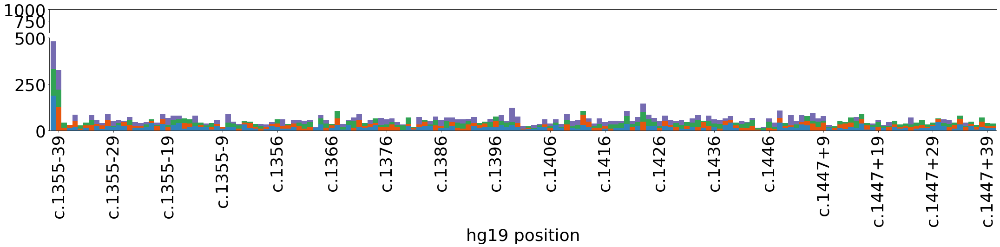

BB_test_Cos1053_JKLab0340_MM2B


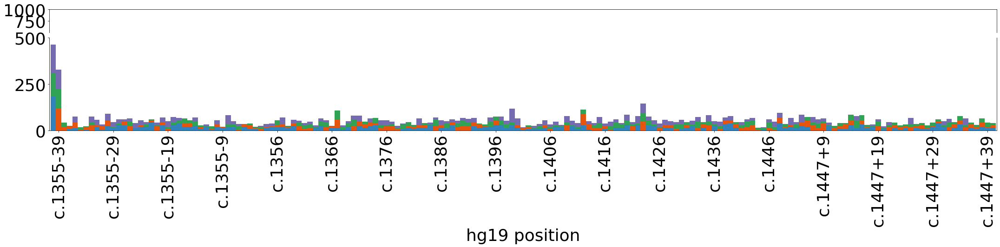

BB_test_Cos1053_oligodT_MM1B


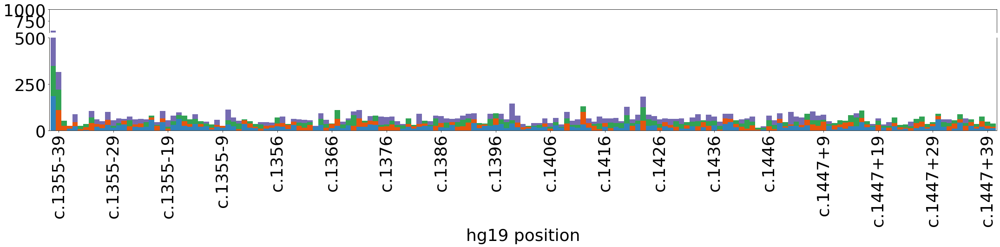

BB_test_Cos1053_oligodT_MM2B


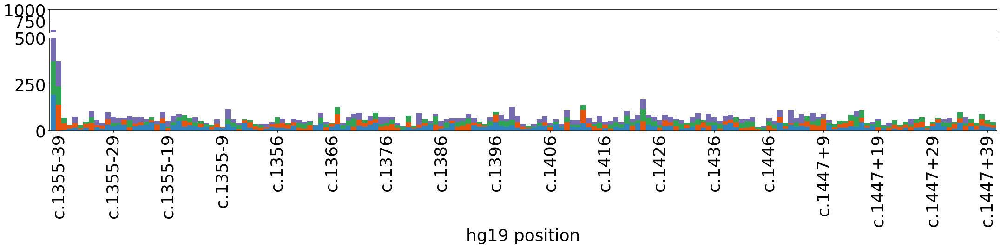

BB_RT_1_340_243_Cos1053


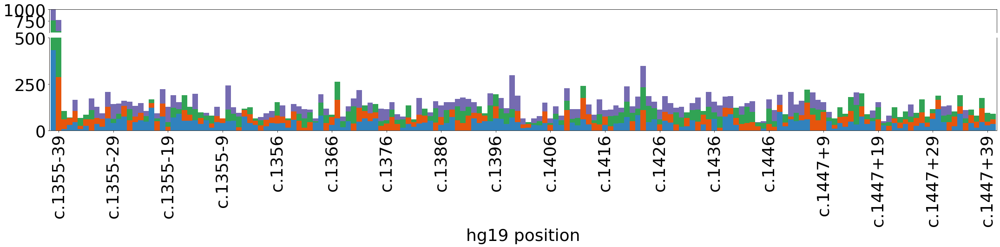

BB_RT_1_340_243_Hek1053


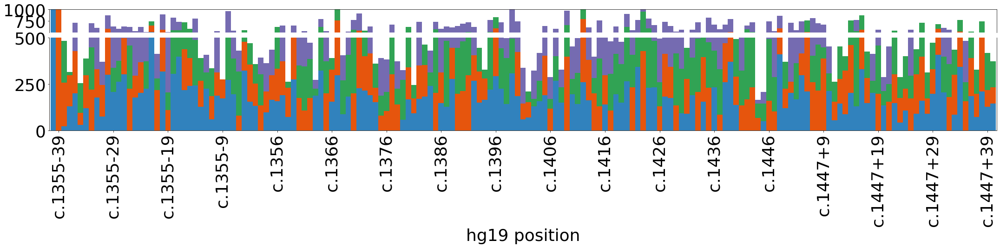

BB_RT_1_340_335_Cos1053


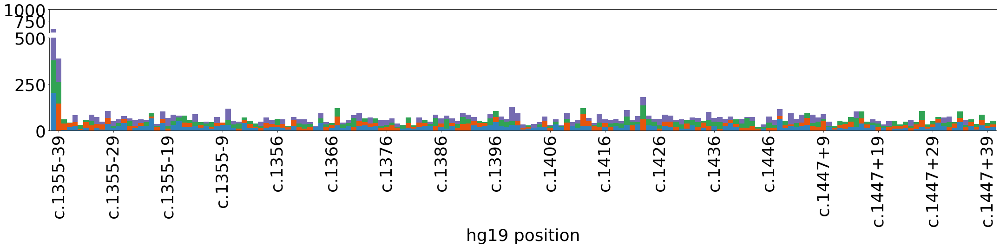

BB_RT_1_340_335_Hek1053


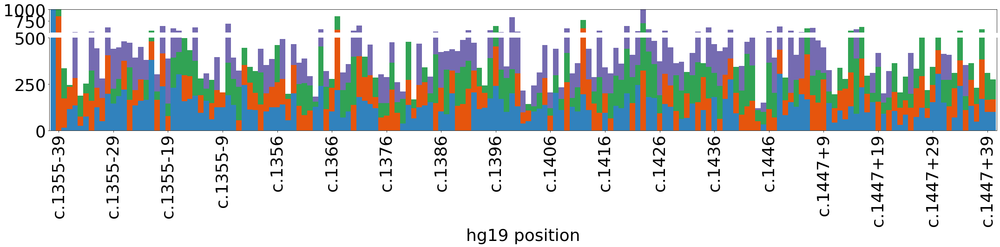

BB_RT_1b_340_243_Hek1053


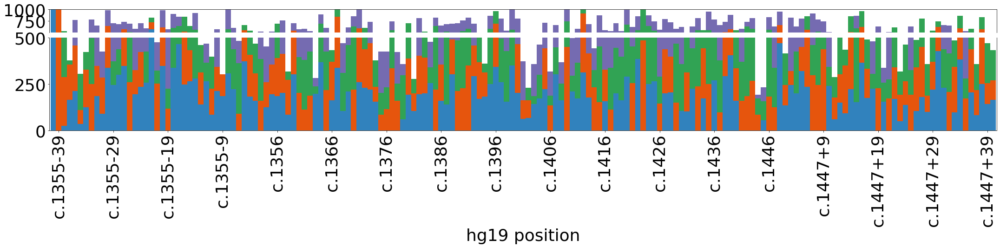

BB_RT_1b_340_335_Hek1053


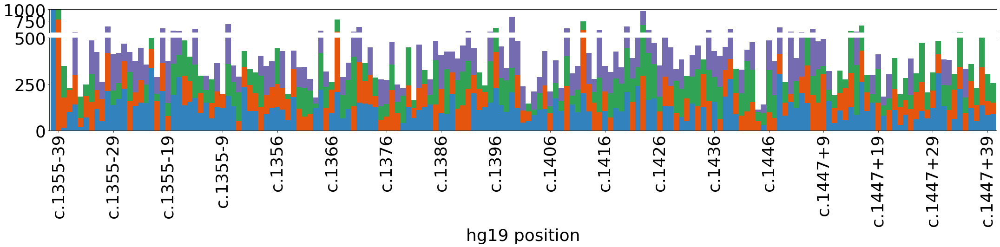

BB_RT_1b_ODT_243_Hek1053


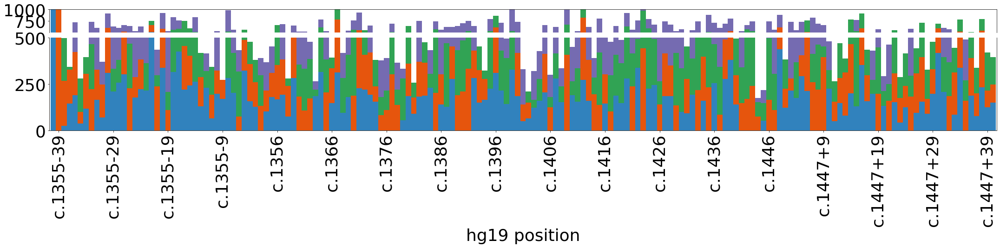

BB_RT_1b_ODT_335_Hek1053


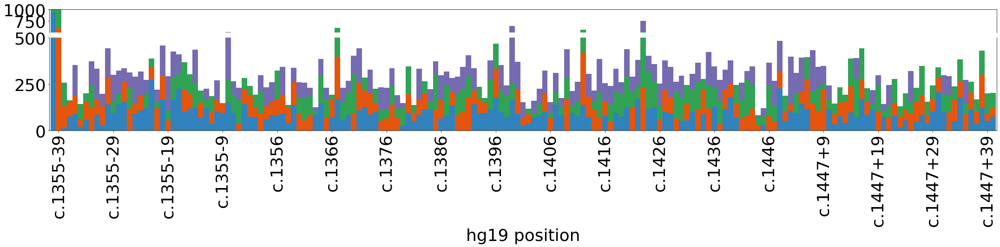

BB_RT_1_ODT_243_Cos1053


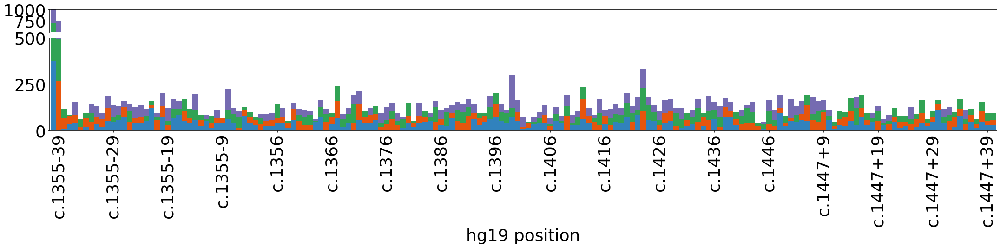

BB_RT_1_ODT_243_Hek1053


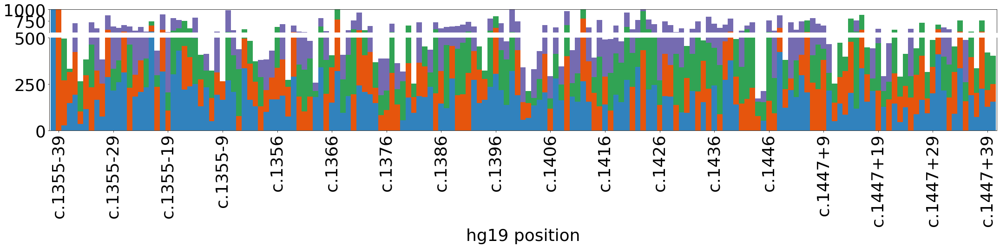

BB_RT_1_ODT_335_Cos1053


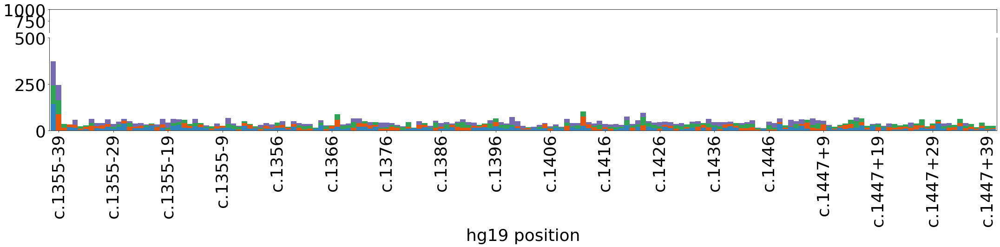

BB_RT_1_ODT_335_Hek1053


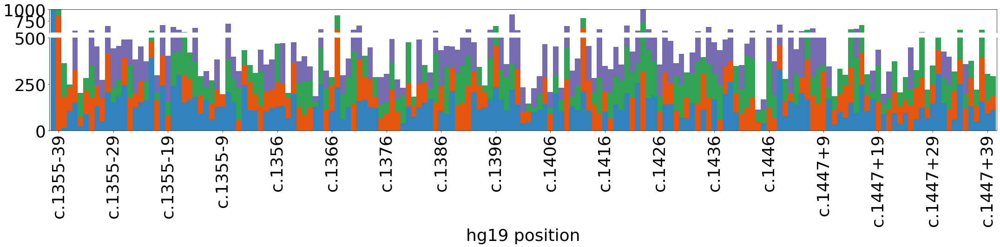

BB_RT_2_340_243_Cos1054


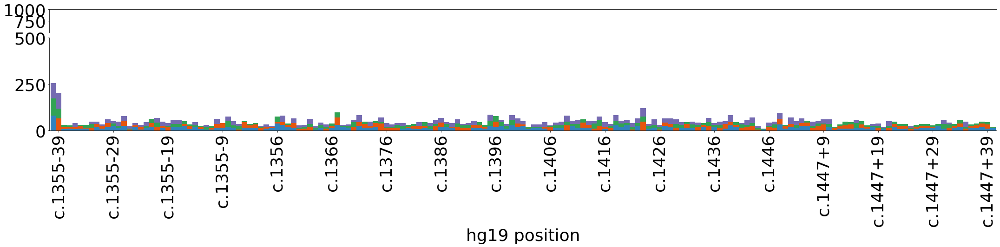

BB_RT_2_340_243_Hek1054


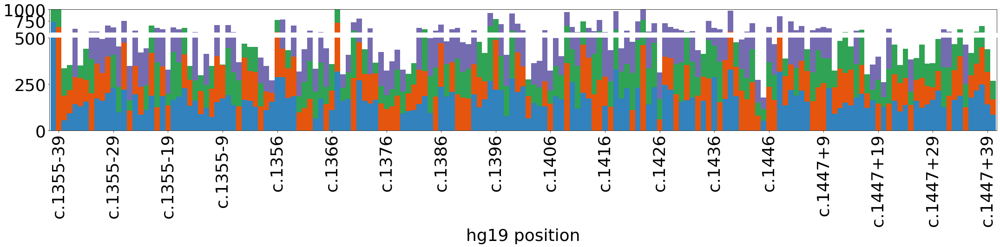

BB_RT_2_340_335_Cos1054


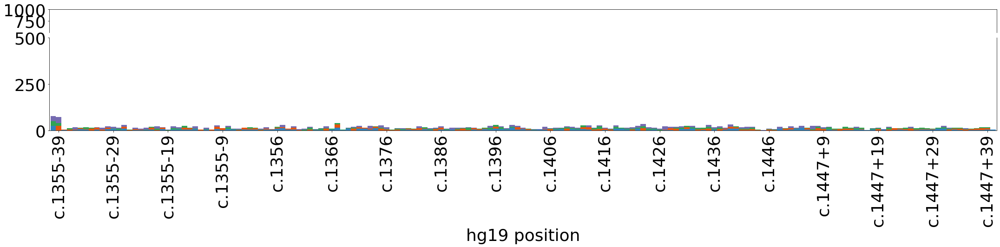

BB_RT_2_340_335_Hek1054


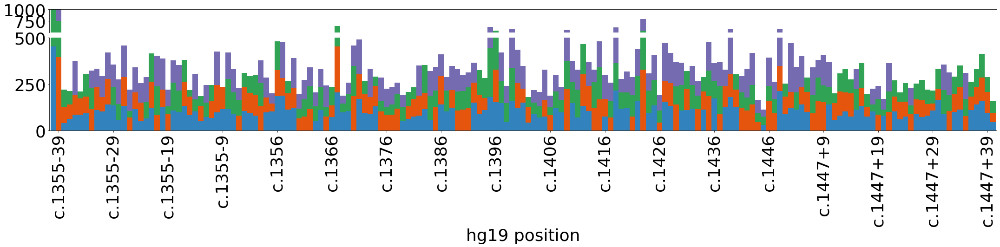

BB_RT_2_ODT_243_Cos1054


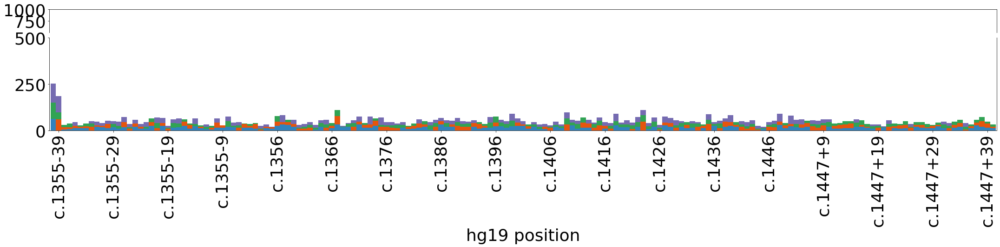

BB_RT_2_ODT_243_Hek1054


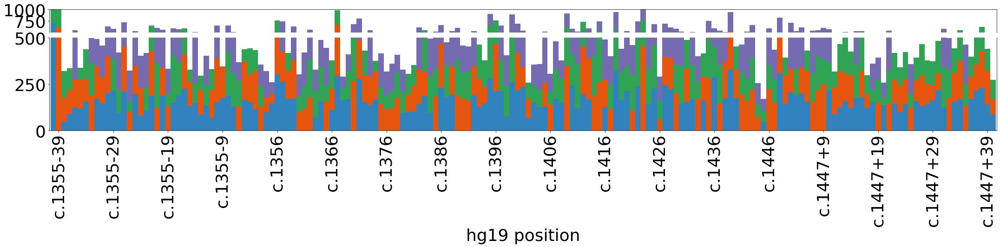

BB_RT_2_ODT_335_Hek1054


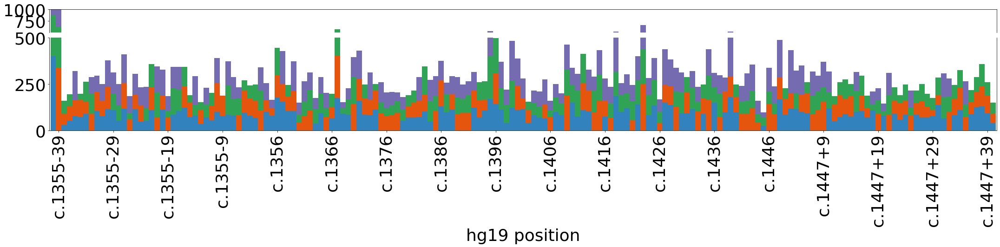

BB_RT_3_340_243_Cos1055


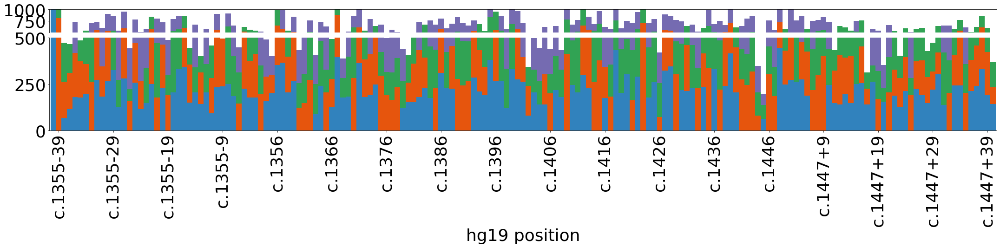

BB_RT_3_340_243_Hek1055


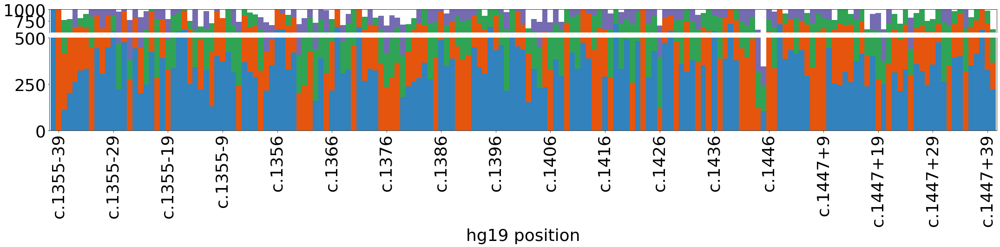

BB_RT_3_340_335_Cos1055


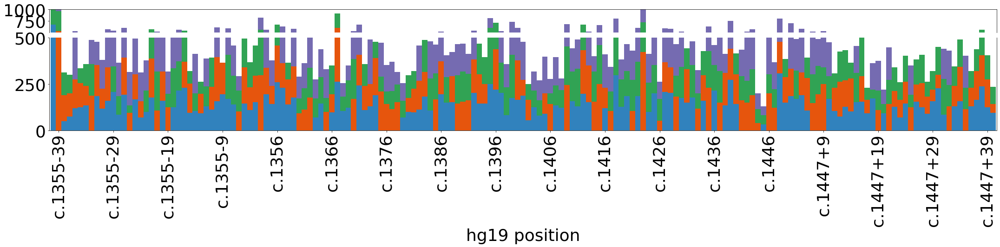

BB_RT_3_340_335_Hek1055


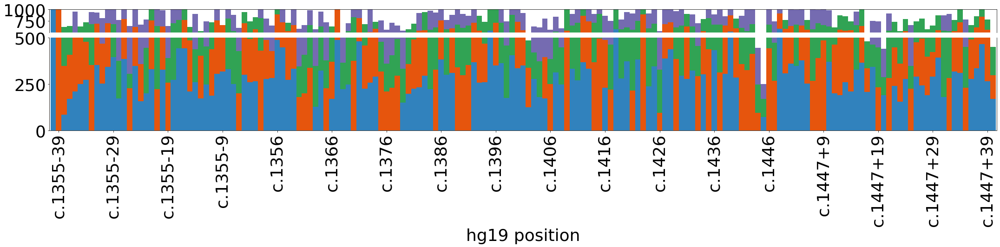

BB_RT_3_ODT_243_Cos1055


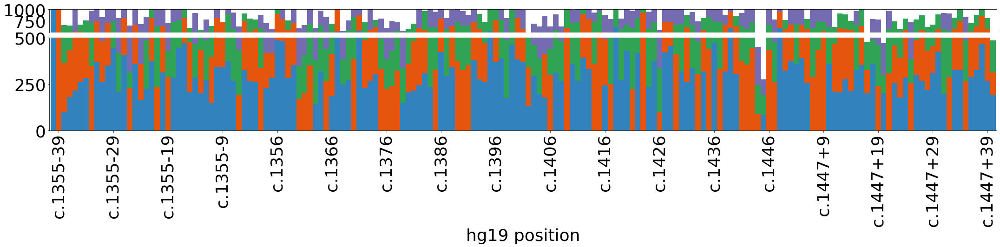

BB_RT_3_ODT_243_Hek1055


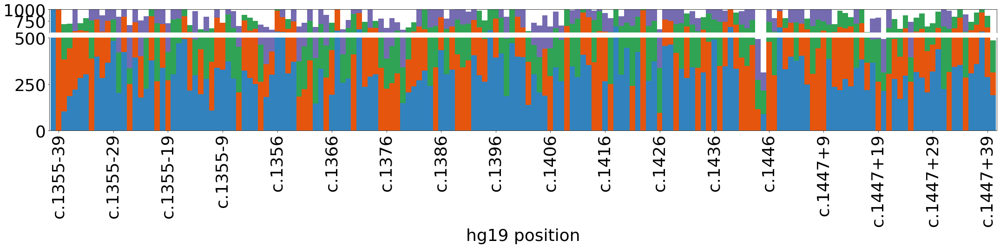

BB_RT_3_ODT_335_cos1055


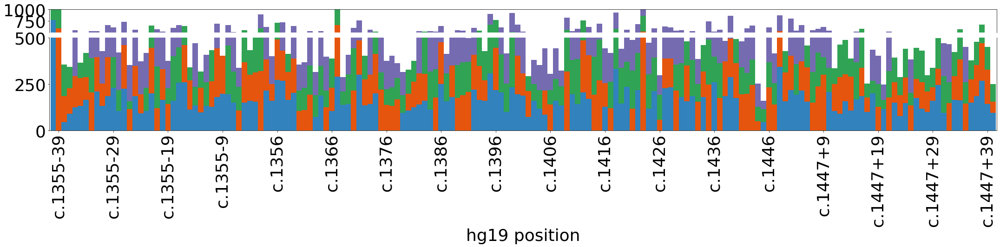

BB_RT_3_ODT_335_Hek1055


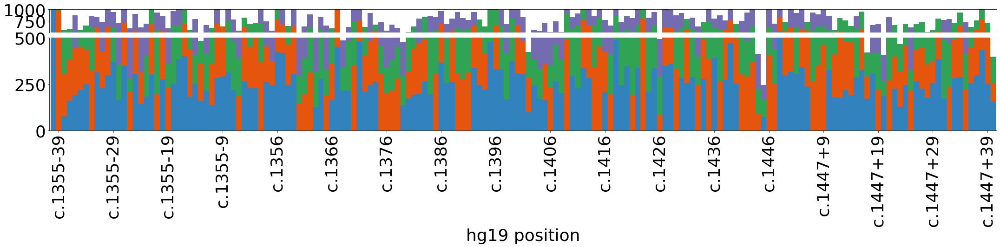

BB_RT_2_ODT_335_Cos1054


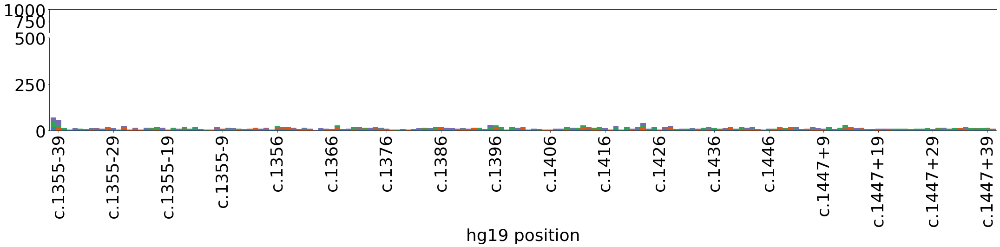

nan


TypeError: no numeric data to plot

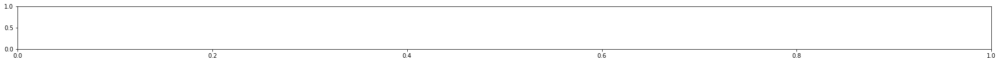

In [140]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.split_ax_bcs(  byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                  'ref': 'r',
                                                                                                                                  'alt_c': 'alt',
                                                                                                                                   'ref_c': 'ref' } ),
                  [ 'n_bc_passfilt' ],
                  'hgvs_pos',
                    [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                    [ ( 500.5, 1000 ), ( 0, 500 ) ],
                    fig_size = ( 30, 7.5 ),
                    legend = False,
                    hratios = [ 1, 4 ],
                    x_ax_title = 'hg19 position',
                    #tight = False,
                    #savefile = plot_out + 'bcs_filt_by_pos_split.pdf'
                           )

In [36]:
byvartbl_sat[ 'KTS_+_ratio' ] = ( byvartbl_sat[ 'wmean_KTS+' ] + .001 ) / ( byvartbl_sat[ 'wmean_KTS-' ] + .001 )

In [37]:
byvartbl_sat[ 'KTS_+_ratio' ].max()

1038.9746835443036

In [38]:
byvartbl_sat[ 'KTS_+_ratio' ].min()

0.0006662225183211193

In [39]:
byvartbl_sat[ 'KTS_+_ratio_log10' ] = np.log10( byvartbl_sat[ 'KTS_+_ratio' ] )

In [40]:
byvartbl_sat[ 'KTS_+_ratio_log10' ].max()

3.016604965332959

In [41]:
byvartbl_sat[ 'KTS_+_ratio_log10' ].min()

-3.1763806922432702

BB_test_Cos1053_JKLab0340_MM1B


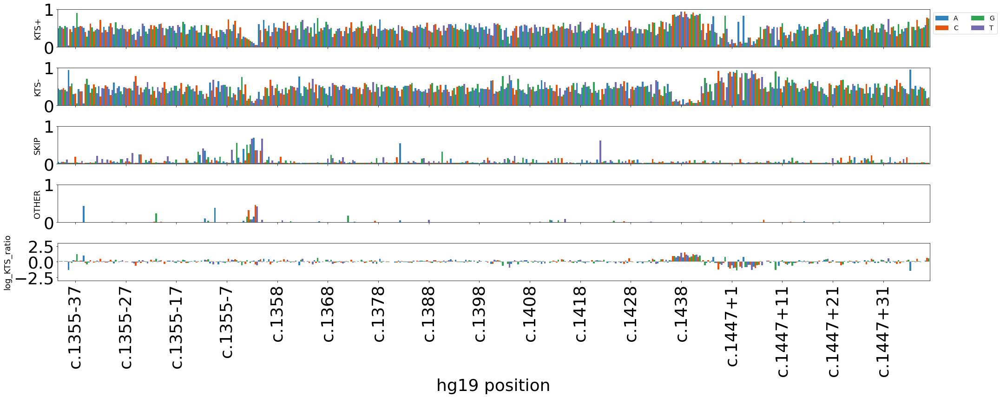

BB_test_Cos1053_JKLab0340_MM2B


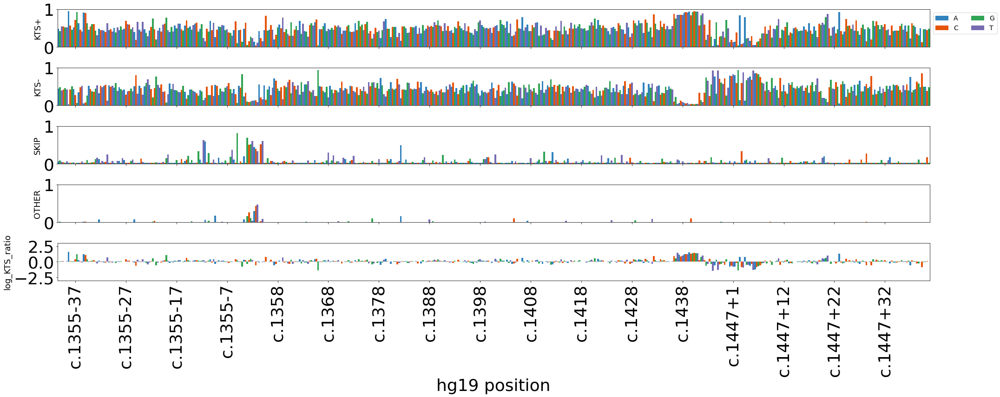

BB_test_Cos1053_oligodT_MM1B


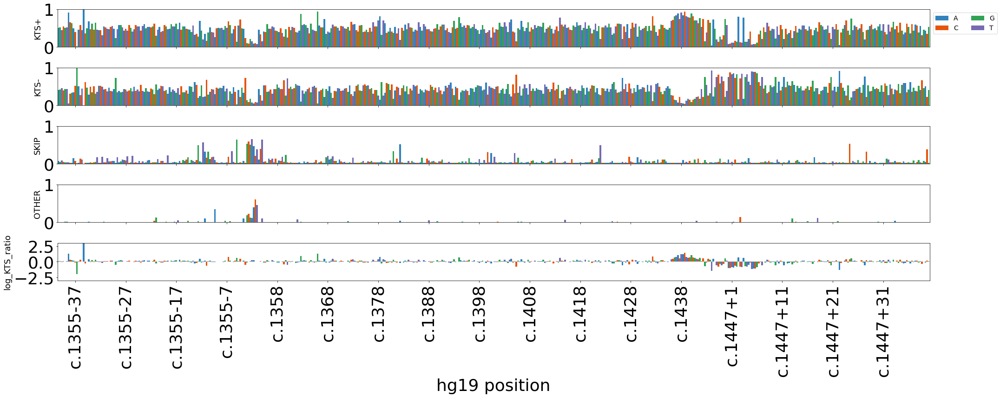

BB_test_Cos1053_oligodT_MM2B


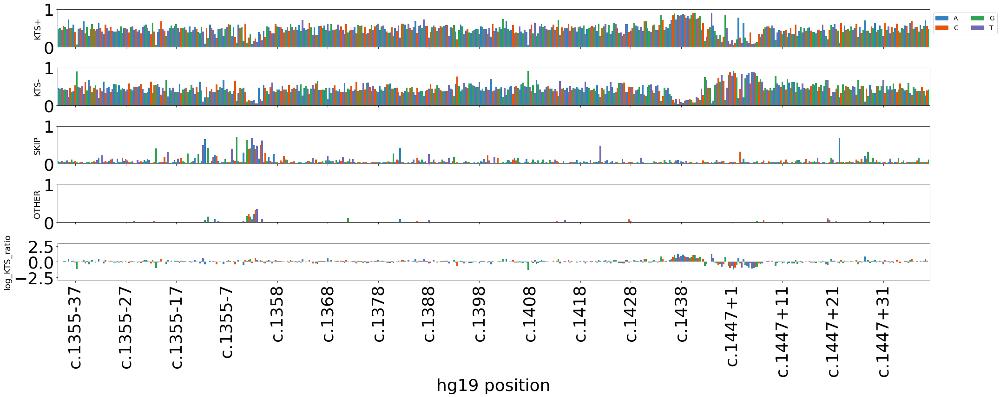

BB_RT_1_340_243_Cos1053


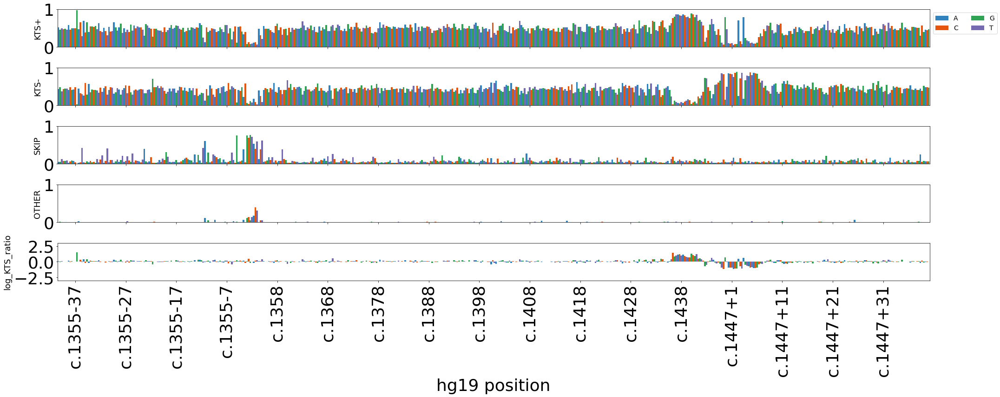

BB_RT_1_340_243_Hek1053


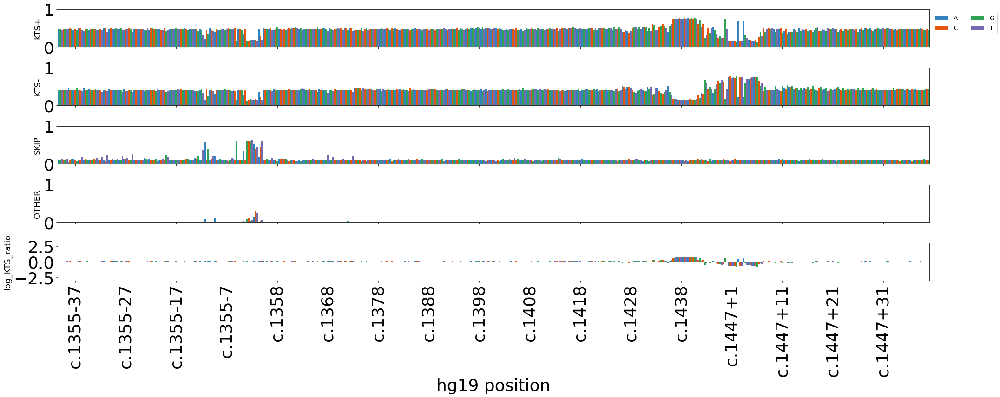

BB_RT_1_340_335_Cos1053


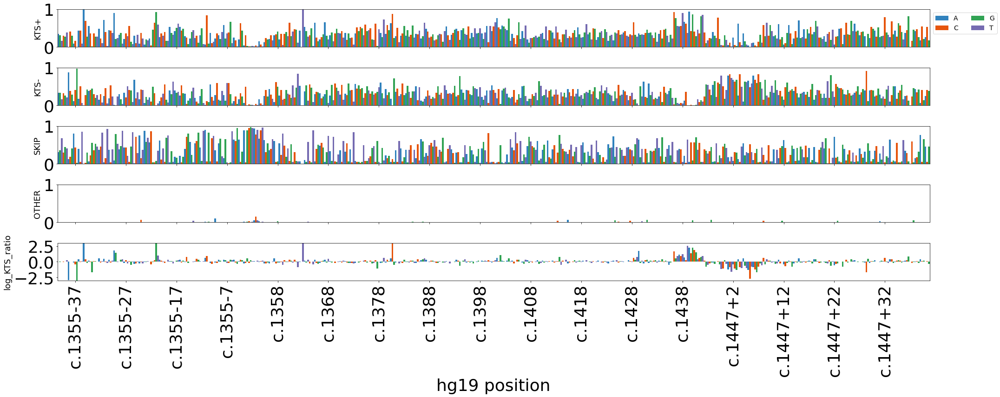

BB_RT_1_340_335_Hek1053


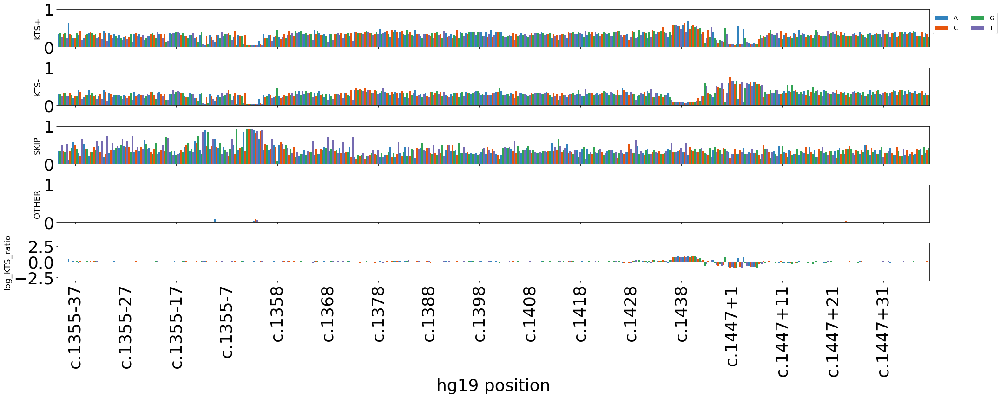

BB_RT_1b_340_243_Hek1053


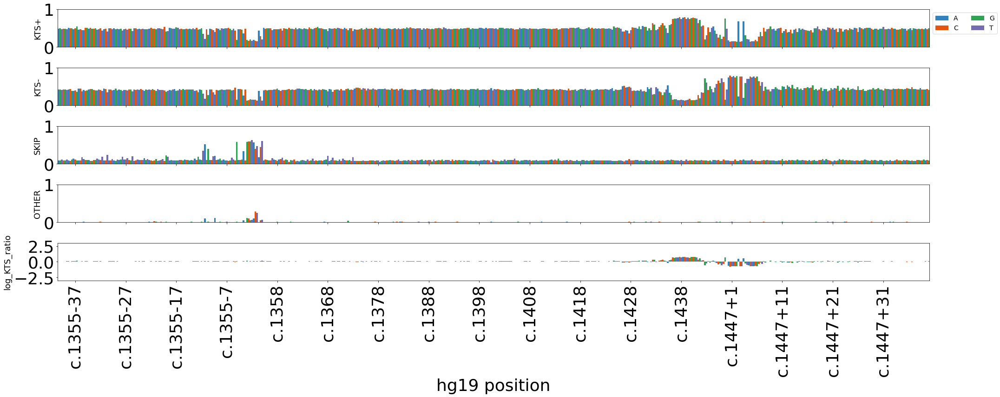

BB_RT_1b_340_335_Hek1053


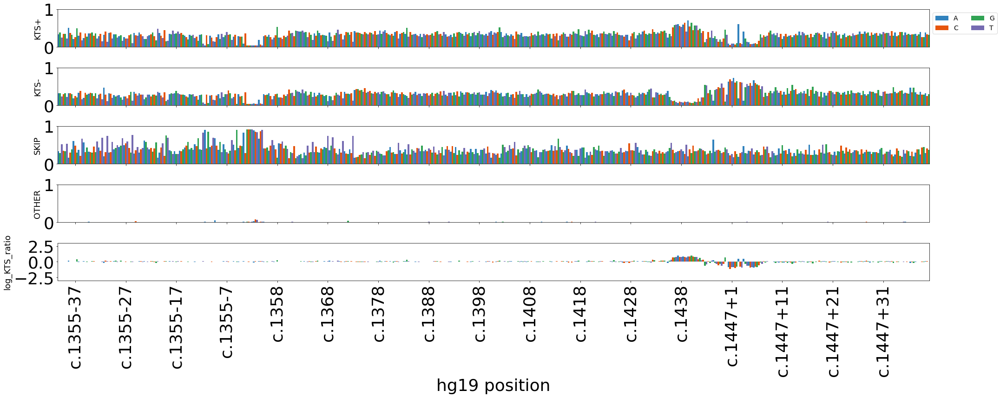

BB_RT_1b_ODT_243_Hek1053


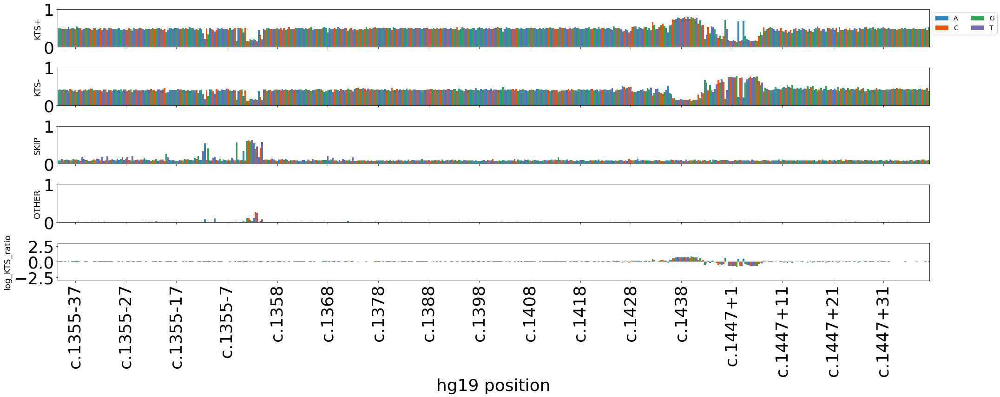

BB_RT_1b_ODT_335_Hek1053


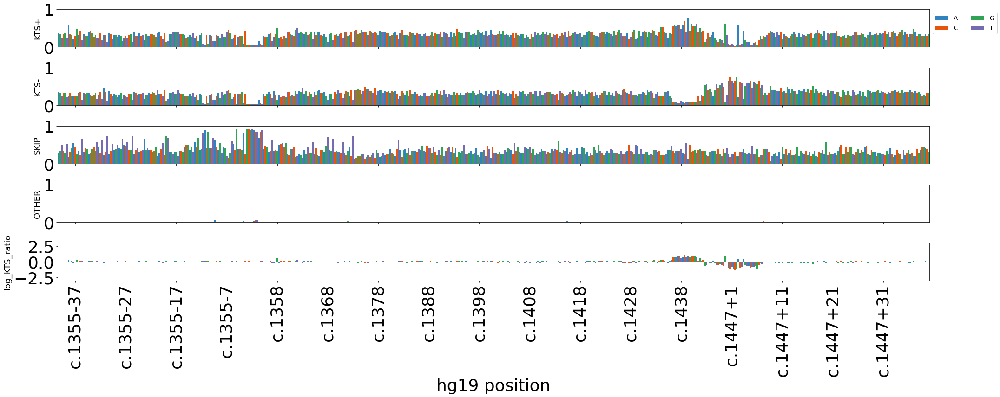

BB_RT_1_ODT_243_Cos1053


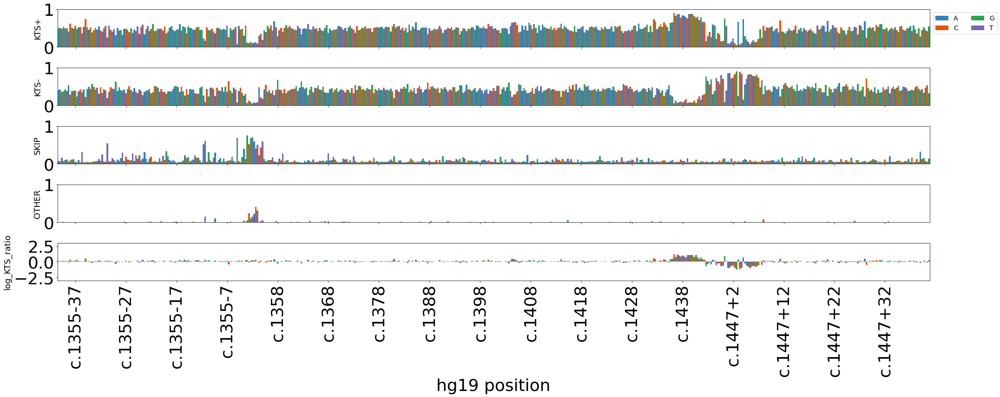

BB_RT_1_ODT_243_Hek1053


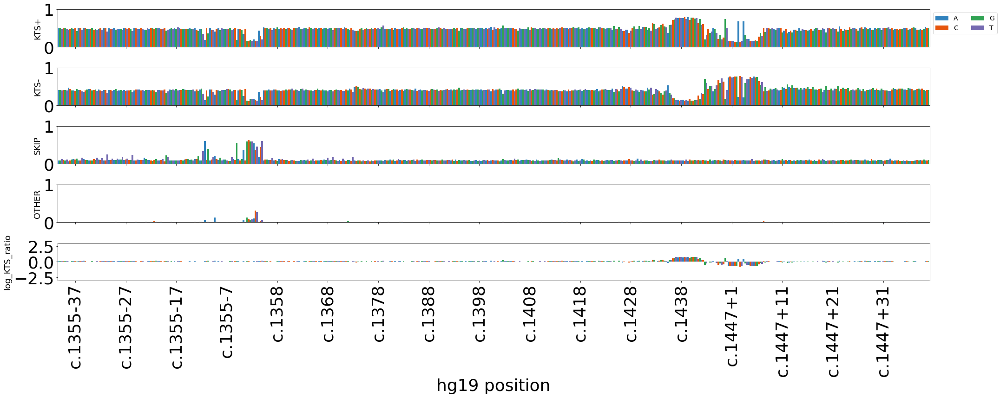

BB_RT_1_ODT_335_Cos1053


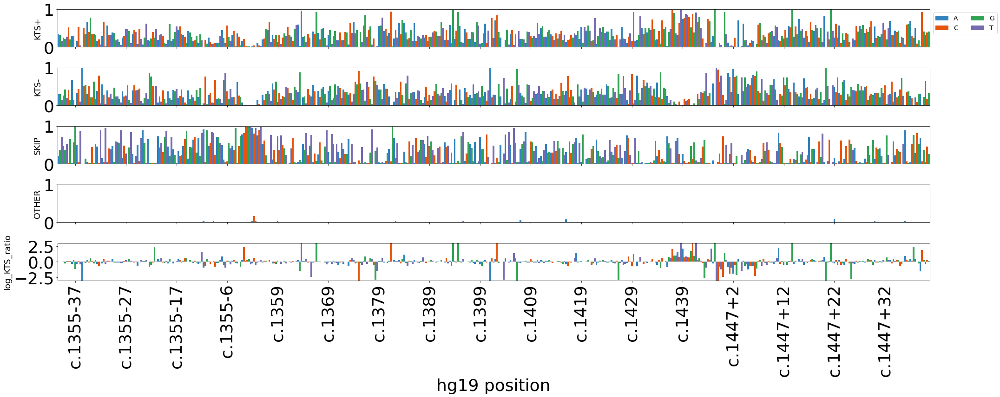

BB_RT_1_ODT_335_Hek1053


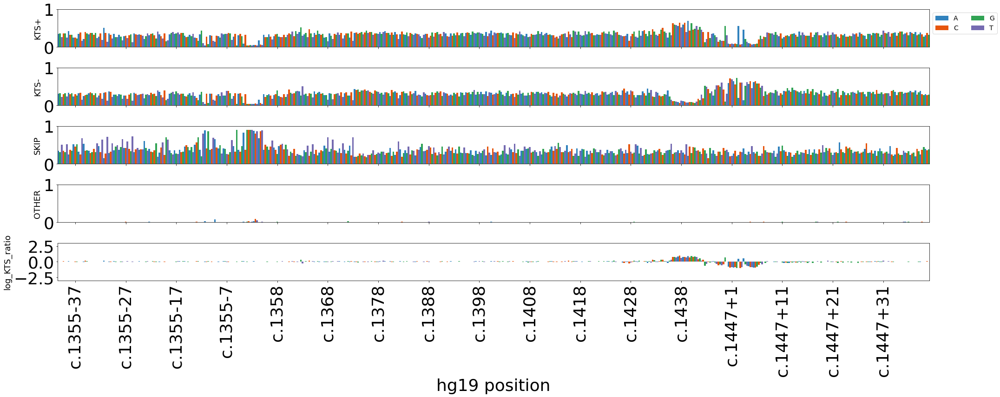

BB_RT_2_340_243_Cos1054


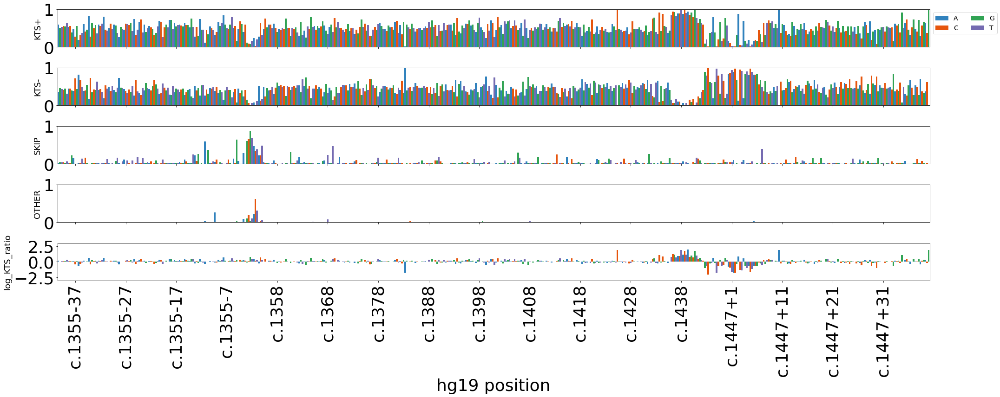

BB_RT_2_340_243_Hek1054


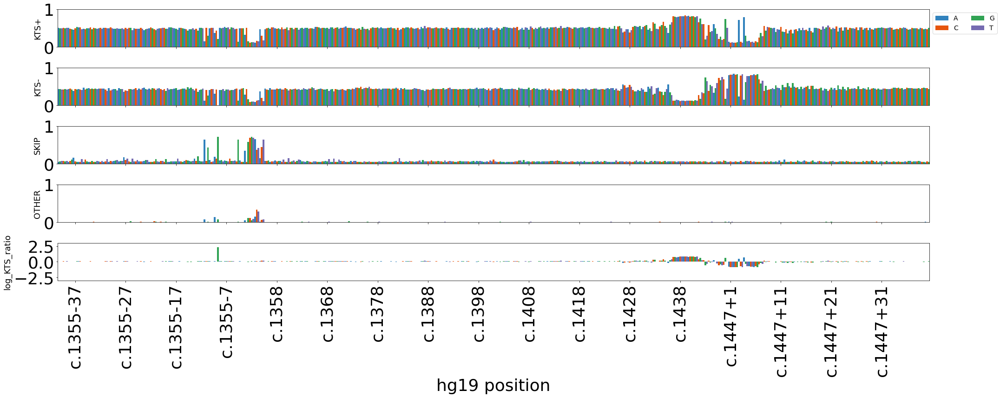

BB_RT_2_340_335_Cos1054


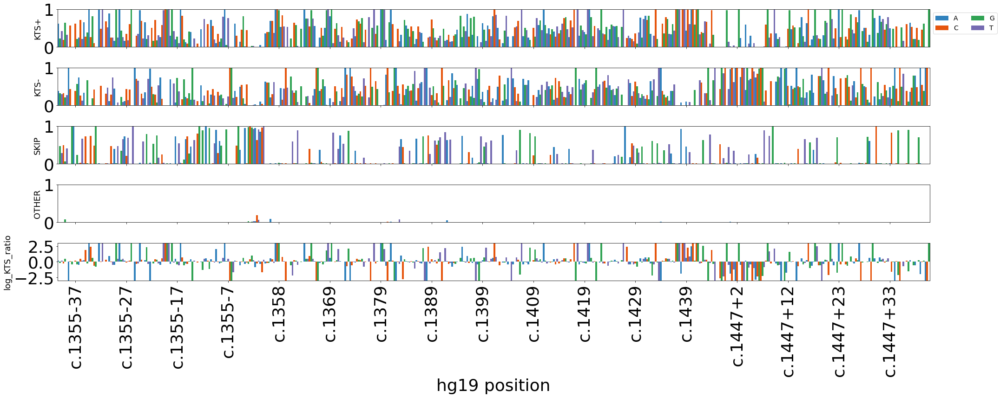

BB_RT_2_340_335_Hek1054


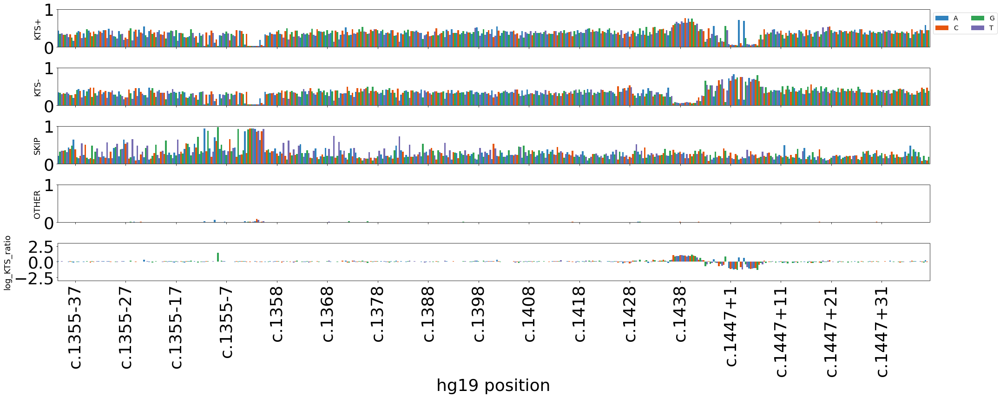

BB_RT_2_ODT_243_Cos1054


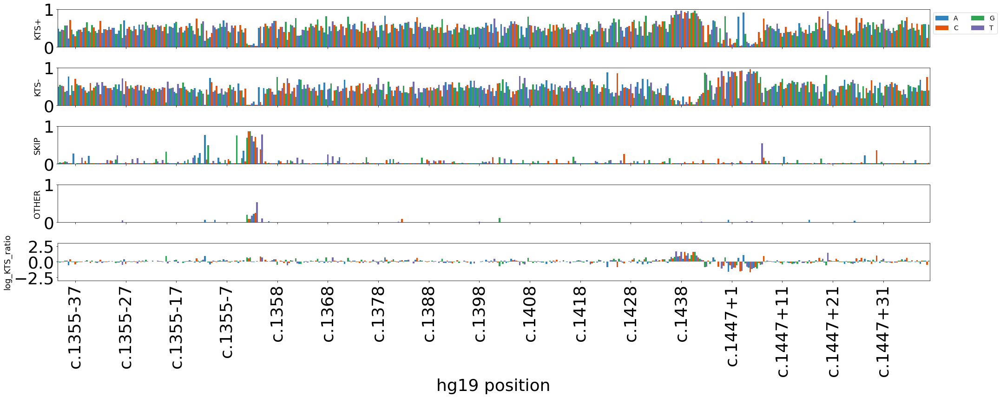

BB_RT_2_ODT_243_Hek1054


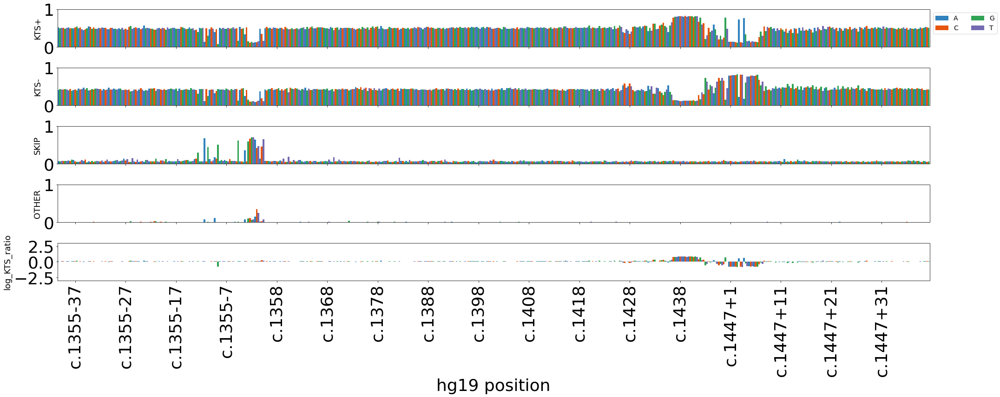

BB_RT_2_ODT_335_Cos1054


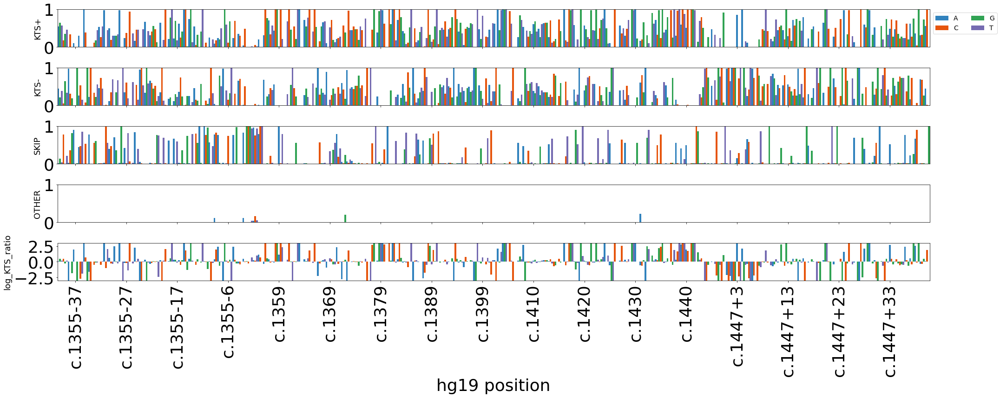

BB_RT_2_ODT_335_Hek1054


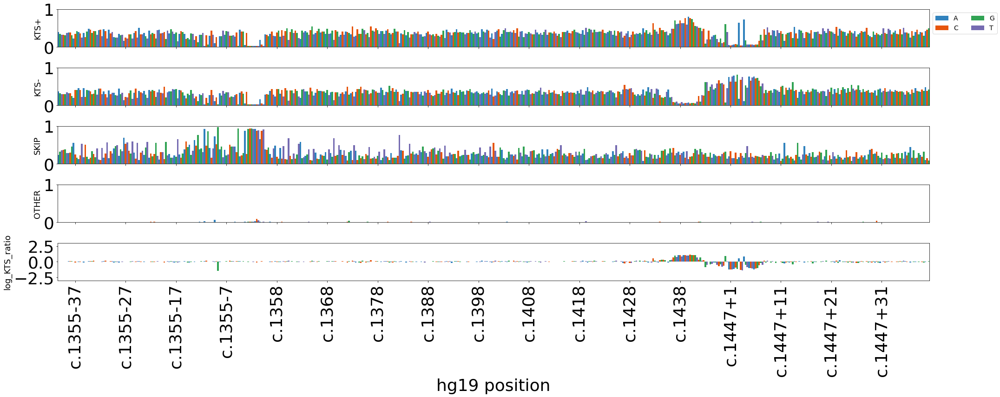

BB_RT_3_340_243_Cos1055


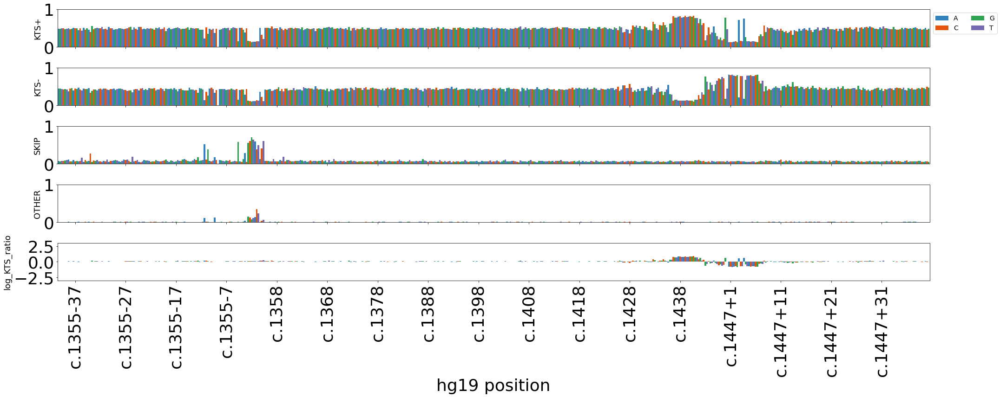

BB_RT_3_340_243_Hek1055


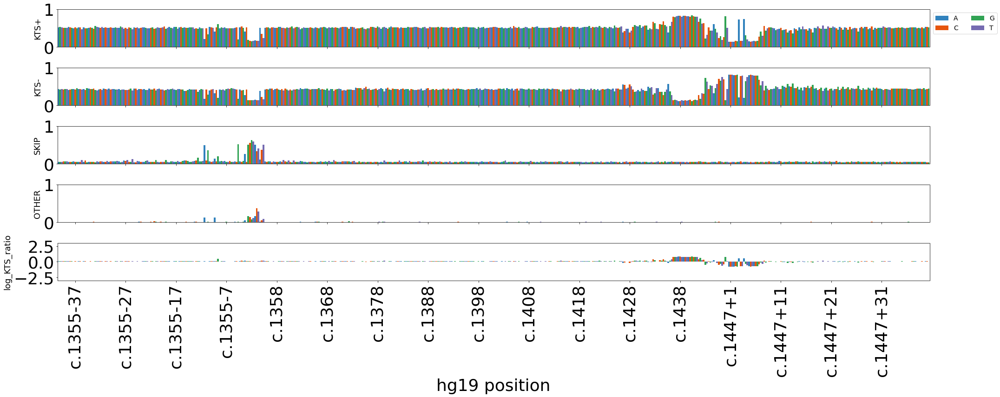

BB_RT_3_340_335_Cos1055


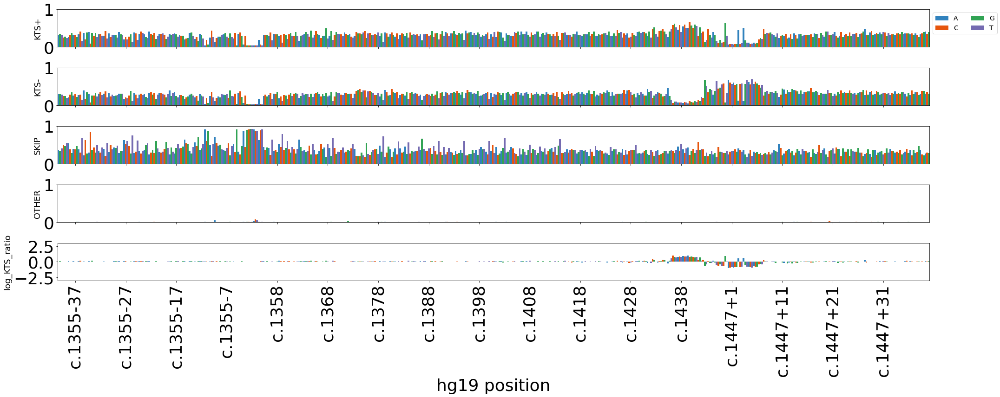

BB_RT_3_340_335_Hek1055


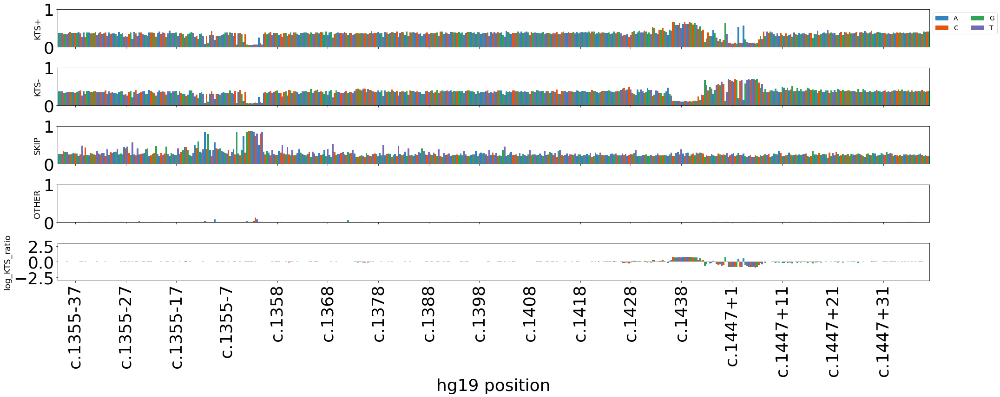

BB_RT_3_ODT_243_Cos1055


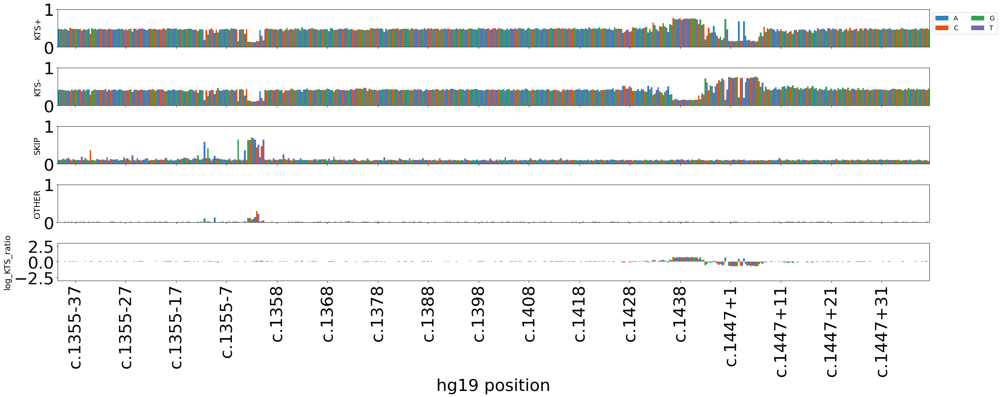

BB_RT_3_ODT_243_Hek1055


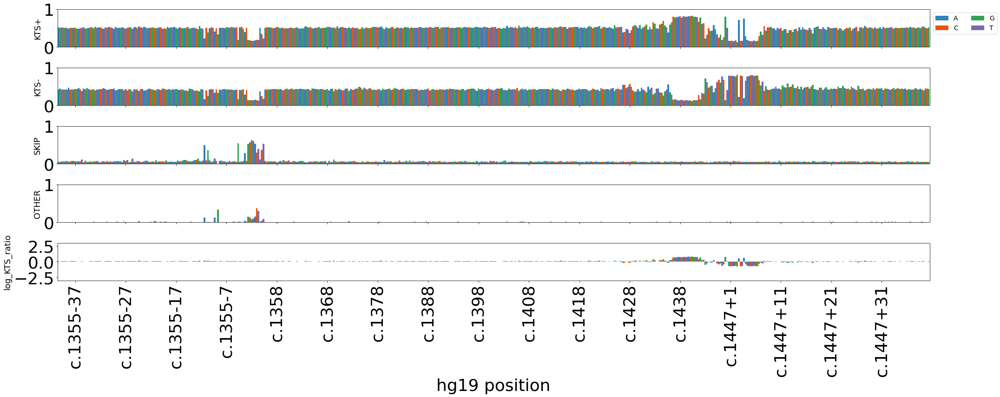

BB_RT_3_ODT_335_cos1055


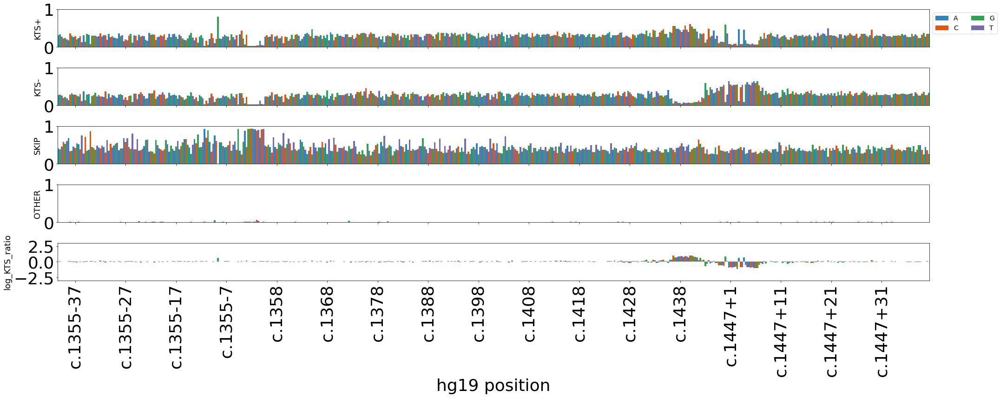

BB_RT_3_ODT_335_Hek1055


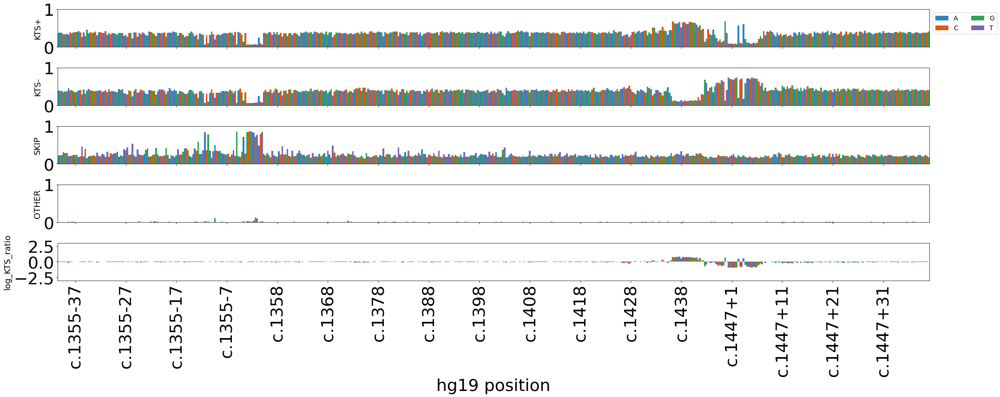

/home/smithcat/splfxseq/splanl/plots.py:2882: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  ax.set_xlim( ( -.5, len( tbv ) - .5 ) )
No handles with labels found to put in legend.


nan


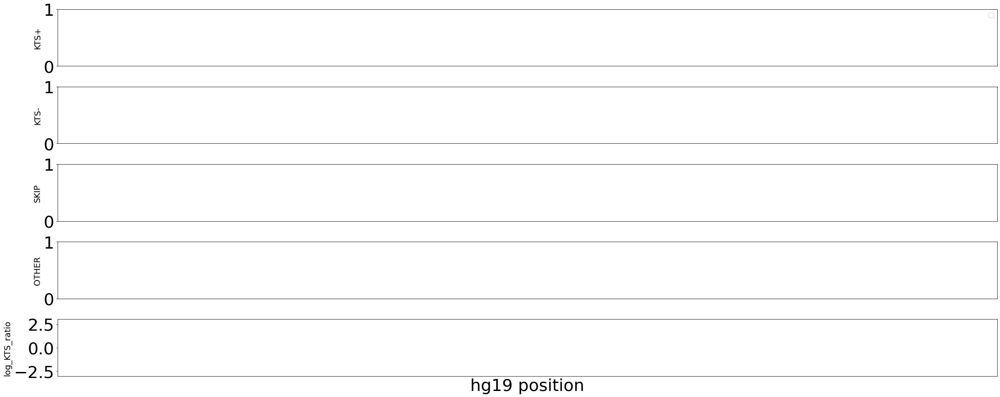

In [42]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.sat_subplots_wrapper( byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                         'ref': 'r',
                                                                                                                                          'alt_c': 'alt',
                                                                                                                                         'ref_c': 'ref' } ),
                         [ col for col in byvartbl_sat if col.startswith( 'wmean_' ) ] + [ 'KTS_+_ratio_log10' ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 12 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -3, 3 ) ],
                          y_ax_title = [ col[ 6: ] for col in byvartbl_sat if col.startswith( 'wmean_' ) ] + [ 'log_KTS_ratio' ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [157]:
low_bc_samps = [ 'BB_RT_2_340_243_Cos1054', 'BB_RT_2_ODT_335_Cos1054', 'BB_RT_2_ODT_243_Cos1054', 'BB_RT_2_340_335_Cos1054',  ]  

BB_RT_2_340_243_Cos1054


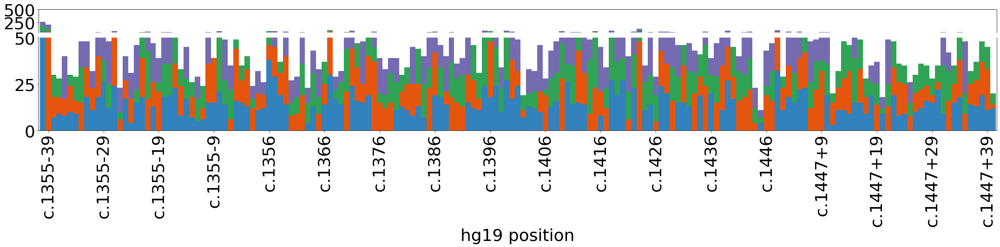

BB_RT_2_340_335_Cos1054


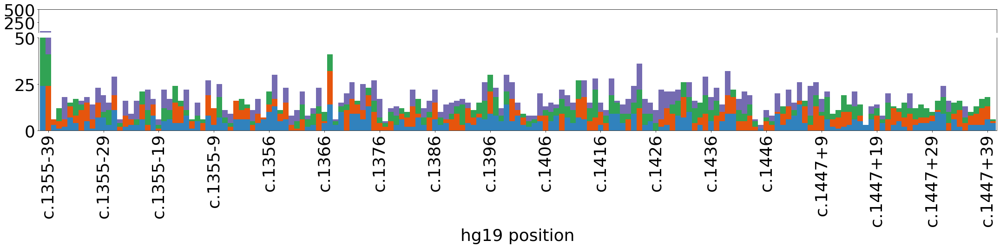

BB_RT_2_ODT_243_Cos1054


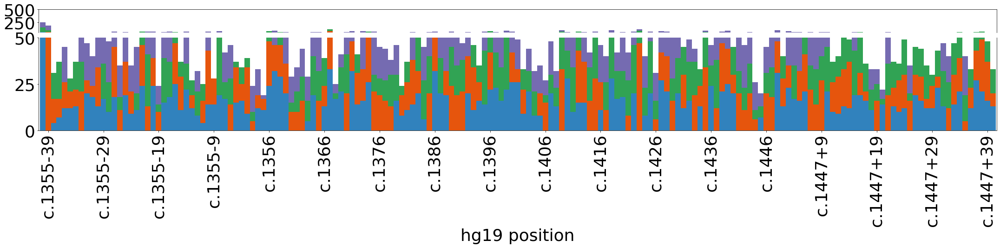

BB_RT_2_ODT_335_Cos1054


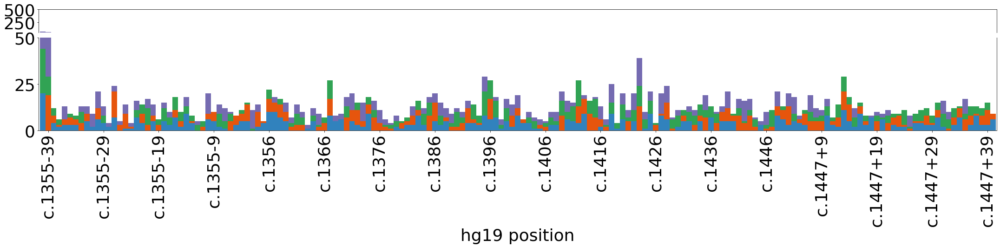

In [158]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    if samp not in low_bc_samps:
        continue
    
    print( samp )

    sp.split_ax_bcs(  byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                  'ref': 'r',
                                                                                                                                  'alt_c': 'alt',
                                                                                                                                   'ref_c': 'ref' } ),
                  [ 'n_bc_passfilt' ],
                  'hgvs_pos',
                    [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                    [ ( 50.5, 500 ), ( 0, 50 ) ],
                    fig_size = ( 30, 7.5 ),
                    legend = False,
                    hratios = [ 1, 4 ],
                    x_ax_title = 'hg19 position',
                    #tight = False,
                    #savefile = plot_out + 'bcs_filt_by_pos_split.pdf'
                           )

BB_test_Cos1053_JKLab0340_MM1B


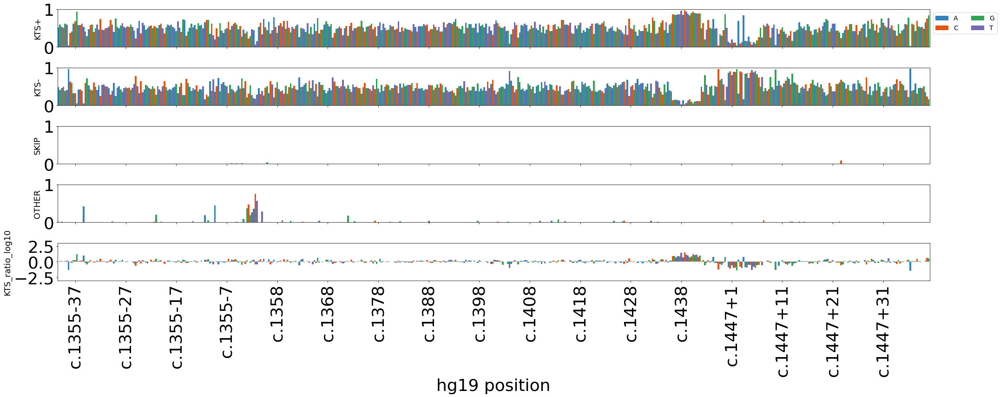

BB_test_Cos1053_JKLab0340_MM2B


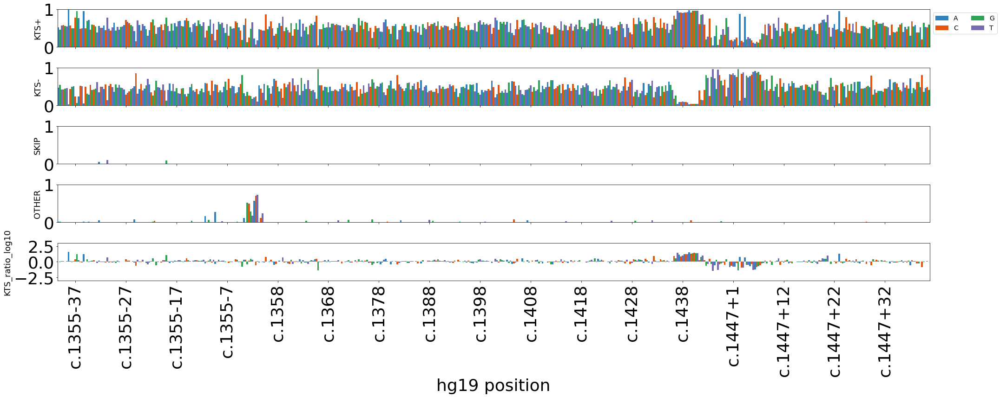

BB_test_Cos1053_oligodT_MM1B


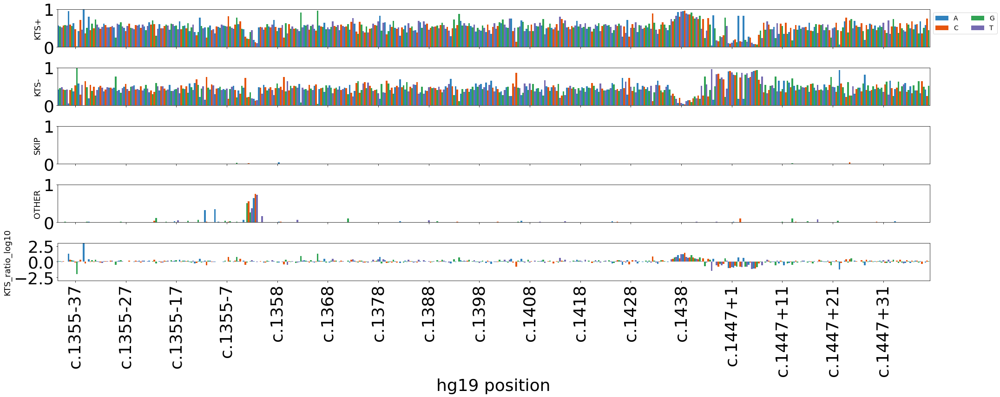

BB_test_Cos1053_oligodT_MM2B


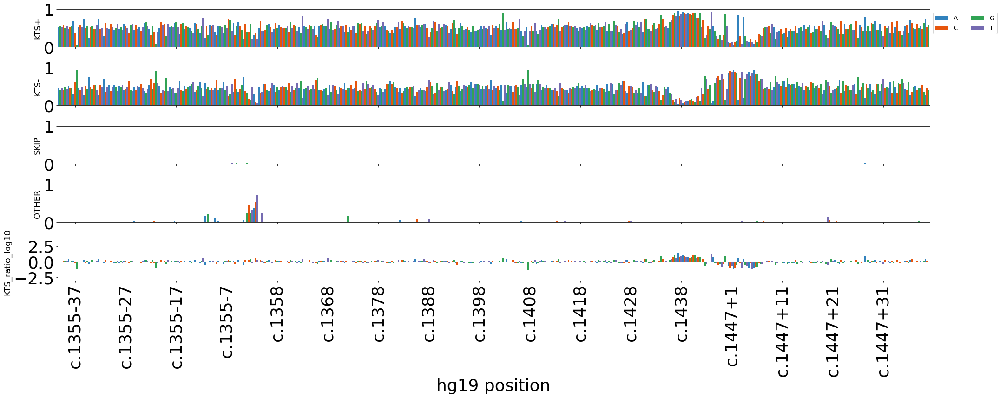

BB_RT_1_340_243_Cos1053


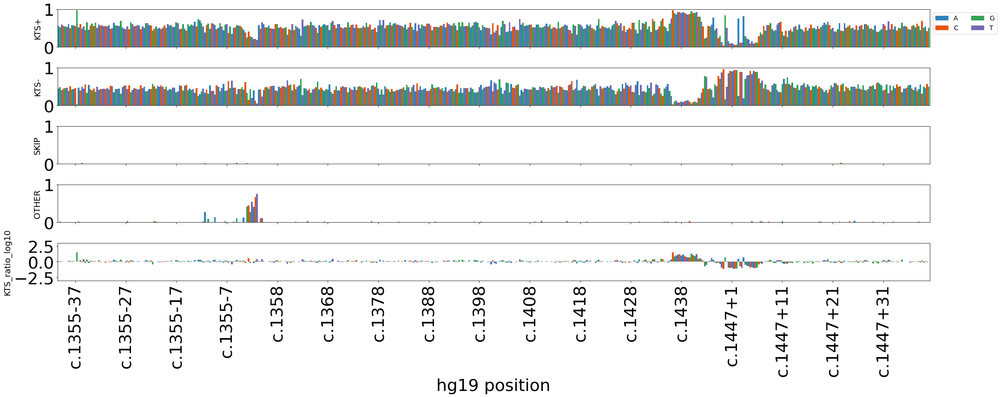

BB_RT_1_340_243_Hek1053


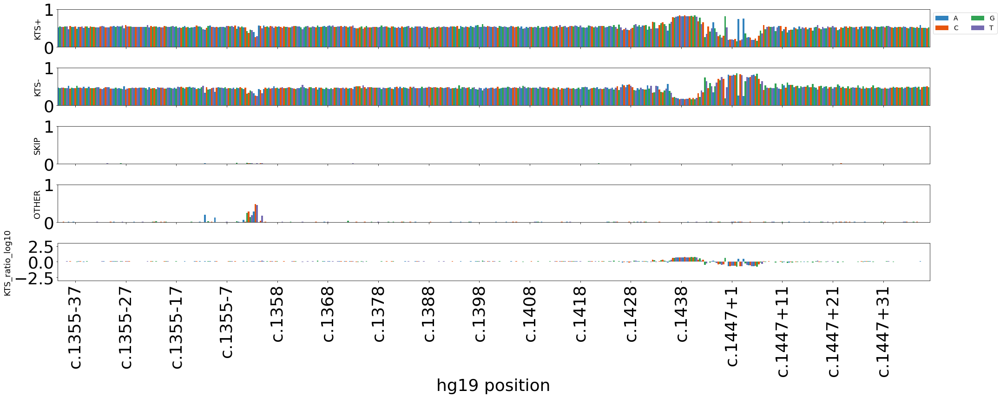

BB_RT_1_340_335_Cos1053


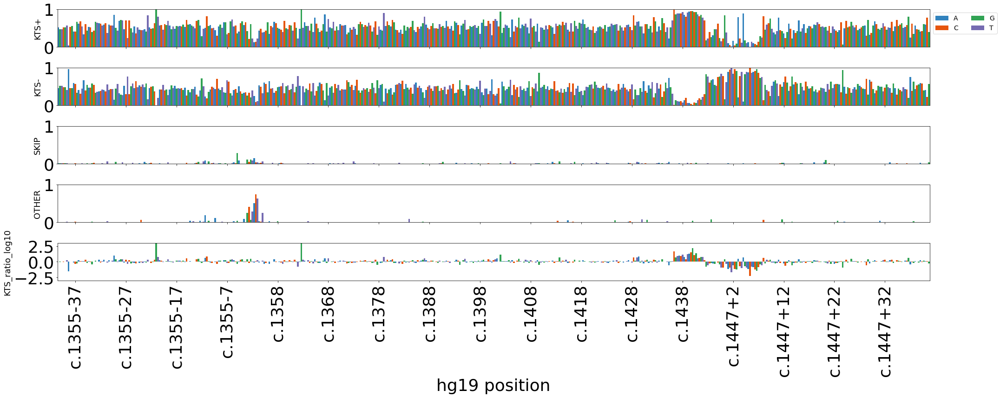

BB_RT_1_340_335_Hek1053


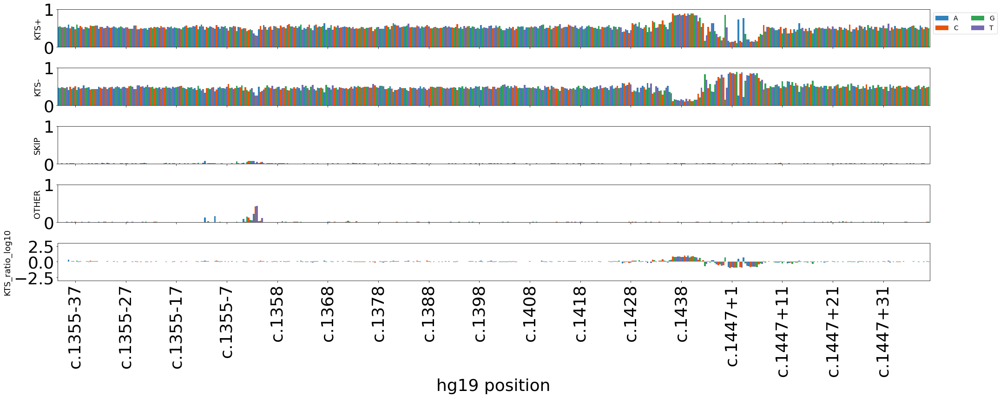

BB_RT_1b_340_243_Hek1053


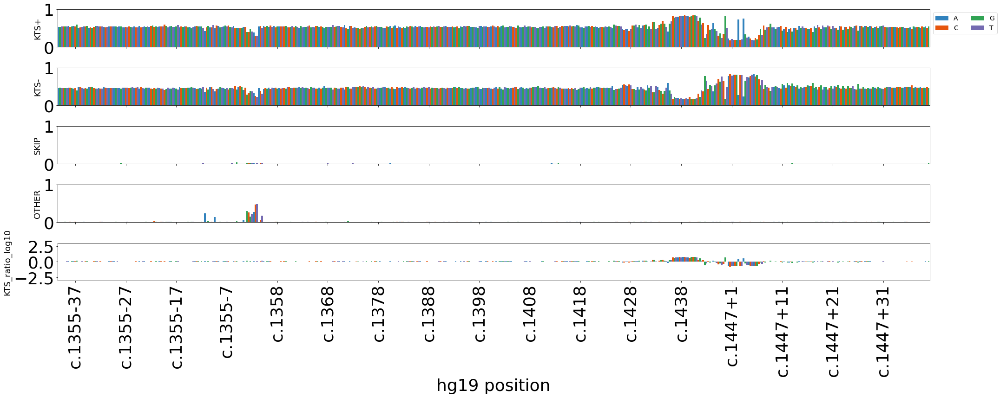

BB_RT_1b_340_335_Hek1053


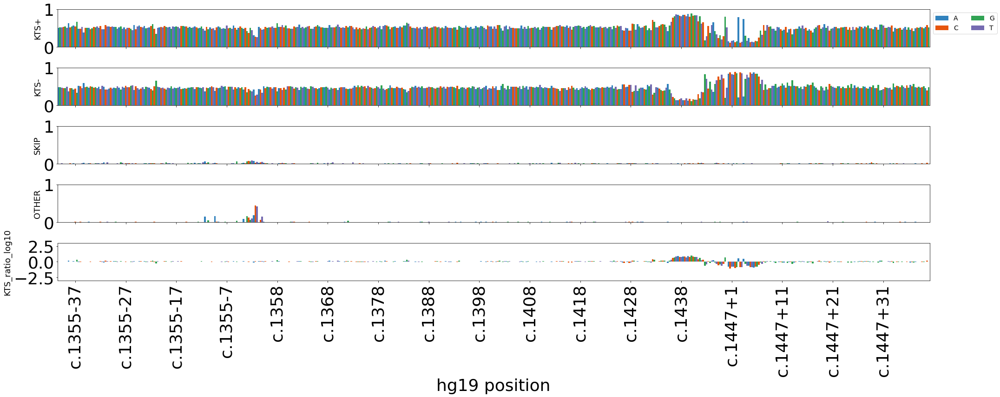

BB_RT_1b_ODT_243_Hek1053


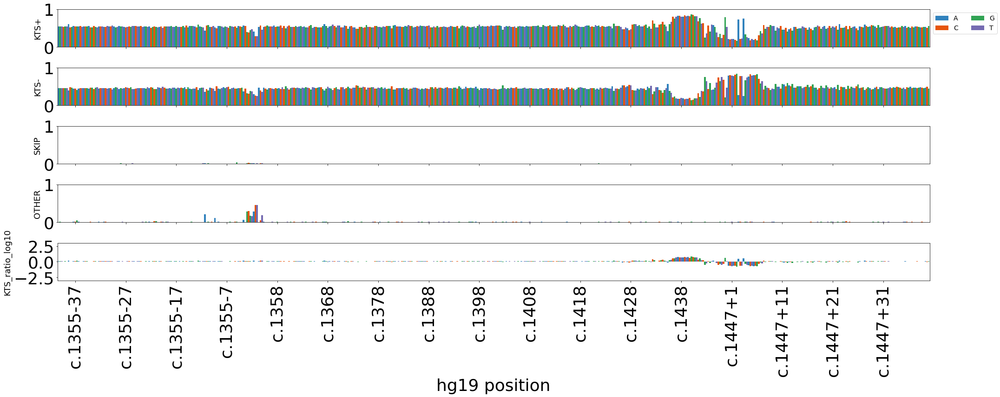

BB_RT_1b_ODT_335_Hek1053


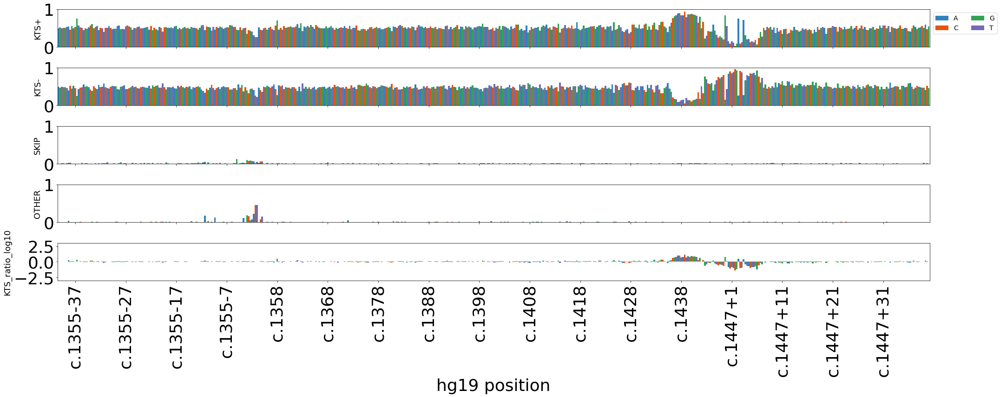

BB_RT_1_ODT_243_Cos1053


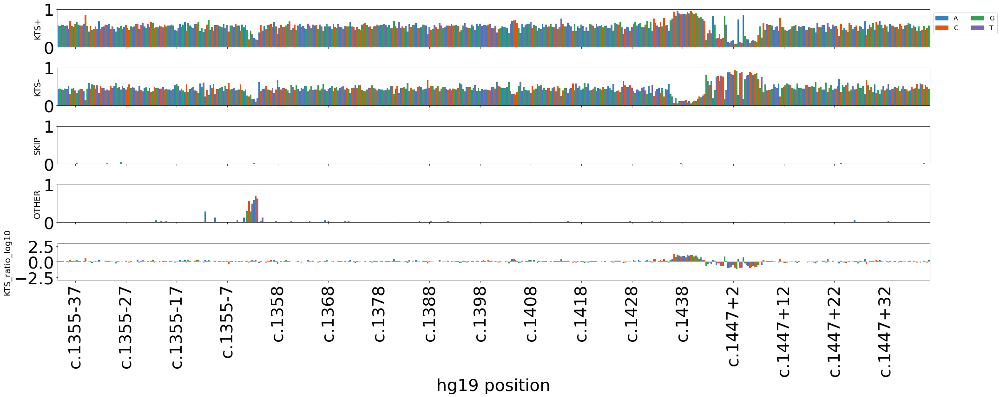

BB_RT_1_ODT_243_Hek1053


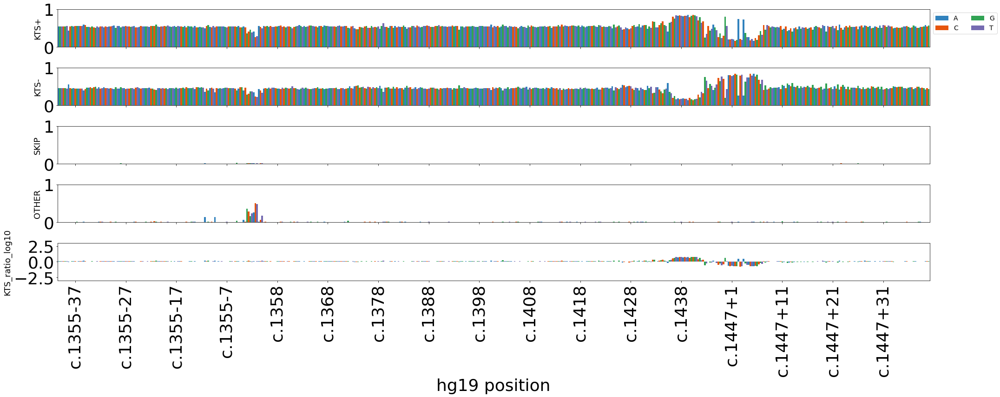

BB_RT_1_ODT_335_Cos1053


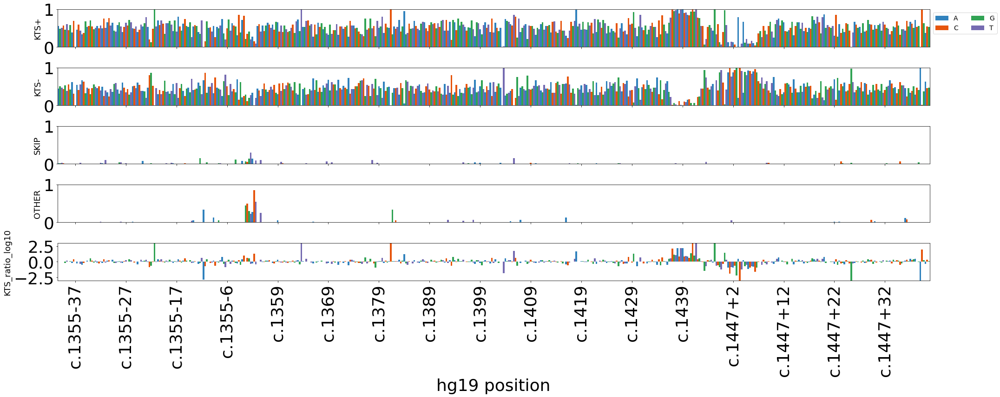

BB_RT_1_ODT_335_Hek1053


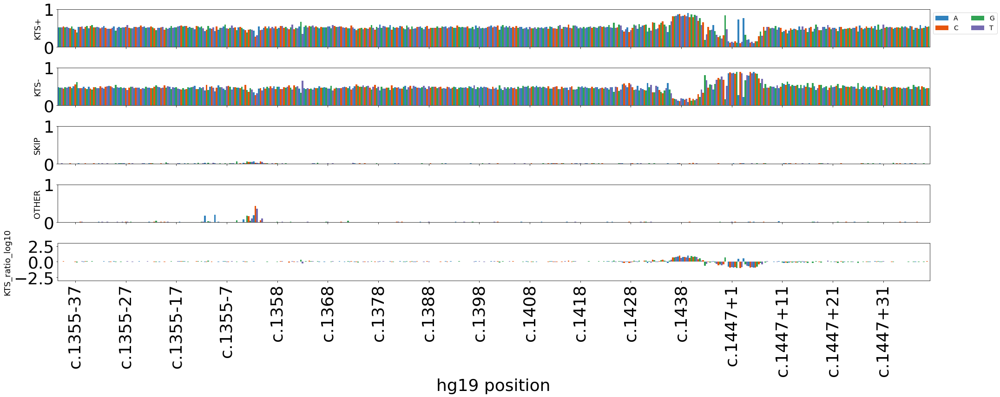

BB_RT_2_340_243_Cos1054


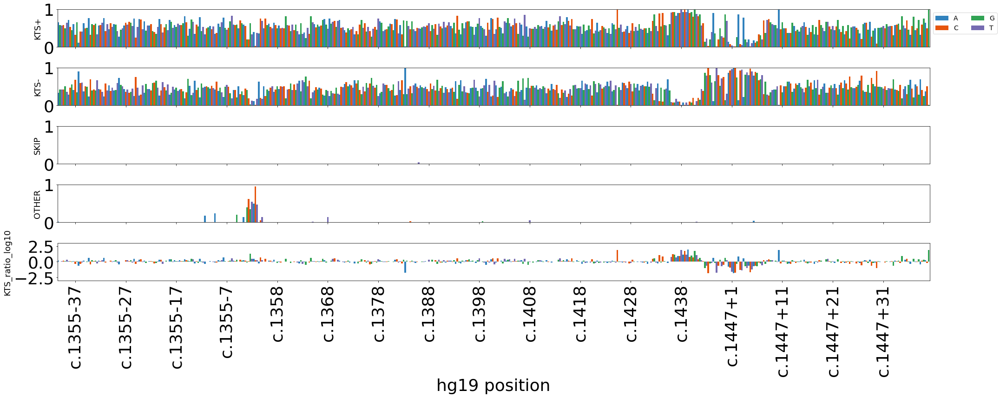

BB_RT_2_340_243_Hek1054


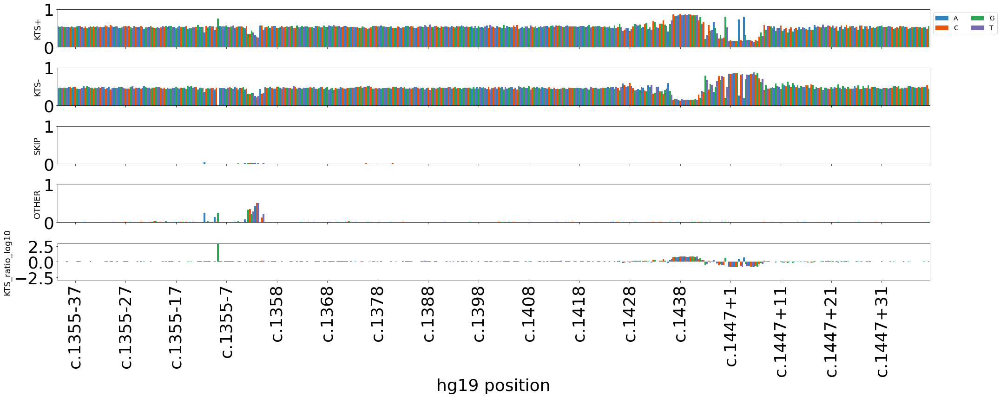

BB_RT_2_340_335_Cos1054


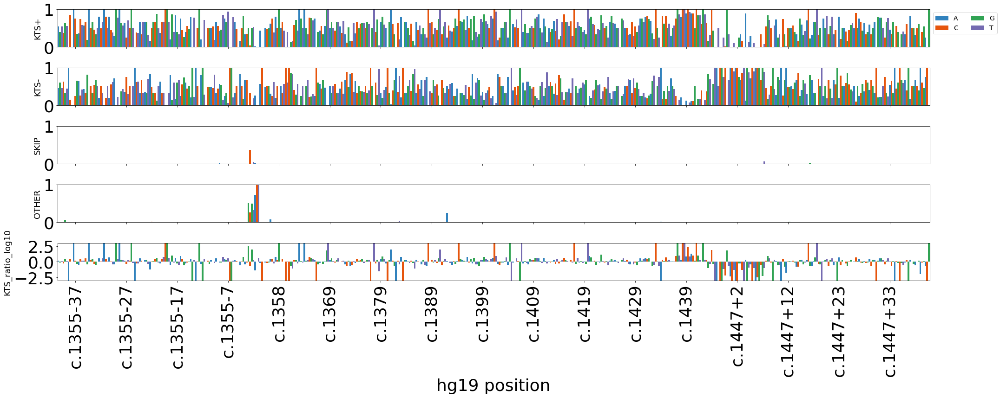

BB_RT_2_340_335_Hek1054


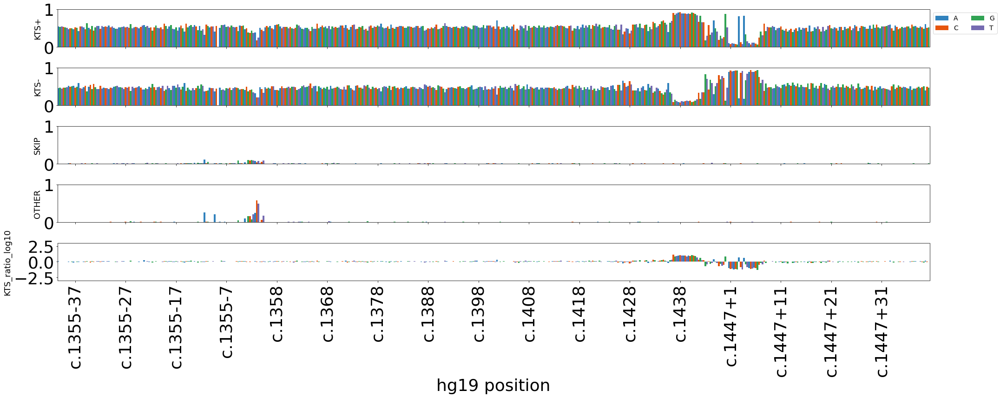

BB_RT_2_ODT_243_Cos1054


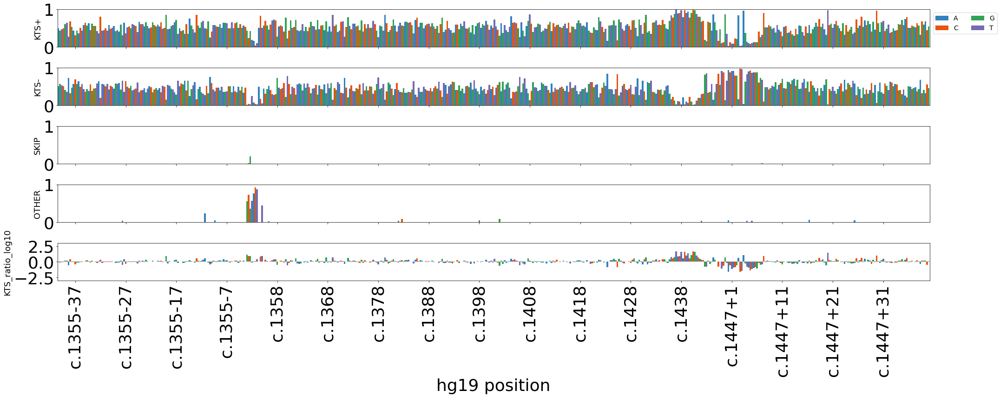

BB_RT_2_ODT_243_Hek1054


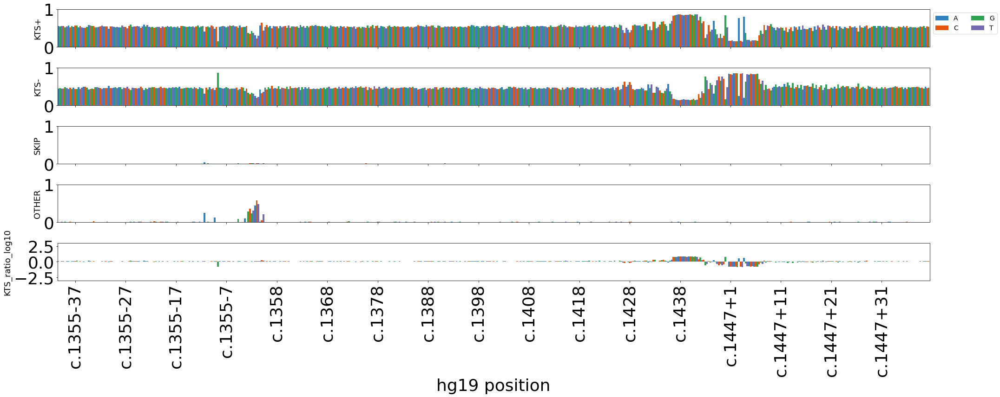

BB_RT_2_ODT_335_Hek1054


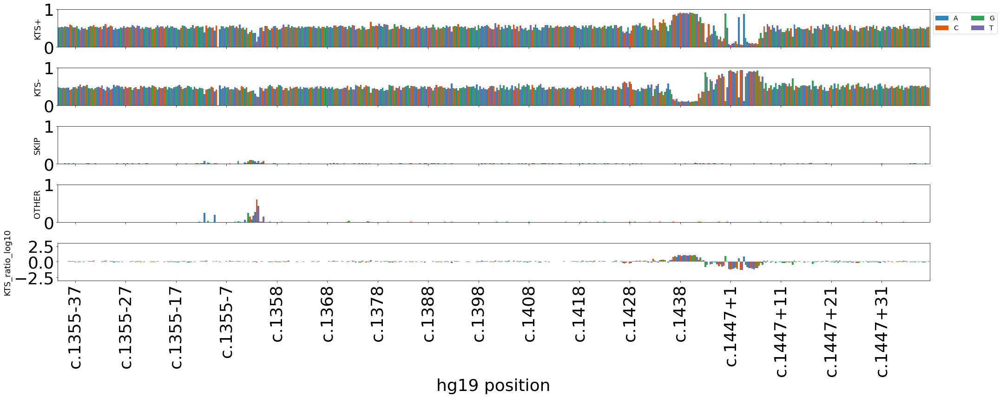

BB_RT_3_340_243_Cos1055


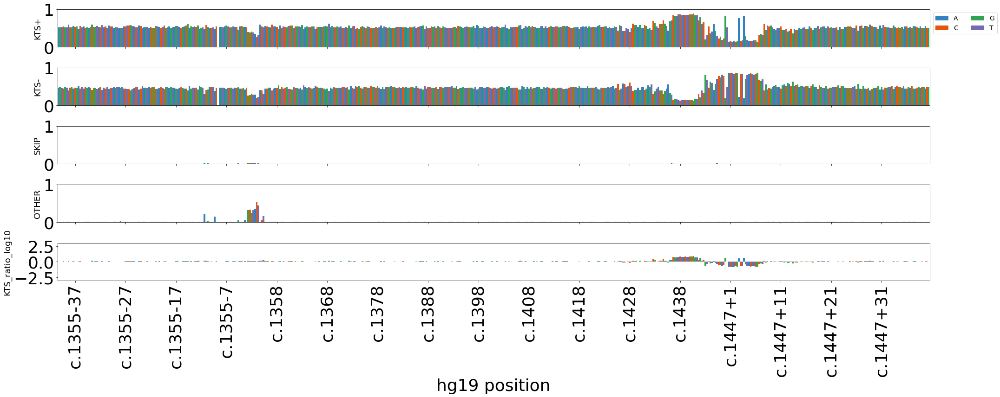

BB_RT_3_340_243_Hek1055


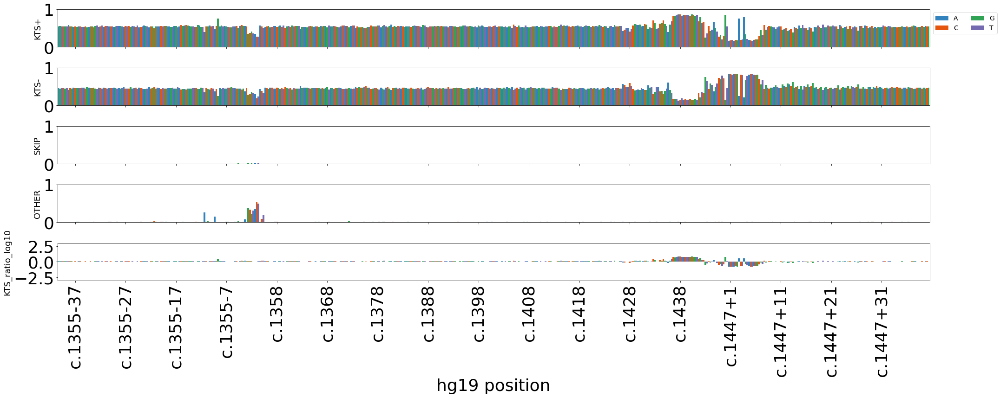

BB_RT_3_340_335_Cos1055


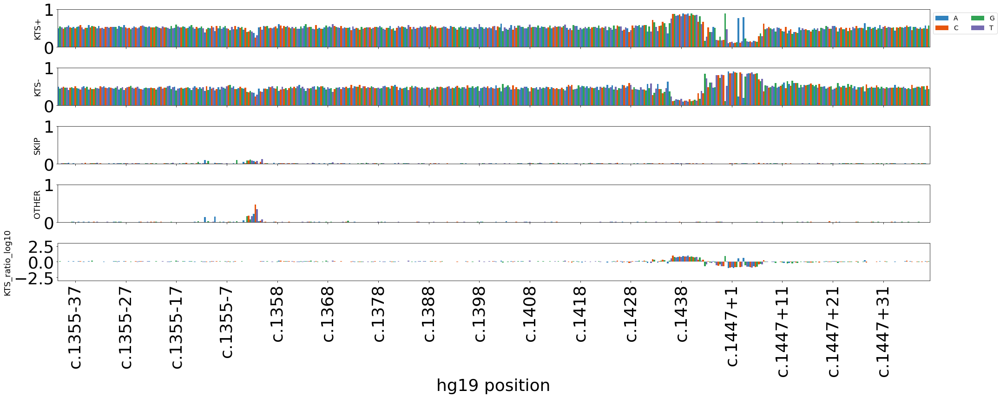

BB_RT_3_340_335_Hek1055


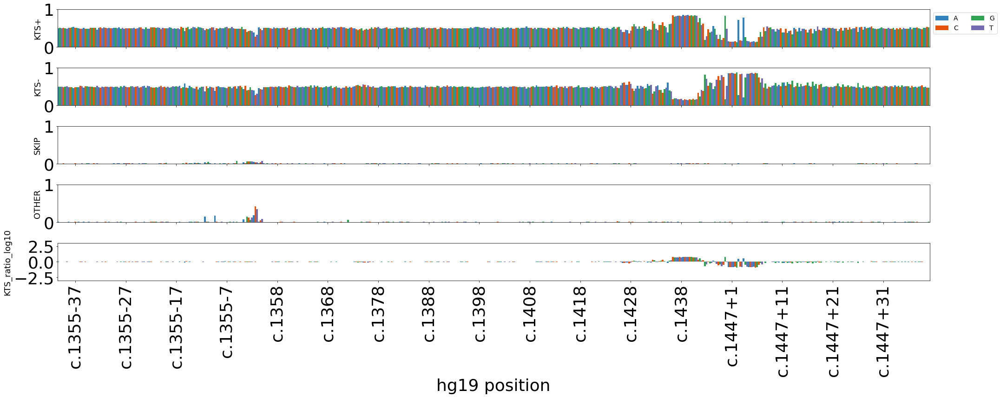

BB_RT_3_ODT_243_Cos1055


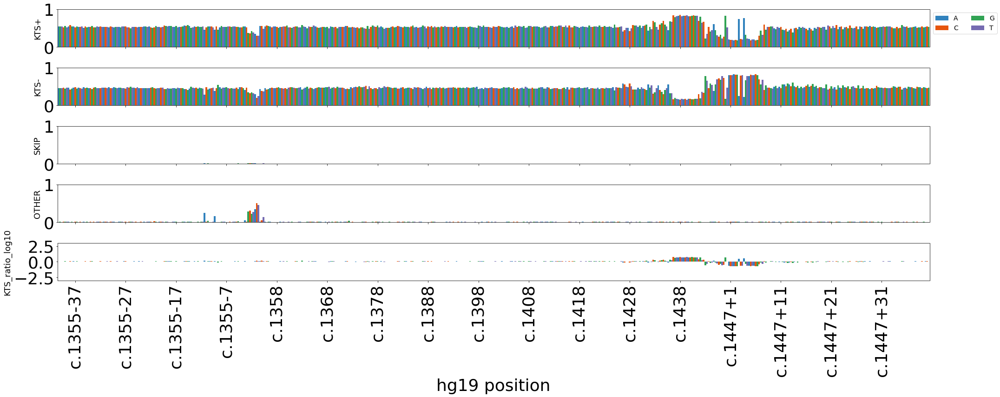

BB_RT_3_ODT_243_Hek1055


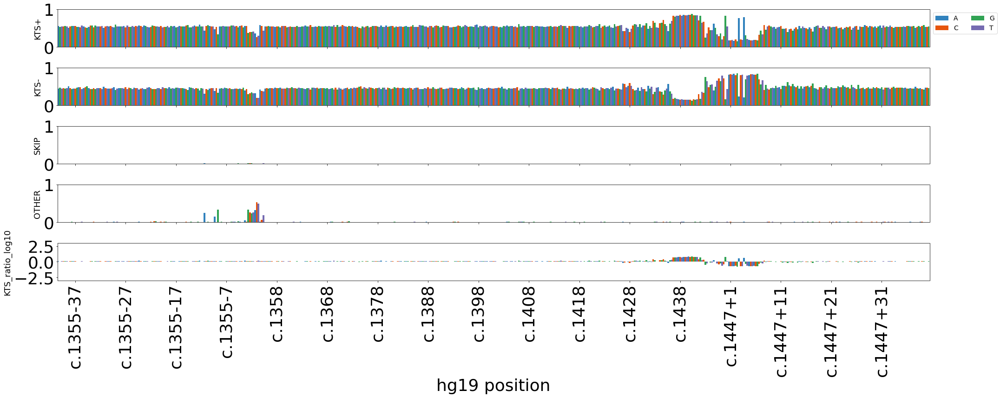

BB_RT_3_ODT_335_cos1055


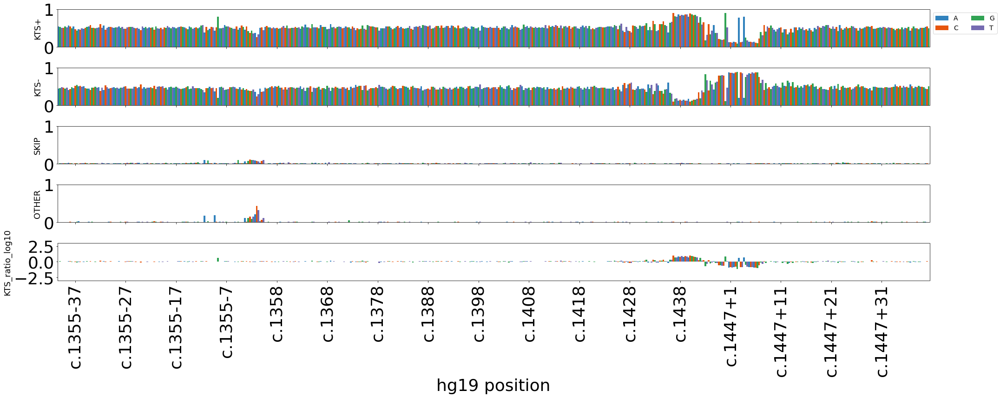

BB_RT_3_ODT_335_Hek1055


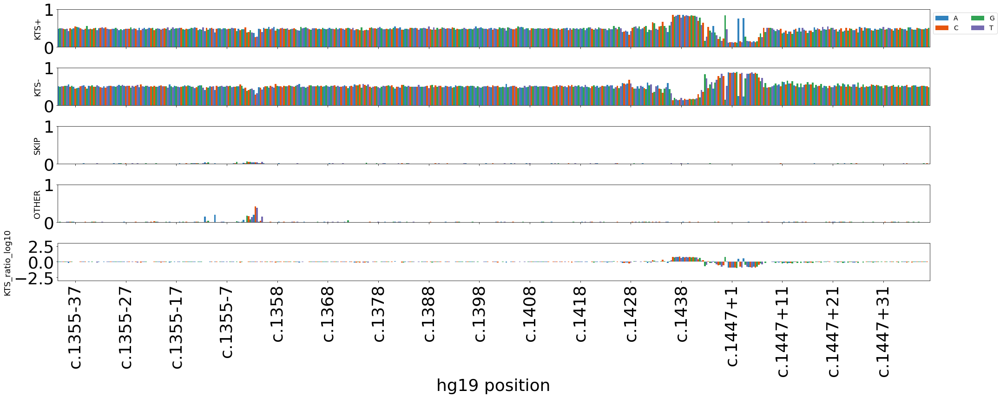

BB_RT_2_ODT_335_Cos1054


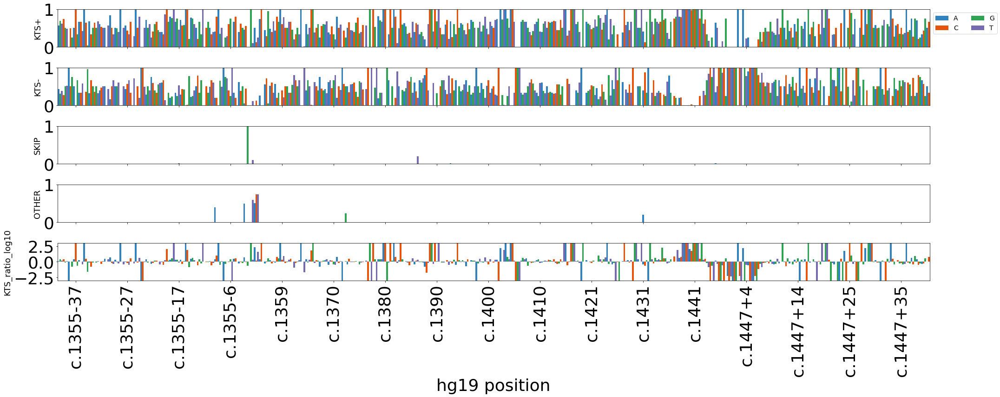

/home/smithcat/splfxseq/splanl/plots.py:2882: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  ax.set_xlim( ( -.5, len( tbv ) - .5 ) )
No handles with labels found to put in legend.


nan


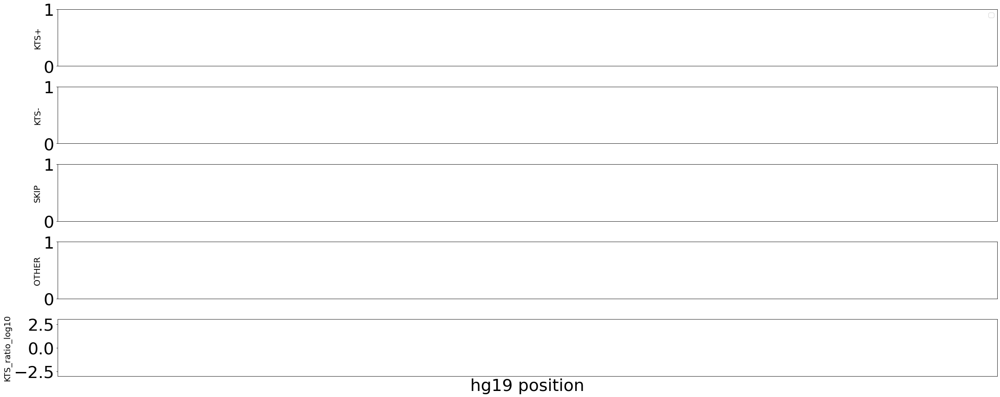

In [159]:
for samp in byvartbl_sat[ 'sample' ].unique():
    
    print( samp )

    sp.sat_subplots_wrapper( byvartbl_sat.loc[ ( byvartbl_sat.pos >= 1227 ) & ( byvartbl_sat[ 'sample' ] == samp ) ].rename( columns = { 'alt': 'a',
                                                                                                                                         'ref': 'r',
                                                                                                                                          'alt_c': 'alt',
                                                                                                                                         'ref_c': 'ref' } ),
                         [ col for col in byvartbl_sat if col.startswith( 'mean_' ) ] + [ 'KTS_+_ratio_log10' ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 12 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -3, 3 ) ],
                          y_ax_title = [ col[ 5: ] for col in byvartbl_sat if col.startswith( 'mean_' ) ] + [ 'KTS_ratio_log10' ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [53]:
byvartbl_wide = mbcs.combine_rep_pervartbls_wide( [ byvartbl_long.loc[ byvartbl_long[ 'sample' ] == samp ][ [ col for col in byvartbl_long if col != 'sample' and col != 'rep' ] ]
                                                    for samp in byvartbl_long[ 'sample' ].unique() ],
                                                  [ samp for samp in byvartbl_long[ 'sample' ].unique() ],
                                                  indexcols=[ 'chrom','pos','ref','ref_c','alt','alt_c','varlist','hg19_pos','hgvs_pos','exon_num' ], 
                                                  group_cols_by_samp = True )

In [54]:
byvartbl_wide = byvartbl_wide.loc[ byvartbl_wide.pos >= 1227 ].copy()

In [55]:
byvartbl_wide

,chrom,pos,ref,ref_c,alt,alt_c,varlist,hg19_pos,hgvs_pos,exon_num,...,BB_RT_2_ODT_335_Cos1054_per_usable_reads,BB_RT_2_ODT_335_Hek1054_per_usable_reads,BB_RT_3_340_243_Cos1055_per_usable_reads,BB_RT_3_340_243_Hek1055_per_usable_reads,BB_RT_3_340_335_Cos1055_per_usable_reads,BB_RT_3_340_335_Hek1055_per_usable_reads,BB_RT_3_ODT_243_Cos1055_per_usable_reads,BB_RT_3_ODT_243_Hek1055_per_usable_reads,BB_RT_3_ODT_335_cos1055_per_usable_reads,BB_RT_3_ODT_335_Hek1055_per_usable_reads
146,jkp815,1227,G,C,A,T,jkp815:1227:C:T,32413650,c.1355-40,9,...,100.0,99.968983,99.859944,99.696685,99.884859,99.811628,99.663807,99.648917,99.910754,99.881950
147,jkp815,1227,G,C,C,G,jkp815:1227:C:G,32413650,c.1355-40,9,...,100.0,99.899860,99.889401,99.747853,99.878197,99.757893,99.707371,99.677627,99.893768,99.836827
148,jkp815,1227,G,C,T,A,jkp815:1227:C:A,32413650,c.1355-40,9,...,100.0,99.900473,99.836601,99.748292,99.953693,99.869693,99.721216,99.853766,100.000000,99.882801
149,jkp815,1228,T,A,A,T,jkp815:1228:A:T,32413649,c.1355-39,9,...,100.0,99.959134,99.623068,99.677939,99.972004,99.867084,99.593350,99.793814,99.955092,99.948447
150,jkp815,1228,T,A,C,G,jkp815:1228:A:G,32413649,c.1355-39,9,...,100.0,99.942163,99.668325,99.787488,100.000000,99.908032,99.442684,99.745547,98.880895,99.918401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660,jkp815,1398,A,T,G,C,jkp815:1398:T:C,32413479,c.1447+39,9,...,100.0,100.000000,100.000000,99.658412,100.000000,100.000000,99.530831,99.671593,99.817685,100.000000
661,jkp815,1398,A,T,T,A,jkp815:1398:T:A,32413479,c.1447+39,9,...,100.0,100.000000,100.000000,99.635535,100.000000,99.778271,99.778271,99.876084,100.000000,99.855596
662,jkp815,1399,A,T,C,G,jkp815:1399:T:G,32413478,c.1447+40,9,...,100.0,100.000000,100.000000,99.564902,100.000000,100.000000,99.772856,99.400000,100.000000,98.929050
663,jkp815,1399,A,T,G,C,jkp815:1399:T:C,32413478,c.1447+40,9,...,100.0,100.000000,98.461538,99.558986,100.000000,100.000000,99.628253,99.421129,100.000000,100.000000


In [58]:
( 1399-1227 + 1 )*3

519

In [163]:
def create_variables_across_samples( wide_tbl,
                                     lsampnames,
                                     median_cols = [],
                                     mean_cols = [],
                                     sum_cols = [],
                                     max_cols = [] ):
    
    #NOW ADDED TO MBCS!!!!

    wide = wide_tbl.copy()

    if median_cols:

        for col in median_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_med' ] = wide[ samp_cols ].median( axis = 1 )

    if mean_cols:

        for col in mean_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_mean' ] = wide[ samp_cols ].mean( axis = 1 )

    if sum_cols:

        for col in sum_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_sum' ] = wide[ samp_cols ].sum( axis = 1 )

    if max_cols:

        for col in max_cols:

            samp_cols = [ '_'.join( [ samp, col ] ) for samp in lsampnames ]

            wide[ col + '_max' ] = wide[ samp_cols ].max( axis = 1 )

    return wide

In [164]:
byvartbl_wide = create_variables_across_samples( byvartbl_wide,
                                                 [ samp for samp in byvartbl_long[ 'sample' ].unique() ],
                                                 mean_cols = [ 'n_bc','n_bc_passfilt', 'sum_reads','sum_reads_passfilt', ],
                                                 median_cols = [ 'n_bc','n_bc_passfilt', 'sum_reads','sum_reads_passfilt', ],
                                                 sum_cols = [ 'sum_reads','sum_reads_passfilt', ],
                                                 max_cols = [ 'n_bc','n_bc_passfilt', 'sum_reads','sum_reads_passfilt', ] )

In [165]:
def compute_bc_weighted_psi( wide_tbl,
                             lsampnames,
                             isonames,
                             bccount,
                              ):
    
    #NOW ADDED TO MBCS!!!!

    wide = wide_tbl.copy()

    samp_bc_cols = [ '_'.join( [ samp, bccount ] ) for samp in lsampnames ]

    for col in isonames:
        
        #we tend to use the wmean more often so this is intentionally a mean of the wmeans
        wide[ 'mean_' + col ] = wide[ [ '_'.join( [ samp, 'wmean', col ] ) for samp in lsampnames ] ].mean( axis = 1 )
        
        wide[ 'wmean_' + col ] = pd.DataFrame( ( wide[ '_'.join( [ samp, 'wmean', col ] ) ] * wide[ '_'.join( [ samp, bccount ] ) ] 
                                                   for samp in lsampnames ) ).T.sum( axis = 1) \
                                             / wide[ samp_bc_cols ].sum( axis = 1 )

    return wide

In [166]:
byvartbl_wide = compute_bc_weighted_psi( byvartbl_wide,
                                         [ samp for samp in byvartbl_long[ 'sample' ].unique() ],
                                         [ 'KTS+','KTS-','SKIP','OTHER' ],
                                         'n_bc_passfilt',
                              )

In [167]:
byvartbl_wide[ 'KTS_+_ratio' ] = byvartbl_wide[ 'wmean_KTS+' ] / byvartbl_wide[ 'wmean_KTS-' ]

In [168]:
byvartbl_wide[ 'KTS_+_ratio' ].min()

0.13954635584191735

In [169]:
byvartbl_wide[ 'KTS_+_ratio' ].max()

6.998849391695265

In [170]:
byvartbl_wide[ 'KTS_+_ratio_log10' ] = np.log10( byvartbl_wide[ 'KTS_+_ratio' ] )

In [171]:
byvartbl_wide[ 'KTS_+_ratio_log10' ].min()

-0.855281500332004

In [172]:
byvartbl_wide[ 'KTS_+_ratio_log10' ].max()

0.8450266480269982

In [173]:
byvartbl_wide_sat = pp.saturate_variants( byvartbl_wide,
                                         chr11_seq,
                                         'hg19_pos',
                                          'exon_num',
                                          rev_strand = True )[ 9 ]

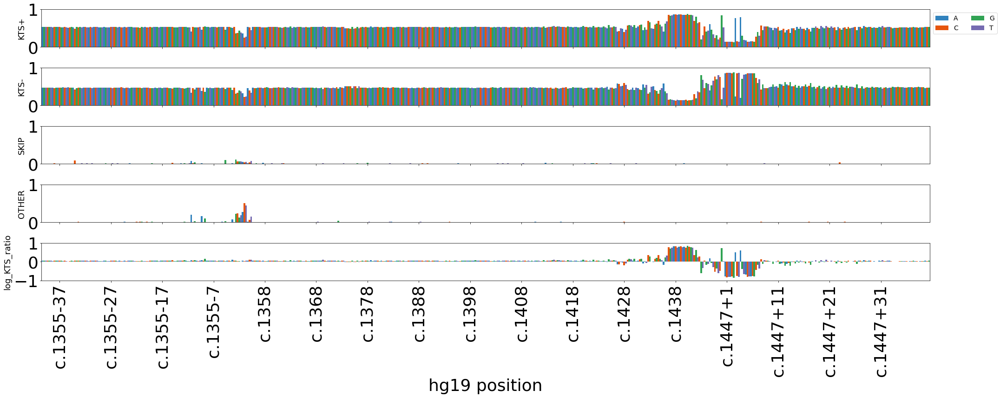

In [174]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                         [ col for col in byvartbl_wide_sat if col.startswith( 'wmean_' ) ] + [ 'KTS_+_ratio_log10' ],
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 12 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -1, 1 ) ],
                          y_ax_title = [ col[ 5: ] for col in byvartbl_wide_sat if col.startswith( 'mean_' ) ] + [ 'log_KTS_ratio' ], 
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

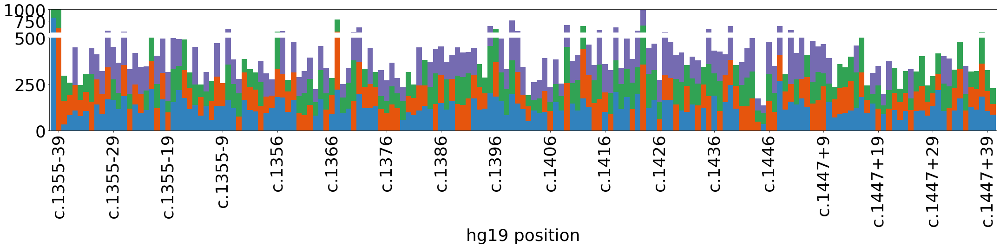

In [175]:
sp.split_ax_bcs(  byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                  [ 'n_bc_passfilt_mean' ],
                  'hgvs_pos',
                    [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                    [ ( 500.5, 1000 ), ( 0, 500 ) ],
                    fig_size = ( 30, 7.5 ),
                    legend = False,
                    hratios = [ 1, 4 ],
                    x_ax_title = 'hg19 position',
                    #tight = False,
                    #savefile = plot_out + 'bcs_filt_by_pos_split.pdf'
                           )

In [176]:
#this was computed in jkp1053_byiso.2022-0428
splai = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/splai_output/wt1_ex9.txt',
                       dtype = { 'chrom': object } )

In [177]:
byvartbl_wide[ 'chrom' ] = '11'

In [178]:
byvartbl_wide = sm.merge_splai( byvartbl_wide,
                                splai )

In [179]:
#this was computed in jkp1053_byiso.2022-0428
splai_wt = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/splai_output/wt1_ex9_wt_ss_probs.txt',
                       dtype = { 'chrom': object } ).rename( columns = { 'wt_acc_pr': 'splai_wt_acc', 'wt_don_pr': 'splai_wt_don', 'pos': 'hg19_pos' } )

In [180]:
byvartbl_wide = byvartbl_wide.set_index( [ 'hg19_pos', 'ref', 'chrom' ] ).merge( splai_wt.set_index( [ 'hg19_pos', 'ref', 'chrom' ] ),
                                                                        how = 'left', 
                                                                        left_index = True,
                                                                        right_index = True ).reset_index()

In [181]:
#this was computed in jkp1053_byiso.2022-0428
splai_ss_pr = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/splai_output/wt1_ex9_ss_probs.txt',
                             dtype = { 'chrom': object } )

In [182]:
byvartbl_wide = sm.merge_splai( byvartbl_wide,
                                splai_ss_pr )

In [183]:
maxent_wt = pd.read_table( '/nfs/kitzman2/smithcat/proj/spliceAI/maxent_scores/wt1_ex9_wt_ss_probs.txt' ).rename( columns = { 'wt_acc_pr': 'maxent_wt_acc', 'wt_don_pr': 'maxent_wt_don' } )

In [184]:
byvartbl_wide = byvartbl_wide.set_index( [ 'pos', 'ref' ] ).merge( maxent_wt.set_index( [ 'pos', 'ref' ] ),
                                                                   how = 'left',
                                                                   left_index = True,
                                                                   right_index = True ).reset_index()

In [185]:
def maxent_score_donors( refseq,
                         tbl_by_var,
                         pos_col,
                         ref_col,
                         alt_col,
                         donor_pos_l,
                         rev_strand = False ):
    
    #NOW in score_motifs!
    
    tbv = tbl_by_var.copy()
    
    if not rev_strand:
        
        m_pos = { pos: ( pos - 1 - 2, pos - 1 + 7 ) for pos in donor_pos_l }
        
    else:
        
        m_pos = { pos: ( pos - 1 - 6, pos - 1 + 3 ) for pos in donor_pos_l }
    
    maxent_scores = { pos: [] for pos in donor_pos_l }
    
    for dpos in donor_pos_l:
    
        for p,ra in zip( tbv[ pos_col ], zip( tbv[ ref_col ], tbv[ alt_col ] ) ): 
                
            p = p - 1
            ref,alt = ra
            
            if p < m_pos[ dpos ][ 0 ] or p >= m_pos[ dpos ][ 1 ]:
                    
                maxent_scores[ dpos ].append( np.nan )
                    
            else:
                
                if not rev_strand:
                    
                    assert ref.upper() == refseq[ p ].upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )  
                    maxent_scores[ dpos ].append( maxent.score5( refseq[ m_pos[ dpos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ dpos ][ 1 ] ] ) )
                    
                else:
                    
                    assert ref.upper() == css.rev_complement( refseq[ p ] ).upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )
                    maxent_scores[ dpos ].append( maxent.score5( css.rev_complement( refseq[ m_pos[ dpos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ dpos ][ 1 ] ] ) ) )
                    
    return maxent_scores

In [186]:
donor_d = maxent_score_donors( refseq,
                                byvartbl_wide,
                                'pos',
                                'ref_c',
                                'alt_c',
                                [ 1350, 1359 ],
                               )

In [187]:
byvartbl_wide[ 'maxent_KTS+' ] = donor_d[ 1359 ]

In [188]:
byvartbl_wide[ 'maxent_KTS-' ] = donor_d[ 1350 ]

In [189]:
def maxent_score_acceptors( refseq,
                            tbl_by_var,
                            pos_col,
                            ref_col,
                            alt_col,
                            acceptor_pos_l,
                            rev_strand = False ):
    
    #NOW in score_motifs!
    
    tbv = tbl_by_var.copy()
    
    if not rev_strand:
        
        m_pos = { pos: ( pos - 1 - 20, pos - 1 + 3 ) for pos in acceptor_pos_l }
        
    else:
        
        m_pos = { pos: ( pos - 1 - 2, pos - 1 + 21 ) for pos in acceptor_pos_l }
    
    maxent_scores = { pos: [] for pos in acceptor_pos_l }
    
    for apos in acceptor_pos_l:
    
        for p,ra in zip( tbv[ pos_col ], zip( tbv[ ref_col ], tbv[ alt_col ] ) ): 
                
            p = p - 1
            ref,alt = ra
            
            if p < m_pos[ apos ][ 0 ] or p >= m_pos[ apos ][ 1 ]:
                    
                maxent_scores[ apos ].append( np.nan )
                    
            else:
                
                if not rev_strand:
                    
                    assert ref.upper() == refseq[ p ].upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )  
                    maxent_scores[ apos ].append( maxent.score3( refseq[ m_pos[ apos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ apos ][ 1 ] ] ) )
                    
                else:
                    
                    assert ref.upper() == css.rev_complement( refseq[ p ] ).upper(), 'Refseq does not match for %i:%s>%s' % ( p + 1, ref, alt )
                    maxent_scores[ apos ].append( maxent.score3( css.rev_complement( refseq[ m_pos[ apos ][ 0 ]: p ] + alt + refseq[ p + 1: m_pos[ apos ][ 1 ] ] ) ) )
                    
    return maxent_scores

In [190]:
accept_d = maxent_score_acceptors( refseq,
                                    byvartbl_wide,
                                    'pos',
                                    'ref_c',
                                    'alt_c',
                                    [ 1267, 1284 ],
                                   )

In [191]:
byvartbl_wide[ 'maxent_acc' ] = accept_d[ 1267 ]

In [192]:
byvartbl_wide[ 'maxent_alt_acc' ] = accept_d[ 1284 ]

In [193]:
byvartbl_wide[ 'splai_KTS+_ratio' ] = byvartbl_wide[ 'ss_don_prob_32413518' ] / byvartbl_wide[ 'ss_don_prob_32413527' ]

In [194]:
byvartbl_wide[ 'splai_KTS+_ratio' ].min()

2.1226874089724788e-05

In [195]:
byvartbl_wide[ 'splai_KTS+_ratio' ].max()

170232.52949963024

In [196]:
byvartbl_wide[ 'splai_KTS+_ratio_log10' ] = np.log10( byvartbl_wide[ 'splai_KTS+_ratio' ] )

In [197]:
byvartbl_wide[ 'splai_KTS+_ratio_log10' ].min()

-4.673113956165485

In [198]:
byvartbl_wide[ 'splai_KTS+_ratio_log10' ].max()

5.2310425524131485

In [199]:
byvartbl_wide_sat = pp.saturate_variants( byvartbl_wide,
                                         chr11_seq,
                                         'hg19_pos',
                                          'exon_num',
                                          rev_strand = True )[ 9 ]

In [200]:
plot_cols = [ col for col in byvartbl_wide if col.startswith( 'wmean_' ) or col.startswith( 'maxent_' )  ] + [ 'DS_maxm', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'ss_acc_prob_32413610', 'ss_acc_prob_32413593' ]

In [201]:
plot_cols = [ 'wmean_KTS+', 'wmean_KTS-', 'wmean_SKIP', 'wmean_OTHER', 'KTS_+_ratio_log10', 'maxent_KTS+', 'maxent_KTS-',
              'maxent_acc', 'maxent_alt_acc',  'DS_maxm', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'ss_acc_prob_32413610',
              'ss_acc_prob_32413593', 'splai_KTS+_ratio_log10' ]

In [202]:
plot_cols

['wmean_KTS+',
 'wmean_KTS-',
 'wmean_SKIP',
 'wmean_OTHER',
 'KTS_+_ratio_log10',
 'maxent_KTS+',
 'maxent_KTS-',
 'maxent_acc',
 'maxent_alt_acc',
 'DS_maxm',
 'ss_don_prob_32413518',
 'ss_don_prob_32413527',
 'ss_acc_prob_32413610',
 'ss_acc_prob_32413593',
 'splai_KTS+_ratio_log10']

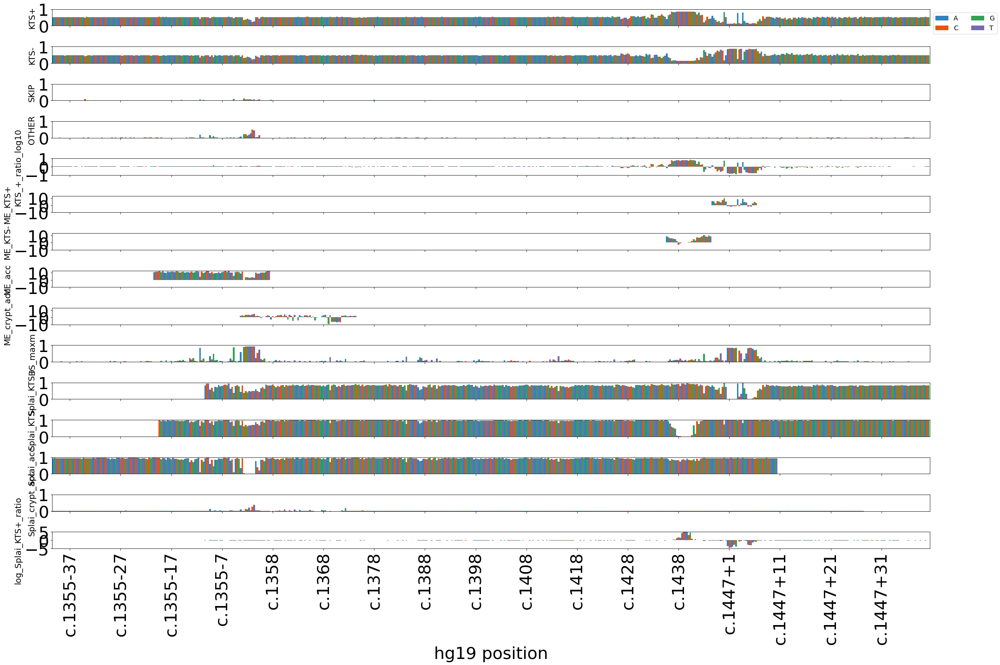

In [203]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ), ( -10, 13 ), ( -10, 13 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','SKIP','OTHER', 'KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','ME_acc','ME_crypt_acc','DS_maxm','Splai_KTS+','Splai_KTS-','Splai_acc', 'Splai_crypt_acc', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [204]:
plot_KTS_cols = [ 'wmean_KTS+', 'wmean_KTS-', 'KTS_+_ratio_log10', 'maxent_KTS+', 'maxent_KTS-', 
                  'DS_maxm', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'splai_KTS+_ratio_log10' ]

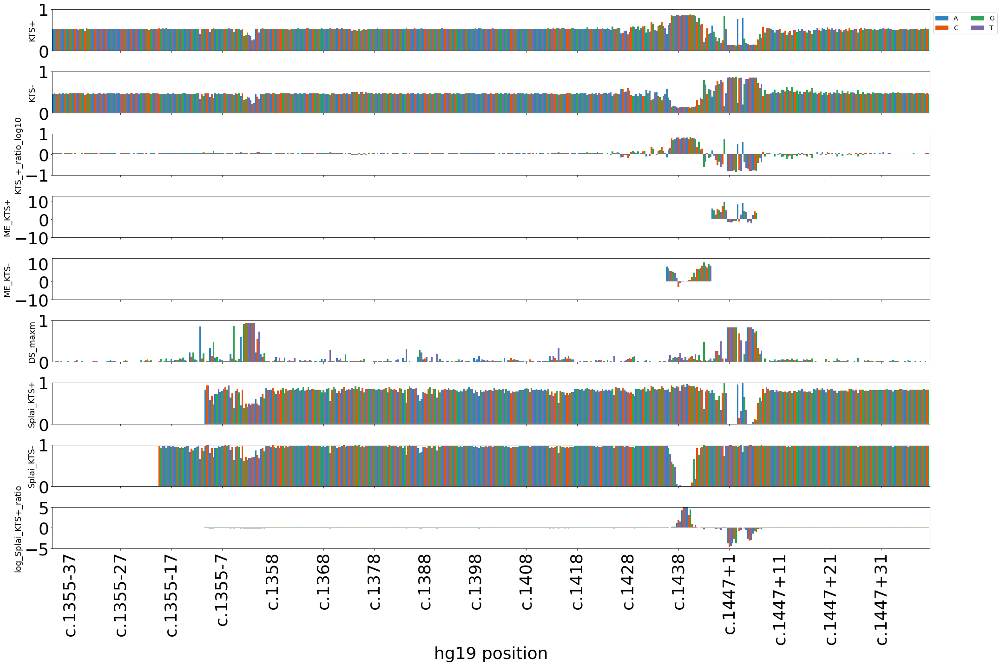

In [205]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_KTS_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ),  ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','DS_maxm','Splai_KTS+','Splai_KTS-', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 10,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [206]:
plot_acc_cols = [ 'wmean_KTS+', 'wmean_KTS-', 'wmean_SKIP', 'wmean_OTHER', 'KTS_+_ratio_log10', 
              'maxent_acc', 'maxent_alt_acc',  'DS_maxm','ss_acc_prob_32413610',
              'ss_acc_prob_32413593', 'splai_KTS+_ratio_log10' ]

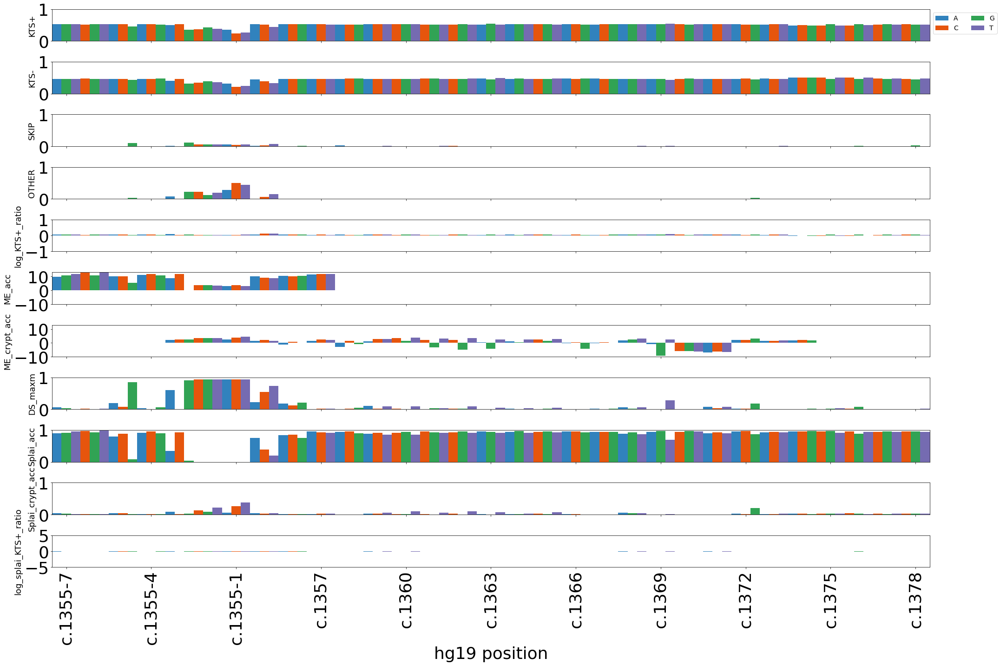

In [207]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_acc_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          zoom = ( 1260, 1290 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ), ( 0, 1 ), ( 0, 1 ), ( 0, 1 ),( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','SKIP','OTHER','log_KTS+_ratio','ME_acc','ME_crypt_acc','DS_maxm','Splai_acc', 'Splai_crypt_acc', 'log_splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 3,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [208]:
byvartbl_long.loc[ ( ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ) & ( byvartbl_long[ 'wmean_KTS+' ] > .6 ) ][ [ 'pos', 'ref', 'alt', 'sample', 'n_bc_passfilt', 'wmean_KTS+' ] ]

,pos,ref,alt,sample,n_bc_passfilt,wmean_KTS+
714,1265,T,A,BB_test_Cos1053_JKLab0340_MM2B,5,0.610067
3607,1265,T,C,BB_RT_1_340_335_Cos1053,14,0.655000
9601,1265,T,C,BB_RT_2_340_243_Cos1054,5,0.613003
10744,1265,T,C,BB_RT_2_340_335_Cos1054,2,0.669014
13030,1265,T,C,BB_RT_2_ODT_335_Cos1054,1,1.000000


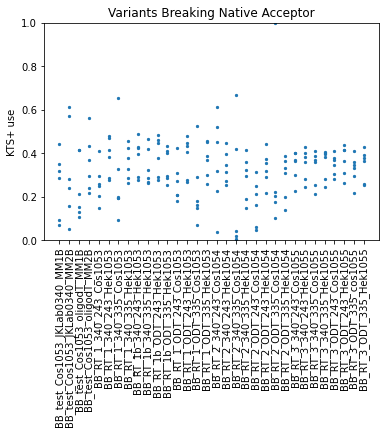

In [209]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'wmean_KTS+' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS+ use')

plt.title( 'Variants Breaking Native Acceptor')

plt.show()

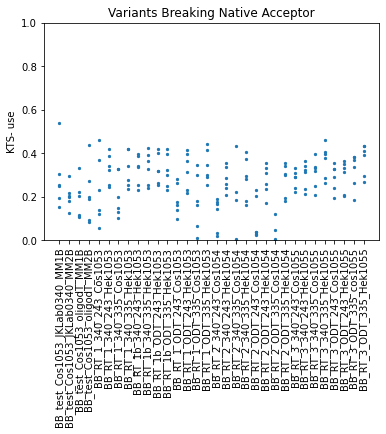

In [210]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1265 ) | ( byvartbl_long.pos == 1266 ) ][ 'wmean_KTS-' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS- use')

plt.title( 'Variants Breaking Native Acceptor')

plt.show()

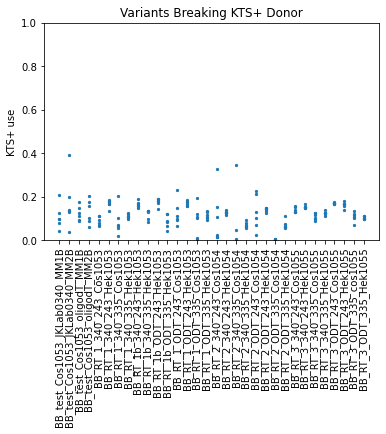

In [211]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1360 ) | ( byvartbl_long.pos == 1361 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1360 ) | ( byvartbl_long.pos == 1361 ) ][ 'wmean_KTS+' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS+ use')

plt.title( 'Variants Breaking KTS+ Donor')

plt.show()

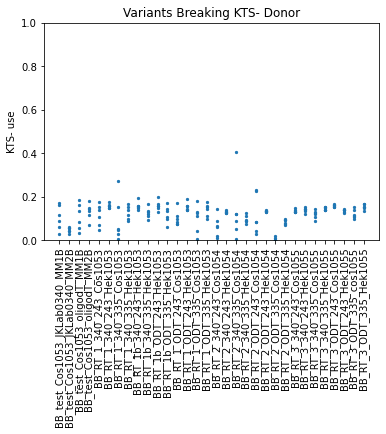

In [212]:
plt.scatter( byvartbl_long.loc[ ( byvartbl_long.pos == 1351 ) | ( byvartbl_long.pos == 1352 ) ][ 'sample' ],
             byvartbl_long.loc[ ( byvartbl_long.pos == 1351 ) | ( byvartbl_long.pos == 1352 ) ][ 'wmean_KTS-' ],
             s = 5 )

plt.xticks( rotation = 90 )

plt.ylim( ( 0, 1 ) )
plt.ylabel( 'KTS- use')

plt.title( 'Variants Breaking KTS- Donor')

plt.show()

In [213]:
coll_bc_samps2 = [ ( 'jkp815:1266:G:T', 'BB_RT_1_340_243_Hek1053' ),
                  ( 'jkp815:1265:A:C', 'BB_RT_1_ODT_243_Hek1053' ),
                  ( 'jkp815:1265:A:G', 'BB_RT_1_340_335_Cos1053' ),
                  ]

In [214]:
view_bc_fn2 = { lib: { samp: [] for var,samp in coll_bc_samps2 if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

In [215]:
view_bc_fn2

{'JKP1053': {'BB_RT_1_340_243_Hek1053': [],
  'BB_RT_1_ODT_243_Hek1053': [],
  'BB_RT_1_340_335_Cos1053': []},
 'JKP1054': {},
 'JKP1055': {}}

In [216]:
bybc_tbl_fn[ 'JKP1053' ]

,barcode,sample,passes,status,n_variants_passing,variant_list,num_reads,secondary_reads,unpaired_reads,unmapped_reads,...,other_isoform,usable_reads,KTS+,KTS-,SKIP,OTHER,KTS+_psi,KTS-_psi,SKIP_psi,OTHER_psi
14,AAAAATACTTTGATGCGGGATGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1236:G:C,214,0,0,0,...,0,214,205,6,0,3,0.957944,0.028037,0.0,0.014019
32,AAAACGCCTGTCTACCATAATGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1381:T:A,69,0,0,0,...,0,68,65,3,0,0,0.955882,0.044118,0.0,0.000000
44,AAAAGCGCAGTATTGGTCACTGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1312:G:A,131,0,0,0,...,0,131,1,130,0,0,0.007634,0.992366,0.0,0.000000
49,AAAAGGTGTTGGGCAGTTGATGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1267:GTG:GG,39,0,0,0,...,0,39,7,3,0,29,0.179487,0.076923,0.0,0.743590
56,AAAAGTATAAACGGGTTTGTTGG,BB_test_Cos1053_JKLab0340_MM1B,True,pass,1,jkp815:1305:T:G,60,0,0,0,...,1,60,54,5,0,0,0.900000,0.083333,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2930887,TTTTTTTTCTGCGTACAACGTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1328:G:A,6,0,0,0,...,0,6,3,3,0,0,0.500000,0.500000,0.0,0.000000
2930891,TTTTTTTTGATTTGCGGTCGTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1301:A:T,2,0,0,0,...,0,2,2,0,0,0,1.000000,0.000000,0.0,0.000000
2930892,TTTTTTTTGCGACTGGAACTTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1380:A:C,2,0,0,0,...,0,2,2,0,0,0,1.000000,0.000000,0.0,0.000000
2930897,TTTTTTTTGTTCATACTTGTTTGG,BB_RT_1_ODT_335_Hek1053,True,pass,1,jkp815:1228:A:G,3,0,0,0,...,0,3,3,0,0,0,1.000000,0.000000,0.0,0.000000


In [217]:
satbl_fn[ 'JKP1053' ]

,passes,status,n_variants_passing,variant_list
readgroupid,,,,
AAAAAAAATCACGACCCTCCTGG,False,possible_chimeric_no_major_variant,6,"jkp815:1225:CACAT:CC,jkp815:1231:GTTAG:GTAG,jk..."
AAAAAAAGGGCTTCCGGGTATGG,True,no_variants_input,0,NaN
AAAAAAAGGGTTCCAGACTGTGG,False,toomanymajorvar,2,"jkp815:1252:T:G,jkp815:1279:TCCAGTGTAAAACTTGTC..."
AAAAAAAGTAGTCTGGTGTGTGG,True,pass,1,jkp815:1387:T:C
AAAAAAATACCCCGGATGATTGG,False,possible_chimeric_no_major_variant,1,jkp815:1392:T:A
...,...,...,...,...
TTTTTTTTTTATAGTCCTACTGG,False,possible_chimeric_no_major_variant,3,"jkp815:1227:C:G,jkp815:1228:A:T,jkp815:1374:C:T"
TTTTTTTTTTGGTTGGCGTTTGG,False,possible_chimeric_no_major_variant,1,jkp815:1285:G:T
TTTTTTTTTTGTACTTTTCTGG,False,possible_chimeric_no_major_variant,1,jkp815:1397:T:G


In [218]:
for lib in view_bc_fn2:
    
    for samp in view_bc_fn2[ lib ]:
        
        if len( view_bc_fn2[ lib ][ samp ] ) > 1:
            
            view_bc_fn2[ lib ][ samp ] = pd.concat( view_bc_fn2[ lib ][ samp ] )
            view_bc_fn2[ lib ][ samp ] = view_bc_fn2[ lib ][ samp ].rename( columns = { 'barcode': 'readgroupid' } )
            
        else:
            
            view_bc_fn2[ lib ][ samp ] = view_bc_fn2[ lib ][ samp ][ 0 ].rename( columns = { 'barcode': 'readgroupid' } )            
       

IndexError: list index out of range

In [ ]:
view_bc_fn2

In [ ]:
! mkdir /nfs/kitzman2/smithcat/proj/wt1_2022/20220512_accept_vars/

In [ ]:
bc_out2 = '/nfs/kitzman2/smithcat/proj/wt1_2022/20220512_accept_vars/' 

In [ ]:
for lib in view_bc_fn2:
    
    for samp in view_bc_fn2[ lib ]:
    
        view_bc_fn2[ lib ][ samp ].to_csv( bc_out2 + '%s_%s_acceptor_vars.txt' % ( lib, samp ),
                                          sep = '\t',
                                          index = False )

In [ ]:
view_bc_fn2 = { lib: { samp: [] for var,samp in coll_bc_samps2 if lib.replace( 'JKP', '' ) in samp }
               for lib in bybc_tbl_fn }

for lib in bybc_tbl_fn:
    
    for var,samp in coll_bc_samps2:
        
        if lib.replace( 'JKP', '' ) not in samp:
            continue
        
        print( var,samp )
        
        if len( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ] ) == 0:
                
                print( 'No rows selected!' )
            
        view_bc_fn2[ lib ][ samp ].append( bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].variant_list == var ) ].copy() ) 

In [ ]:
read_count_files = ! ls /nfs/turbo/umms-kitzmanj/oldvol2/jacob/proj/jensplice/20220426_wt1_subasm_filter_stringent/sapipe/sa/*.per_group_raw_counts.txt

In [ ]:
read_count_fn = { file.split( '/' )[ -1 ].split( '.' )[ 0 ]: pd.read_table( file ).set_index( 'readgroupid' )
                  for file in read_count_files }

In [ ]:
for lib in bybc_tbl_fn:
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].loc[ bybc_tbl_fn[ lib ].n_variants_passing == 1 ].copy()
    
    bybc_tbl_fn[ lib ][ 'pos' ] = bybc_tbl_fn[ lib ].variant_list.apply( lambda x: int( x.split( ':' )[ 1 ] ) )
    bybc_tbl_fn[ lib ][ 'ref' ] = bybc_tbl_fn[ lib ].variant_list.apply( lambda x: x.split( ':' )[ 2 ] )
    bybc_tbl_fn[ lib ][ 'alt' ] = bybc_tbl_fn[ lib ].variant_list.apply( lambda x: x.split( ':' )[ 3 ] )
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].rename( columns = { 'barcode': 'readgroupid' } ).set_index( 'readgroupid' )
    
    bybc_tbl_fn[ lib ] = bybc_tbl_fn[ lib ].merge( read_count_fn[ lib ],
                                                   how = 'left',
                                                   left_index = True,
                                                   right_index = True )

In [ ]:
for lib in bybc_tbl_fn:
    
    print( lib )
    
    samps = bybc_tbl_fn[ lib ][ 'sample' ].unique()
    
    fig,ax = plt.subplots( 6, 
                           len( samps ),
                           sharex = True, 
                           sharey = True,
                           figsize = ( 60, 30 ) )
    
    for idx,samp in enumerate( samps ):
        
        var = 0
        
        for pos in [ 1265, 1266 ]:
            
            for alt in [ 'A', 'C', 'G', 'T' ]:
                
                plotdf = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'sample' ] == samp ) & ( bybc_tbl_fn[ lib ].pos == pos ) & ( bybc_tbl_fn[ lib ].alt == alt ) ].copy()
                
                if len( plotdf ) == 0:
                    continue
                    
                ax[ var ][ idx ].scatter( plotdf[ 'KTS+_psi' ],
                                          plotdf[ 'total_reads' ],
                                          s = 10 )
                
                ax[ var ][ idx ].set_xlim( ( -0.05, 1.05 ) )
                
                if idx == 0:
                    
                    ax[ var ][ idx ].set_ylabel( str( pos ) + ':' + alt )
                
                var += 1
                
        ax[ 0 ][ idx ].set_title( samp )
        
    plt.show()

In [ ]:
for lib in bybc_tbl_fn:
    
    print( lib )
    
    nomiss = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'KTS+_psi' ].notnull() ) & ( bybc_tbl_fn[ lib ][ 'total_reads' ].notnull() ) ].copy()
    
    nomiss = bybc_tbl_fn[ lib ].loc[ ( bybc_tbl_fn[ lib ][ 'KTS+_psi' ] <= 1 ) & ( bybc_tbl_fn[ lib ][ 'KTS+_psi' ] >= 0 ) ].copy()
    
    #print( nomiss.loc[ nomiss[ 'KTS+_psi' ] > 1 ] )
    
    print( ss.pearsonr( nomiss[ 'KTS+_psi' ],
                        nomiss[ 'total_reads' ] ) )
    
    print( ss.spearmanr( nomiss[ 'KTS+_psi' ],
                        nomiss[ 'total_reads' ] ) )

In [ ]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_KTS_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          zoom = ( 1340, 1370 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ),  ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','DS_maxm','Splai_KTS+','Splai_KTS-', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 3,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1357 ) & ( byvartbl_wide.pos <= 1365 ) ][ 'wmean_KTS+' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1357 ) & ( byvartbl_wide.pos <= 1365 ) ][ 'maxent_KTS+' ],
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'MaxEnt KTS+' )
plt.xlabel( 'Measured PSI KTS+' )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1348 ) & ( byvartbl_wide.pos <= 1356 ) ][ 'wmean_KTS-' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1348 ) & ( byvartbl_wide.pos <= 1356 ) ][ 'maxent_KTS-' ],
              )

plt.ylabel( 'MaxEnt KTS-' )
plt.xlabel( 'Measured PSI KTS-' )

plt.xlim( ( 0, 1 ) )
plt.show()

In [ ]:
maxent_wt

In [ ]:
byvartbl_wide.loc[ byvartbl_wide.pos == 1350 ]

In [ ]:
byvartbl_wide[ 'maxent_KTS+_nomiss' ] = [ me if not np.isnan( me ) else float( maxent_wt.loc[ maxent_wt.pos == 32413518 ].	maxent_wt_don )
                                          for me in byvartbl_wide[ 'maxent_KTS+' ] ]

In [ ]:
byvartbl_wide[ 'maxent_KTS-_nomiss' ] = [ me if not np.isnan( me ) else float( maxent_wt.loc[ maxent_wt.pos == 32413527 ].	maxent_wt_don )
                                          for me in byvartbl_wide[ 'maxent_KTS-' ] ]

In [ ]:
me_model_df = byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1348 ) & ( byvartbl_wide.pos <= 1365 ) ].copy()

In [ ]:
me_model = LinearRegression().fit( me_model_df[ [ 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss' ] ],
                                   me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
me_model.score( me_model_df[ [ 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss' ] ],
                me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
me_model.coef_

In [ ]:
me_model.intercept_

In [ ]:
me_model_df[ 'me_pred_KTS_+_ratio_log10' ] = me_model.predict( me_model_df[ [ 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss' ] ] )

In [ ]:
plt.plot( np.linspace( -1, 1.5 ), 
          np.linspace( -1, 1.5 ),
          c = 'black',
          ls = '--' )

plt.scatter( me_model_df[ 'KTS_+_ratio_log10' ],
             me_model_df[ 'me_pred_KTS_+_ratio_log10' ] )

plt.xlabel( 'Measured log KTS+ ratio' )
plt.xlim( ( -1, 1.5 ) )

plt.ylabel( 'Predicted log KTS+ ratio' )
plt.ylim( ( -1, 1.5 ) )

In [ ]:
me_model_df[ 'me_error' ] = me_model_df[ 'me_pred_KTS_+_ratio_log10' ] - me_model_df[ 'KTS_+_ratio_log10' ]

In [ ]:
me_model_df[ 'me_error_sq' ] = me_model_df[ 'me_error' ]**2

In [ ]:
plt.figure( figsize = ( 10, 10 ) )

plt.scatter( me_model_df.varlist,
             me_model_df.error )

plt.xticks( rotation = 90 )

plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1247 ) & ( byvartbl_wide.pos <= 1269 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1247 ) & ( byvartbl_wide.pos <= 1269 ) ][ 'maxent_acc' ],
              )

plt.ylabel( 'MaxEnt Acc' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )

plt.xlim( ( 0, 1 ) )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1264 ) & ( byvartbl_wide.pos <= 1286 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1264 ) & ( byvartbl_wide.pos <= 1286 ) ][ 'maxent_alt_acc' ],
              )

plt.ylabel( 'MaxEnt Cryptic Acc' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )

plt.xlim( ( 0, 1 ) )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1257 ) ][ 'wmean_KTS+' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1257 ) ][ 'ss_don_prob_32413518' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI KTS+' )
plt.xlabel( 'Measured PSI KTS+' )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1248 ) ][ 'wmean_KTS-' ],
             byvartbl_wide.loc[ ( byvartbl_wide.pos >= 1248 ) ][ 'ss_don_prob_32413527' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI KTS-' )
plt.xlabel( 'Measured PSI KTS-' )
plt.show()

In [ ]:
splai_model = LinearRegression().fit( me_model_df[ [ 'ss_don_prob_32413518', 'ss_don_prob_32413527' ] ],
                                      me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
splai_model.score( me_model_df[ [ 'ss_don_prob_32413518', 'ss_don_prob_32413527' ] ],
                   me_model_df[ 'KTS_+_ratio_log10' ] )

In [ ]:
splai_model.coef_

In [ ]:
splai_model.intercept_

In [ ]:
me_model_df[ 'splai_pred_KTS_+_ratio_log10' ] = splai_model.predict( me_model_df[ [ 'ss_don_prob_32413518', 'ss_don_prob_32413527' ] ] )

In [ ]:
plt.plot( np.linspace( -1, 1 ), 
          np.linspace( -1, 1 ),
          c = 'black',
          ls = '--' )

plt.scatter( me_model_df[ 'KTS_+_ratio_log10' ],
             me_model_df[ 'splai_pred_KTS_+_ratio_log10' ] )

plt.xlabel( 'Measured log KTS+ ratio' )
plt.xlim( ( -1, 1 ) )

plt.ylabel( 'Predicted log KTS+ ratio' )
plt.ylim( ( -1, 1 ) )

In [ ]:
me_model_df[ 'splai_error' ] = me_model_df[ 'splai_pred_KTS_+_ratio_log10' ] - me_model_df[ 'KTS_+_ratio_log10' ]

In [ ]:
me_model_df[ 'splai_error_sq' ] = me_model_df[ 'splai_error' ]**2

In [ ]:
plt.figure( figsize = ( 10, 10 ) )

plt.scatter( me_model_df.varlist,
             me_model_df.splai_error, )

plt.xticks( rotation = 90 )

plt.show()

In [ ]:
plt.scatter( me_model_df.me_error_sq,
             me_model_df.splai_error_sq,
             )

plt.xlabel( 'MaxEnt Model Sq Residual' )
plt.ylabel( 'SplAI Model Sq Residual' )

plt.show()

In [ ]:
view_cols = [ 'pos', 'hg19_pos', 'hgvs_pos', 'ref', 'alt', 'wmean_KTS+', 'wmean_KTS-', 'KTS_+_ratio_log10', 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss', 'me_error_sq', 'ss_don_prob_32413518', 'ss_don_prob_32413527', 'splai_error_sq', 'me_pred_KTS_+_ratio_log10', 'splai_pred_KTS_+_ratio_log10' ]

In [ ]:
me_model_df.loc[ ( me_model_df.me_error_sq >= .15 ) & ( me_model_df.splai_error_sq >= .1 ) ][ view_cols ]

In [ ]:
me_model_df.loc[ ( ( me_model_df.me_error_sq <= .025 ) | ( me_model_df.splai_error_sq <= .025 ) ) & ( me_model_df[ 'KTS_+_ratio_log10' ].abs() >= .8 ) ][ view_cols ]

In [ ]:
me_model_df.loc[ ( ( me_model_df.me_error_sq <= .025 ) | ( me_model_df.splai_error_sq <= .025 ) ) & ( me_model_df[ 'KTS_+_ratio_log10' ].abs() < .8 ) & ( me_model_df[ 'KTS_+_ratio_log10' ].abs() >= .6 ) ][ view_cols ]

In [ ]:
 me_model_df.loc[ ( ( me_model_df.pos == 1362 ) | ( me_model_df.pos == 1363 ) ) & ( me_model_df.alt == 'T' ) ][ view_cols ]

In [ ]:
me_model_df.loc[ ( me_model_df.pos == 1349 ) ][ view_cols ]

In [ ]:
sp.sat_subplots_wrapper( byvartbl_wide_sat.rename( columns = { 'alt': 'a',
                                                               'ref': 'r',
                                                               'alt_c': 'alt',
                                                               'ref_c': 'ref' } ),
                          plot_KTS_cols,
                         'hgvs_pos',
                          [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ],
                          fig_size = ( 30, 20 ),
                          zoom = ( 1348, 1365 ),
                          share_y = False,
                          #legend = False,
                          #darken_bars = [ ( 'sdv_fc2', [ l for idx,l in enumerate( light_colors ) if idx%4 == 0 ] ) ],
                          y_ax_lim = [ ( 0, 1 ), ( 0, 1 ), ( -1, 1 ), ( -10, 13 ), ( -10, 13 ),  ( 0, 1 ), ( 0, 1 ), ( 0, 1 ), ( -5, 5 ) ],
                          y_ax_title = [ 'KTS+','KTS-','KTS_+_ratio_log10', 'ME_KTS+','ME_KTS-','DS_maxm','Splai_KTS+','Splai_KTS-', 'log_Splai_KTS+_ratio' ],
                          x_ax_title = 'hg19 position',
                          tick_spacing = 3,
                          #savefile = '/nfs/kitzman2/smithcat/proj/spliceAI/plots/fas_tracks.pdf'
                     )

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ 'ss_acc_prob_32413610' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI Acceptor' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )
plt.show()

In [ ]:
plt.scatter( byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ [ 'wmean_OTHER', 'wmean_SKIP' ] ].max( axis = 1 ),
             byvartbl_wide.loc[ ( byvartbl_wide.pos <= 1369 ) ][ 'ss_acc_prob_32413593' ],
             s = 5
              )

plt.xlim( ( 0, 1 ) )

plt.ylabel( 'SplAI Cryptic Acceptor' )
plt.xlabel( 'Measured PSI max( SKIP, OTHER )' )
plt.show()

In [ ]:
lit_vars = pd.read_table( bdout + 'wt1_ex9_variant_lit.txt',
                          dtype = { 'GRCh37Chromosome': object,
                                    'GRCh38Chromosome': object,
                                    'Clinical significance (Last reviewed)': object } )

In [ ]:
lit_vars = lit_vars[ [ col for col in lit_vars if not col.startswith( 'Unnamed' ) ] ]

In [ ]:
lit_vars[ 'hgvs_var' ] = lit_vars.Variant.apply( lambda x: 'c.' + x.split( 'c.' )[ 1 ].strip().split( ' ' )[ 0 ] )

In [ ]:
lit_vars[ 'hgvs_pos' ] = lit_vars.hgvs_var.apply( lambda x: x.split( '>' )[ 0 ][ : -1 ] )

In [ ]:
lit_vars[ 'ref_c' ] = lit_vars.hgvs_var.apply( lambda x: x.split( '>' )[ 0 ][ -1 ] )

In [ ]:
lit_vars[ 'alt_c' ] = lit_vars.hgvs_var.apply( lambda x: x.split( '>' )[ 1 ] )

In [ ]:
lit_vars[ 'ref' ] = [ css.rev_complement( r ) for r in lit_vars.ref_c ]

In [ ]:
lit_vars[ 'alt' ] = [ css.rev_complement( a ) for a in lit_vars.alt_c ]

In [ ]:
lit_vars

In [ ]:
lit_vars.loc[ lit_vars.Source == 'ClinVar or HGMD', 'Outcome' ] = lit_vars.loc[ lit_vars.Source == 'ClinVar or HGMD' ][ 'Clinical significance (Last reviewed)' ].apply( lambda x: x.split( '(' )[ 0 ] )

In [ ]:
lit_vars.loc[ lit_vars.Source == 'HGMD_exclusive', 'Outcome' ] = 'Likely pathogenic'

In [ ]:
byvartbl_wide = byvartbl_wide.set_index( [ 'hgvs_pos', 'ref', 'alt', 'ref_c', 'alt_c' ] ).merge( lit_vars.set_index( [ 'hgvs_pos', 'ref', 'alt', 'ref_c', 'alt_c' ] ),
                                                                                                 how = 'outer',
                                                                                                left_index = True,
                                                                                                right_index = True ).reset_index()

In [ ]:
byvartbl_wide[ 'lit_var' ] = byvartbl_wide.Variant.notnull()

In [ ]:
byvartbl_wide.lit_var.sum()

In [ ]:
sns.swarmplot( x = 'Outcome', y = 'KTS_+_ratio_log10', data = byvartbl_wide, s = 4 )
plt.xticks( rotation = 90 )
sns.despine()

In [ ]:
view_cols2 = [ 'pos', 'hg19_pos', 'hgvs_pos', 'ref', 'alt', 'wmean_KTS+', 'wmean_KTS-', 'KTS_+_ratio_log10', 'maxent_KTS+_nomiss', 'maxent_KTS-_nomiss', 'ss_don_prob_32413518', 'ss_don_prob_32413527', ]

In [ ]:
byvartbl_wide.loc[ ( byvartbl_wide.lit_var ) & ( byvartbl_wide[ 'KTS_+_ratio_log10' ].abs() >= .1 ) ][ view_cols2 + [ 'Source', 'Condition(s)', 'Clinical significance (Last reviewed)' ]  ]

In [ ]:
byvartbl_long.to_csv( bdout + 'wt1_ex9_by_var_effects_snvs-2022-0607.txt',
                      sep = '\t',
                      index = False )

In [ ]:
byvartbl_wide.to_csv( bdout + 'wt1_ex9_by_var_effects_snvs_wide-2022-0607.txt',
                      sep = '\t',
                      index = False )

In [ ]:
byvartbl_wide[ [ 'hg19_pos', 'ref', 'alt', 'pos', 'ref_c', 'alt_c', 'varlist', 'hgvs_pos', 'n_bc_med', 'n_bc_passfilt_med',
                 'sum_reads_med', 'sum_reads_passfilt_med', 'sum_reads_sum', 'sum_reads_passfilt_sum', 'n_bc_max',
                 'n_bc_passfilt_max', 'sum_reads_max', 'sum_reads_passfilt_max', 'wmean_KTS+', 'wmean_KTS-', 'wmean_SKIP',
                 'wmean_OTHER', 'KTS_+_ratio', 'KTS_+_ratio_log10', 'DS_maxm', 'DS_maxm_type', 'POS_maxm', 'lit_var', 'Clinical significance (Last reviewed)' ] ].to_csv( bdout + 'wt1_ex9_by_var_effects_snvs_wide_keyvars-2022-0510.txt',
                      sep = '\t',
                      index = False )